In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import itertools

IMG_FOLDER = Path('/Users/sanjaykarinje/Downloads/usopen_2013_1.0/')

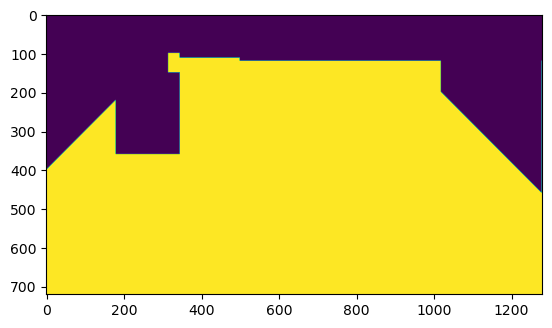

In [2]:
mask = np.ones((720,1280),dtype='uint8')
mask[100:360,180:345] = 0
mask[:112,:500] = 0
mask[:120,500:] = 0
mask[100:150,315:345] = 1
#mask[690:,:] = 0
for idx in range(400):
    mask[idx,range(400-idx)] = 0
for idx in range(260):
    mask[range(200+idx), 1279-260+idx] = 0
plt.imshow(mask)

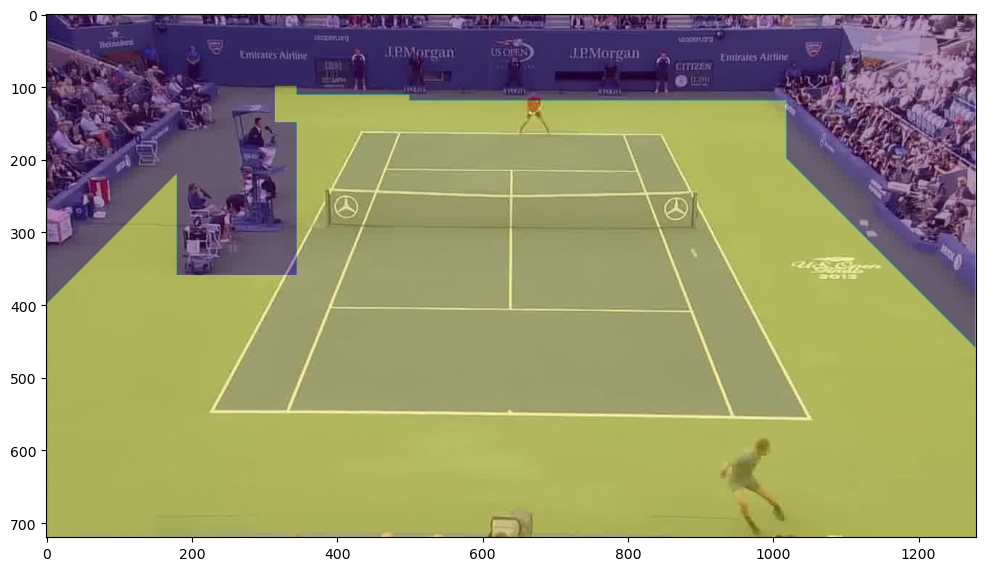

In [3]:
fig, ax = plt.subplots(1,1,figsize=(12,12))
ax.imshow(plt.imread(f'/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0900.jpg'))
ax.imshow(mask, alpha=0.4)     

In [4]:
import json
def numpy_decoder(obj):
    if isinstance(obj, list):
        try:
            return np.array(obj)
        except ValueError:
            pass
    return obj
with open('/Users/sanjaykarinje/Downloads/20k_usopen_2013_1_processed_res.json', 'r') as file:
    bbox_data1 = json.loads(file.read(), object_hook=numpy_decoder)

with open('/Users/sanjaykarinje/Downloads/usopen_2013_1_processed_res.json', 'r') as file:
    bbox_data2 = json.loads(file.read(), object_hook=numpy_decoder)

In [5]:
len(bbox_data1), len(bbox_data2)

(20000, 34395)

In [6]:
bbox_data1.update(bbox_data2)
len(bbox_data1)

54395

In [7]:
#player bb and kps
bbox_data = {}
for k,v in bbox_data1.items():
    k = k.replace('/home/ubuntu/test-storage/Users/sanjaykarinje/Downloads/match_frames_v2/','/Users/sanjaykarinje/Downloads/')
    bbox_data[k] = v

In [8]:
list(bbox_data.keys())[:10]

['/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0710.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0711.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0712.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0713.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0714.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0715.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0716.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0717.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0718.jpg',
 '/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0719.jpg']

In [9]:
#call coordinates
ball_df = pd.read_csv('/Users/sanjaykarinje/Downloads/test_usopen_2013_1.0_valid_imgs.txt_set_results.csv', index_col=0)
ball_df.drop(['gt_x','gt_y','r2'], axis=1, inplace=True)
ball_df.shape

(54558, 2)

In [10]:
#court keypoints & hm 
kp_df = pd.read_csv('/Users/sanjaykarinje/Downloads/usopen_2013_1_processed.csv', index_col=0)
kp_df['kp'] = kp_df['kp'].apply(lambda x: np.array(eval(x[1:-1])))
kp_df['hm'] = kp_df['hm'].apply(lambda x: np.array(eval(x[1:-1])))
kp_df.shape

(54395, 4)

In [11]:
kp_df.kp[10].shape

(14, 1, 2)

In [12]:
#merge all dfs
pd.set_option('display.max_rows',100)
ball_kp_df = kp_df.join(ball_df)
ball_kp_df.loc[ball_kp_df.pred_x<=5,'pred_x'] = np.nan
ball_kp_df.loc[ball_kp_df.pred_y<=5,'pred_y'] = np.nan
ball_kp_df.index = ball_kp_df.index.str.replace('/home/ubuntu/test-storage/Users/sanjaykarinje/Downloads/match_frames_v2','/Users/sanjaykarinje/Downloads')
ball_kp_df.head(2)

,kp,valid,hm,clip_num,pred_x,pred_y
/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0710.jpg,"[[[482.36813704332025, 195.91872988708386]], [...",True,"[[0.7503857249668618, -0.0023650286235911543, ...",0,NaN,NaN
/Users/sanjaykarinje/Downloads/usopen_2013_1.0/img_0711.jpg,"[[[481.82247925884775, 196.25295148511407]], [...",True,"[[0.7455061734527989, -0.013952439968895928, 1...",0,NaN,NaN


In [13]:
import cv2
import numpy as np
from operator import itemgetter

IMG_FOLDER = Path('/Users/sanjaykarinje/Downloads/usopen_2013_1.0/')

def box_area(b):
    x1,y1,x2,y2,_= b
    return int(abs(x2-x1)*abs(y2-y1))
 
def argmin(iterable, key=None):
    if key is None:
        key = lambda x: x
    min_val, min_idx = min((key(x), i) for i, x in enumerate(iterable))
    return min_idx, min_val

def argmax(iterable, key=None):
    if key is None:
        key = lambda x: x
    max_val, max_idx = max((key(x), i) for i, x in enumerate(iterable))
    return max_idx, max_val


def get_player_color(img_path, img_bbox):
    image = cv2.imread(img_path)
    (x1, y1, x2, y2,_) = map(int,img_bbox)
    roi = image[max(y1,0):y2, max(x1,0):x2]
    hsv = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    red_lower = np.array([160, 100, 100])
    red_upper = np.array([180, 255, 255])
    gray_lower = np.array([0, 0, 50])
    gray_upper = np.array([180, 30, 200])
    red_mask = cv2.inRange(hsv, red_lower, red_upper)
    gray_mask = cv2.inRange(hsv, gray_lower, gray_upper)
    red_percentage = int(cv2.countNonZero(red_mask) / (roi.shape[0] * roi.shape[1]) * 100)
    gray_percentage = int(cv2.countNonZero(gray_mask) / (roi.shape[0] * roi.shape[1]) * 100)
    box_c = 'red' if red_percentage > 0 else 'gray' 
    return box_c  



In [14]:
for f, row in ball_kp_df.iterrows():
    if row.kp.shape!=(14,1,2):
        print(f)

In [15]:
from collections import defaultdict
test_dict = defaultdict(list)
for k, v in bbox_data.items():
    test_dict[np.array(v).shape[0]].append(k)
for k, v in test_dict.items():
    print(f'{k}:{len(v)}')

2:38742
3:11382
4:2649
1:553
5:772
6:206
7:69
8:4
0:13
9:3
15:1
14:1


In [16]:
from natsort import natsorted
import typing

def offset_fname(f, offset, prefix='img_', suffix='.jpg'):
  img_num = int(f.replace(prefix,'').replace(suffix,''))+offset
  img_f = prefix+str(img_num).zfill(4)+suffix
  return img_f

def fname2int(f, offset=0, prefix='img_', suffix='.jpg'):
    return int(f.replace(prefix,'').replace(suffix,''))+offset

def r2_dist(a,b,axis=1,nan_dim=2):
    if not isinstance(a, np.ndarray): a = np.array(a)
    if not isinstance(b, np.ndarray): b = np.array(b)    
    
    if np.isnan(a).any() or np.isnan(b).any(): 
        return np.nan if nan_dim==1 else [np.nan,np.nan]*nan_dim
    return np.sqrt(np.sum((a-b)**2, axis=axis))

In [17]:
r2_dist(np.array([[np.nan,np.nan],[np.nan,np.nan]]),np.random.random((2,)),axis=1)

[nan, nan, nan, nan]

In [18]:
def select_player_box(bboxes, kps, prev_bb, player_side='n'):
    if len(bboxes)==0: return [np.nan], [np.nan]
    if len(bboxes)==1: return bboxes[0], kps[0]
    box_c_idx = np.argmin(bboxes[:,3]) if player_side=='n' else np.argmax(bboxes[:,3])
    if np.isnan(prev_bb).any(): return bboxes[box_c_idx], kps[box_c_idx]
    box_pp_idx = np.argmin([r2_dist(bbox[2:4],prev_bb[2:4],axis=0) for bbox in bboxes])
    return bboxes[box_pp_idx], kps[box_pp_idx]

In [19]:
# f = 'img_55449.jpg'
# img_path = str(IMG_FOLDER/f)
# bbox_data.get(img_path)

In [20]:
results = []
prev_n_bb, prev_f_bb = [np.nan], [np.nan]
for idx, (f, row) in enumerate(ball_kp_df.iterrows()):
    if (idx+1)%10000==0: print(idx+1)
    img_path = str(IMG_FOLDER/f)
    get_box, get_kp = itemgetter('bbox'), itemgetter('keypoints')
    player_boxes = np.array([get_box(item) for item in bbox_data.get(img_path)])
    player_kps = np.array([get_kp(item) for item in bbox_data.get(img_path)])
    if player_boxes.shape[0]==0 or max([box_area(box) for box in player_boxes]) > 20000: continue 
    court_center = row.kp.squeeze()[12:14].mean(axis=0)
    player_f = np.array([True if item[3]<court_center[1] else False for item in player_boxes])
    row['n_bb'], row['n_kp'] = select_player_box(player_boxes[~player_f], player_kps[~player_f], prev_n_bb, 'n')
    row['f_bb'], row['f_kp'] = select_player_box(player_boxes[player_f], player_kps[player_f], prev_f_bb, 'f')
    prev_n_bb, prev_f_bb = row['n_bb'], row['f_bb']
    row['n_p'] = get_player_color(img_path, row['n_bb']) if not np.isnan(row['n_bb']).any() else np.nan
    row['f_p'] = get_player_color(img_path, row['f_bb']) if not np.isnan(row['f_bb']).any() else np.nan
    results.append(row)

10000
20000
30000
40000
50000


In [21]:
results_df = pd.DataFrame(results)
results_df.rename({'pred_x':'x','pred_y':'y'}, axis=1, inplace=True)
results_df.index = results_df.index.str.replace('/Users/sanjaykarinje/Downloads/usopen_2013_1.0/','')
results_df.shape

/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_50918/4113275230.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  results_df.index = results_df.index.str.replace('/Users/sanjaykarinje/Downloads/usopen_2013_1.0/','')


(54343, 12)

In [22]:
results_df.loc[((results_df.x.isna())|(results_df.y.isna())),['x','y']] = np.array([np.nan, np.nan])
print(results_df.x.isna().sum(), results_df.y.isna().sum())
combined_array= np.column_stack((results_df.x.values, results_df.y.values))
results_df['ball_c']  = [arr for arr in combined_array]


18414 18414


In [23]:
#make players consistent across clip
for clip_num in results_df.clip_num.value_counts().index:
    clip_df = results_df[results_df.clip_num==clip_num]
    players, counts = np.unique(clip_df['n_p'].fillna('na'), return_counts=True)
    results_df.loc[results_df.clip_num==clip_num, 'n_p'] = players[np.argmax(counts)]
    players, counts = np.unique(clip_df['f_p'].fillna('na'), return_counts=True)
    results_df.loc[results_df.clip_num==clip_num, 'f_p'] = players[np.argmax(counts)]

In [24]:

def imshow_keypoints(img, pose_result, skeleton=None, kpt_score_thr=0.3, pose_kpt_color=None,
                     pose_link_color=None, radius=4, thickness=1, show_keypoint_weight=False):
    img_h, img_w, _ = img.shape
    for kpts in pose_result:

        kpts = np.array(kpts, copy=False)

        # draw each point on image
        if pose_kpt_color is not None:
            assert len(pose_kpt_color) == len(kpts)
            for kid, kpt in enumerate(kpts):
                x_coord, y_coord, kpt_score = int(kpt[0]), int(kpt[1]), kpt[2]
                if kpt_score > kpt_score_thr:
                    color = tuple(int(c) for c in pose_kpt_color[kid])
                    if show_keypoint_weight:
                        img_copy = img.copy()
                        cv2.circle(img_copy, (int(x_coord), int(y_coord)),
                                   radius, color, -1)
                        transparency = max(0, min(1, kpt_score))
                        cv2.addWeighted(
                            img_copy,
                            transparency,
                            img,
                            1 - transparency,
                            0,
                            dst=img)
                    else:
                        cv2.circle(img, (int(x_coord), int(y_coord)), radius,
                                   color, -1)

        # draw links
        if skeleton is not None and pose_link_color is not None:
            assert len(pose_link_color) == len(skeleton)
            for sk_id, sk in enumerate(skeleton):
                pos1 = (int(kpts[sk[0], 0]), int(kpts[sk[0], 1]))
                pos2 = (int(kpts[sk[1], 0]), int(kpts[sk[1], 1]))
                if (pos1[0] > 0 and pos1[0] < img_w and pos1[1] > 0
                        and pos1[1] < img_h and pos2[0] > 0 and pos2[0] < img_w
                        and pos2[1] > 0 and pos2[1] < img_h
                        and kpts[sk[0], 2] > kpt_score_thr
                        and kpts[sk[1], 2] > kpt_score_thr):
                    color = tuple(int(c) for c in pose_link_color[sk_id])
                    if show_keypoint_weight:
                        img_copy = img.copy()
                        X = (pos1[0], pos2[0])
                        Y = (pos1[1], pos2[1])
                        mX = np.mean(X)
                        mY = np.mean(Y)
                        length = ((Y[0] - Y[1])**2 + (X[0] - X[1])**2)**0.5
                        angle = math.degrees(
                            math.atan2(Y[0] - Y[1], X[0] - X[1]))
                        stickwidth = 2
                        polygon = cv2.ellipse2Poly(
                            (int(mX), int(mY)),
                            (int(length / 2), int(stickwidth)), int(angle), 0,
                            360, 1)
                        cv2.fillConvexPoly(img_copy, polygon, color)
                        transparency = max(
                            0, min(1, 0.5 * (kpts[sk[0], 2] + kpts[sk[1], 2])))
                        cv2.addWeighted(
                            img_copy,
                            transparency,
                            img,
                            1 - transparency,
                            0,
                            dst=img)
                    else:
                        cv2.line(img, pos1, pos2, color, thickness=thickness)

    return img


def show_result(img, result, skeleton=None, kpt_score_thr=0.3, bbox_color=None, pose_kpt_color=None,
                    pose_link_color=None, radius=4, thickness=1, font_scale=0.5, win_name='',
                    show=False, show_keypoint_weight=False, wait_time=0, out_file=None):
    img = img.copy()
    img_h, img_w, _ = img.shape

    pose_result = [result]
    #for res in result:
    #    pose_result.append(res['keypoints'])
    
    imshow_keypoints(img, pose_result, skeleton, kpt_score_thr, pose_kpt_color, pose_link_color, radius, thickness)

    if show:
        cv2.imshow(img, win_name, wait_time)

    if out_file is not None:
        cv2.imwrite(out_file, img)

    return img


def vis_pose_result(img, pose_result, radius=4, thickness=1, kpt_score_thr=0.3, 
                    bbox_color='green', show=False, out_file=None):
                        
    palette = np.array([[255, 128, 0], [255, 153, 51], [255, 178, 102],
                            [230, 230, 0], [255, 153, 255], [153, 204, 255],
                            [255, 102, 255], [255, 51, 255], [102, 178, 255],
                            [51, 153, 255], [255, 153, 153], [255, 102, 102],
                            [255, 51, 51], [153, 255, 153], [102, 255, 102],
                            [51, 255, 51], [0, 255, 0], [0, 0, 255],
                            [255, 0, 0], [255, 255, 255]])

    skeleton = [[15, 13], [13, 11], [16, 14], [14, 12], [11, 12],
                        [5, 11], [6, 12], [5, 6], [5, 7], [6, 8], [7, 9],
                        [8, 10], [1, 2], [0, 1], [0, 2], [1, 3], [2, 4],
                        [3, 5], [4, 6]]

    pose_link_color = palette[[
                0, 0, 0, 0, 7, 7, 7, 9, 9, 9, 9, 9, 16, 16, 16, 16, 16, 16, 16
            ]]
    pose_kpt_color = palette[[
                16, 16, 16, 16, 16, 9, 9, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0
            ]]

    
    img = show_result(img, pose_result, skeleton, radius=radius, thickness=thickness, pose_kpt_color=pose_kpt_color,
    pose_link_color=pose_link_color, kpt_score_thr=kpt_score_thr, bbox_color=bbox_color, show=show, out_file=out_file)
                        
    
    return img

In [25]:
def draw_bbox_with_label(image, bbox, kps=None, label_name=None):
    if np.isnan(bbox).any(): return image
    (x1, y1, x2, y2,_) = list(map(int,bbox))
    #print(x1,y1,x2,y2)
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    if label_name:
        text_size, _ = cv2.getTextSize(label_name, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 1)
        label_x = x1
        label_y = y1 - text_size[1] if y1 - text_size[1] > 0 else y1 + text_size[1] + 2
        cv2.rectangle(image, (label_x, label_y - text_size[1]), (label_x + text_size[0], label_y + text_size[1] // 2), (0, 0, 0), -1)
        cv2.putText(image, label_name, (label_x, label_y), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 1)
    if kps is not None: 
        image = vis_pose_result(img, kps)
    return image

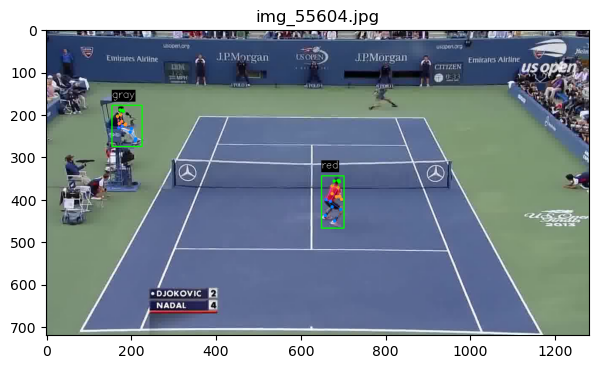

In [26]:
img_name = 'img_55604.jpg'
img_path = str(IMG_FOLDER/img_name)
img = cv2.imread(img_path)
img = draw_bbox_with_label(img, results_df.loc[img_name]['f_bb'], results_df.loc[img_name]['f_kp'], results_df.loc[img_name]['f_p'])
img = draw_bbox_with_label(img, results_df.loc[img_name]['n_bb'], results_df.loc[img_name]['n_kp'], results_df.loc[img_name]['n_p'])
plt.figure(figsize=(7,4))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
plt.title(img_name)
plt.show()

In [27]:
results_df['r1'] = np.sqrt((results_df['x']-results_df['x'].shift(1))**2+(results_df['y']-results_df['y'].shift(1))**2).round()
results_df['r2'] = np.sqrt((results_df['x']-results_df['x'].shift(-1))**2+(results_df['y']-results_df['y'].shift(-1))**2).round()
results_df['x'] = np.where(((results_df['r1']>=40) & (results_df['r2'] >=40)), np.nan, results_df['x'])
results_df['y'] = np.where(((results_df['r1']>=40) & (results_df['r2'] >=40)), np.nan, results_df['y'])
results_df['x'] = np.where(((results_df['r1']>=40) & (~results_df['x'].shift(1).isna())), np.nan, results_df['x'])

In [28]:
prev_row = results_df.iloc[0]
fs = []
final_fs = []
switch = False
for f, row in results_df.iterrows():
    if row.r1>=40:
        if len(fs)==0:
            switch = True
            fs.append(f)
        elif len(fs)<5:
            final_fs.extend(fs)
            switch = False
            fs = []
        else:
            fs = [f]
    elif switch:
        fs.append(f)

In [29]:
len(final_fs)

392

In [30]:
for f in final_fs:
    results_df.loc[f,['x','y']] = np.array([np.nan, np.nan])
    #print(results_df.loc[f,['x','y']])

In [473]:
serve_hit_pts.get(105)

['img_64627.jpg']

In [31]:
results_df.loc['img_2729.jpg','y'] = 74
results_df.loc['img_20966.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_20967.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_29835.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_27112.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_38706.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_99054.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_99055.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_99058.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_38670.jpg',['x','y']] = [248, 60]
results_df.loc['img_41768.jpg',['x','y','f_bdist']] = [302, 64, 50]
results_df.loc['img_41766.jpg',['x','y']] = [299, 65]
results_df.loc['img_55605.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_55615.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_55603.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_59604.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_81393.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_20966.jpg':'img_20967.jpg'][['x','y']] = np.array([np.nan, np.nan])
results_df.loc['img_55751.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_55719.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_55720.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_1807.jpg' ,['x','y']] = [np.nan, np.nan]
results_df.loc['img_28709.jpg':'img_28710.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['mg_74184.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_29834.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_61622.jpg':'img_61627.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_75250.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_76624.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_78766.jpg':'img_78768.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_61683.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_91092.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_2729.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_20805.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_26757.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_26853.jpg':'img_26857.jpg',['x','y']]  = [np.nan, np.nan]
results_df.loc['img_46368.jpg',['x','y']] = [np.nan, np.nan]
results_df.loc['img_4259.jpg',['x','y']] = [400,191]

/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_50918/7758295.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_df.loc['img_20966.jpg':'img_20967.jpg'][['x','y']] = np.array([np.nan, np.nan])


In [32]:
assert offset_fname('img_10811.jpg',-1)=='img_10810.jpg'
assert offset_fname('img_10811.jpg', 0)=='img_10811.jpg'
assert offset_fname('img_10811.jpg', 1)=='img_10812.jpg'

In [33]:
results_df['n_hs'] = results_df['n_kp'].map(lambda x: np.array(x)[9:11][:,:2] if not np.isnan(x).any() else [np.nan])
results_df['f_hs'] = results_df['f_kp'].map(lambda x: np.array(x)[9:11][:,:2] if not np.isnan(x).any() else [np.nan])
results_df['n_ls'] = results_df['n_kp'].map(lambda x: np.array(x)[15:17][:,:2] if not np.isnan(x).any() else [np.nan])
results_df['f_ls'] = results_df['f_kp'].map(lambda x: np.array(x)[15:17][:,:2] if not np.isnan(x).any() else [np.nan])
results_df['n_bs']  = results_df['n_kp'].map(lambda x: np.array(x)[:4][:,:2] if not np.isnan(x).any() else [np.nan])
results_df['f_bs']  = results_df['f_kp'].map(lambda x: np.array(x)[:4][:,:2] if not np.isnan(x).any() else [np.nan])
results_df['n_bdist'] = results_df.apply(lambda row: r2_dist(np.array([row['x'],row['y']])*2,row['n_hs'], axis=1)[1 if row.n_p=='red' else 0], axis=1)
results_df['f_bdist'] = results_df.apply(lambda row: r2_dist(np.array([row['x'],row['y']])*2,row['f_hs'], axis=1)[1 if row.f_p=='red' else 0], axis=1)

results_df['n_l'] = results_df['n_kp'].map(lambda x: np.array(x)[15:17][:,:2].mean(axis=0) if not np.isnan(x).any() else np.nan)
results_df['f_l'] = results_df['f_kp'].map(lambda x: np.array(x)[15:17][:,:2].mean(axis=0) if not np.isnan(x).any() else np.nan)
results_df['n_l_t1'] = results_df['n_l'].shift(1)
results_df['f_l_t1'] = results_df['f_l'].shift(1)
results_df['n_l_d'] = ((results_df['n_l_t1'] - results_df['n_l'])**2).map(lambda x: np.sqrt(np.sum(x)))
results_df['f_l_d'] = ((results_df['f_l_t1'] - results_df['f_l'])**2).map(lambda x: np.sqrt(np.sum(x)))
results_df['n_l_d'] = np.where(results_df['clip_num']!=results_df['clip_num'].shift(1), np.nan, results_df['n_l_d'])
results_df['f_l_d'] = np.where(results_df['clip_num']!=results_df['clip_num'].shift(1), np.nan, results_df['f_l_d'])


results_df['vec_x1'] = results_df['x'] - results_df['x'].shift(1)
results_df['vec_y1'] = results_df['y'] - results_df['y'].shift(1)
results_df['vec_mod'] = np.sqrt(results_df['vec_x1']**2+results_df['vec_y1']**2)
results_df['vec_mod'] = results_df['vec_mod'].shift(-1).fillna(method='bfill')
results_df['vec_mod_delta'] = results_df['vec_mod'] - results_df['vec_mod'].shift(1) 

In [38]:
#add attributes required for serve
results = []
for f, row in results_df.iterrows():
    n_kp, f_kp = np.array(row.n_kp), np.array(row.f_kp)
    hraised = False
    hraised_side = np.nan
    ball_c = np.array([0,0])
    bdist = None
    h_idx = None
    lcdist = None
    for idx, kp in enumerate([n_kp, f_kp]):
        if np.isnan(kp).any(): continue
        if not np.isnan([row.x, row.y]).any(): ball_c = np.array([row.x*2, row.y*2])
        try: 
            head_y, hand_y, leg_y = max(kp[1:3][:,1]), min(kp[9:11][:,1]), np.mean(kp[15:16][:,1])
            dist = min(r2_dist(kp[1:3][:,:2], ball_c))
            #if row.clip_num==143: print(f, round(hand_y), round(head_y), round(dist), ball_c)
        except:
            print(f,kp,type(kp),ball_c,np.isnan(ball_c).any(),r2_dist(kp[1:3][:,:2], ball_c))
        if hand_y <= head_y and dist is not None and dist<200: 
            #if row.clip_num==143: print('inside',f, round(hand_y), round(head_y), round(dist), ball_c, idx)
            hraised = True
            bdist=dist
            h_idx = idx
            lcdist = None
            hraised_side = 'F' if leg_y<300 else 'N' if leg_y>=300 else np.nan
            if not (row.kp==None).any(): 
                lcdist = r2_dist(row.kp.squeeze()[[2,3,5,7]].mean(axis=0), row.n_ls.mean(axis=0), axis=0) if idx==0 else r2_dist(row.kp.squeeze()[[0,1,4,6]].mean(axis=0), row.f_ls.mean(axis=0), axis=0)
    row['hraised'] = hraised
    row['hraised_side'] = hraised_side
    row['hraised_bdist'] = bdist
    row['h_idx'] = h_idx
    row['lcdist'] = lcdist
    row['lcdist_inc'] = lcdist<45 if h_idx==1 else lcdist<100 if h_idx==0 else None
    results.append(row)

In [39]:
results_df = pd.DataFrame(results)

In [44]:
#143 - missed serve
#100, 102 - split but shoudl be single point 
with pd.option_context('mode.chained_assignment', None):
    clip_num = 33
    prev_f_num = 0
    serve_fs = []
    clip_df = results_df.loc[results_df.clip_num==clip_num]
    clip_df.loc[:,'raised_cumm'] = clip_df['hraised'].rolling(20).sum().shift(-19)
    clip_df.loc[:,'vec_cumm'] = abs(clip_df['vec_x1']).rolling(10, min_periods=5).mean().shift(-9)
    clip_df.loc[:,'d_cumm'] = np.where(clip_df.h_idx==0, abs(clip_df['n_l_d']).rolling(10, min_periods=5).sum(), abs(clip_df['f_l_d']).rolling(10, min_periods=5).sum())
    clip_df.loc[:,'d_cumm'] = clip_df.loc[:,'d_cumm'].shift(2)
    clip_df.loc[:,'d_cumm'] = clip_df.loc[:,'d_cumm'].fillna(method='bfill')
    for f in clip_df[((clip_df.vec_cumm<=1.5) & (clip_df.raised_cumm>5) & (clip_df.hraised==True) & (clip_df.hraised_bdist<85) & (clip_df.d_cumm<32) & (clip_df.lcdist_inc==True))].index.values:
    #for f in clip_df[((clip_df.vec_cumm<=1.5) & (clip_df.raised_cumm>=5) & (clip_df.hraised==True) & (clip_df.hraised_bdist<85) & (clip_df.d_cumm<25) )].index.values:
    #for f in clip_df[((clip_df.vec_cumm<=1) & (clip_df.raised_cumm>5) & (clip_df.hraised==True) & (clip_df.hraised_bdist<80) )].index.values:
       f_num = int(f.replace('img_','').replace('.jpg',''))
       if f_num > prev_f_num+30: serve_fs.append(f)
       prev_f_num = f_num
    print(clip_num, clip_df.shape[0],serve_fs) 
    print(clip_df.index[0], clip_df.index[-1])
#208, 174, 209

33 730 ['img_12463.jpg', 'img_12820.jpg']
img_12342.jpg img_13071.jpg


In [41]:
#clip_df.loc['img_88780.jpg':][['hraised','hraised_bdist','raised_cumm','vec_cumm','x','y','vec_x1','vec_y1','f_l','n_l_d','f_l_d','h_idx','d_cumm','lcdist','lcdist_inc']]

In [42]:
serve_pts = defaultdict(list)
with pd.option_context('mode.chained_assignment', None):
    for clip_num in results_df.clip_num.value_counts().sort_index().index.values:
        prev_f_num = 0
        serve_fs = []
        clip_df = results_df.loc[results_df.clip_num==clip_num]
        clip_df.loc[:,'raised_cumm'] = clip_df['hraised'].rolling(20).sum().shift(-19)
        clip_df.loc[:,'vec_cumm'] = abs(clip_df['vec_x1']).rolling(10, min_periods=5).mean().shift(-9)
        clip_df.loc[:,'d_cumm'] = np.where(clip_df.h_idx==0, abs(clip_df['n_l_d']).rolling(10, min_periods=5).sum(), abs(clip_df['f_l_d']).rolling(10, min_periods=5).sum())
        clip_df.loc[:,'d_cumm'] = clip_df.loc[:,'d_cumm'].shift(2)
        clip_df.loc[:,'d_cumm'] = clip_df.loc[:,'d_cumm'].fillna(method='bfill')
        #for f in clip_df[((clip_df.vec_cumm<=1.5) & (clip_df.raised_cumm>=5) & (clip_df.hraised==True) & (clip_df.hraised_bdist<85) & (clip_df.d_cumm<25) )].index.values:
        for f in clip_df[((clip_df.vec_cumm<=1.5) & (clip_df.raised_cumm>5) & (clip_df.hraised==True) & (clip_df.hraised_bdist<85) & (clip_df.d_cumm<32) & (clip_df.lcdist_inc==True))].index.values:
            f_num = int(f.replace('img_','').replace('.jpg',''))
            if f_num > prev_f_num+30: 
                serve_pts[clip_num].append(f)
            prev_f_num = f_num
        print(clip_num, clip_df.shape[0],serve_pts[clip_num], len(serve_pts[clip_num]) )#,clip_df.index[0], clip_df.index[-1]) 
        plot_chart = False
        if plot_chart:
            if len(serve_pts[clip_num]) > 0:
                fig, axes = plt.subplots(1,len(serve_pts[clip_num]), figsize=(14,14))
                if not isinstance(axes, np.ndarray): 
                    img_path = str(IMG_FOLDER/serve_pts[clip_num][0])
                    img = cv2.imread(img_path)
                    img = draw_bbox_with_label(img, results_df.loc[serve_pts[clip_num][0]]['f_bb'], results_df.loc[serve_pts[clip_num][0]]['f_kp'], results_df.loc[serve_pts[clip_num][0]]['f_p'])
                    img = draw_bbox_with_label(img, results_df.loc[serve_pts[clip_num][0]]['n_bb'], results_df.loc[serve_pts[clip_num][0]]['n_kp'], results_df.loc[serve_pts[clip_num][0]]['n_p'])
                    axes.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
                    axes.set_title(f'clip_{clip_num}_{serve_pts[clip_num][0]}')
                else:
                    for ax,serve_f in zip(axes,serve_pts[clip_num]):              
                        img_path = str(IMG_FOLDER/serve_f)
                        img = cv2.imread(img_path)
                        img = draw_bbox_with_label(img, results_df.loc[serve_f]['f_bb'], results_df.loc[serve_f]['f_kp'], results_df.loc[serve_f]['f_p'])
                        img = draw_bbox_with_label(img, results_df.loc[serve_f]['n_bb'], results_df.loc[serve_f]['n_kp'], results_df.loc[serve_f]['n_p'])
                        ax.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
                        ax.set_title(f'clip_{clip_num}_{serve_f}')


0.0 466 ['img_0769.jpg'] 1
1.0 621 ['img_1580.jpg'] 1
2.0 733 [] 0
3.0 615 [] 0
4.0 569 ['img_5370.jpg'] 1
5.0 355 ['img_6302.jpg'] 1
6.0 546 ['img_7131.jpg'] 1
7.0 809 ['img_8140.jpg'] 1
8.0 351 ['img_9205.jpg'] 1
32.0 1014 ['img_10791.jpg'] 1
33.0 730 ['img_12463.jpg', 'img_12820.jpg'] 2
35.0 381 ['img_13859.jpg'] 1
36.0 361 ['img_14283.jpg'] 1
37.0 455 ['img_15420.jpg'] 1
38.0 516 ['img_16213.jpg'] 1
39.0 230 ['img_17269.jpg'] 1
40.0 474 ['img_17592.jpg'] 1
46.0 301 ['img_18775.jpg'] 1
47.0 315 ['img_19124.jpg'] 1
48.0 352 ['img_19982.jpg'] 1
49.0 745 ['img_20331.jpg', 'img_20739.jpg'] 2
56.0 256 ['img_21827.jpg'] 1
57.0 183 [] 0
58.0 555 ['img_23181.jpg'] 1
59.0 1057 ['img_24325.jpg', 'img_24672.jpg'] 2
60.0 402 ['img_25894.jpg'] 1
61.0 828 ['img_26622.jpg'] 1
62.0 467 ['img_28135.jpg'] 1
63.0 245 ['img_28593.jpg'] 1
64.0 692 ['img_29570.jpg'] 1
65.0 575 ['img_30636.jpg'] 1
66.0 924 ['img_31619.jpg'] 1
67.0 1057 ['img_32930.jpg', 'img_33288.jpg'] 2
69.0 631 [] 0
70.0 979 ['img_3576

In [45]:
window_size = 29
min_window = 1
results_df['x_minf'] = results_df['x'].rolling(window_size, min_periods=min_window).min().shift(-(window_size-1))
results_df['x_minp'] = results_df['x'].rolling(window_size, min_periods=min_window).min()
results_df['x_maxf'] = results_df['x'].rolling(window_size, min_periods=min_window).max().shift(-(window_size-1))
results_df['x_maxp'] = results_df['x'].rolling(window_size, min_periods=min_window).max()

results_df['y_minf'] = results_df['y'].rolling(window_size, min_periods=min_window).min().shift(-(window_size-1))
results_df['y_minp'] = results_df['y'].rolling(window_size, min_periods=min_window).min()
results_df['y_maxf'] = results_df['y'].rolling(window_size, min_periods=min_window).max().shift(-(window_size-1))
results_df['y_maxp'] = results_df['y'].rolling(window_size, min_periods=min_window).max()


In [46]:
f_cond, n_cond = ((results_df.y <= results_df.y_minp) & (results_df.y <= results_df.y_minf)), \
                 ((results_df.y >= results_df.y_maxp) & (results_df.y >= results_df.y_maxf) & (results_df.y >= 100)) 

x_cond = ((results_df.x <= results_df.x_minp) & (results_df.x <= results_df.x_minf)) | \
         ((results_df.x >= results_df.x_maxp) & (results_df.x >= results_df.x_maxf))

bdist_cond = ((results_df.n_bdist <= 130)|(results_df.f_bdist <= 130))

results_df['xturn'] = (x_cond) 

results_df['yturn'] = (f_cond | n_cond )

results_df['only_turn'] = (f_cond | n_cond | x_cond) 

results_df['turn'] = (f_cond | n_cond | x_cond) & (bdist_cond)

results_df['side'] = np.where(f_cond, 'F', np.where(n_cond, 'N', np.where(results_df.f_bdist<120, 'F', np.where(results_df.n_bdist, 'N', np.nan))))

results_df['side'] = np.where(f_cond, 'F', np.where(n_cond, 'N', \
                     np.where(results_df.f_bdist<120, 'F', \
                     np.where(results_df.n_bdist<120, 'N', \
                     np.where(results_df.f_bdist<results_df.n_bdist, 'F', \
                     np.where(results_df.n_bdist<results_df.f_bdist, 'N',np.nan))))))
                          

results_df.loc['img_55456.jpg',['turn']] = [True]
results_df.loc['img_55588.jpg':'img_55591.jpg','side'] = 'F'
results_df.loc['img_55588.jpg':'img_55591.jpg','turn'] = True
results_df.loc['img_56721.jpg',['turn','side']] = [True, 'F']


In [47]:
clip_num = 87
results_df[((results_df.clip_num==clip_num) & (results_df.turn==True))].index.values

array(['img_55217.jpg', 'img_55228.jpg', 'img_55248.jpg', 'img_55283.jpg',
       'img_55301.jpg', 'img_55307.jpg', 'img_55317.jpg', 'img_55319.jpg',
       'img_55320.jpg', 'img_55321.jpg', 'img_55333.jpg', 'img_55336.jpg',
       'img_55337.jpg', 'img_55338.jpg', 'img_55339.jpg', 'img_55340.jpg',
       'img_55348.jpg', 'img_55349.jpg', 'img_55350.jpg', 'img_55456.jpg',
       'img_55488.jpg', 'img_55489.jpg', 'img_55490.jpg', 'img_55491.jpg',
       'img_55492.jpg', 'img_55493.jpg', 'img_55505.jpg', 'img_55534.jpg',
       'img_55553.jpg', 'img_55588.jpg', 'img_55589.jpg', 'img_55590.jpg',
       'img_55591.jpg', 'img_55644.jpg', 'img_55647.jpg', 'img_55670.jpg',
       'img_55671.jpg', 'img_55673.jpg', 'img_55694.jpg', 'img_55698.jpg',
       'img_55699.jpg', 'img_55735.jpg', 'img_55756.jpg', 'img_55757.jpg',
       'img_55758.jpg'], dtype=object)

In [48]:
clip_num = 88
prev_f_num, fs, final_fs = 1e6, [], []
for f in results_df[((results_df.clip_num==clip_num) & (results_df.turn==True))].index.values:
    f_num = int(f.replace('img_','').replace('.jpg',''))
    #y = results_df.loc[f,'y']
    #print(f'fnum: {f_num} prev_fnum: {prev_f_num}')
    x_turn, y_turn = ~results_df.loc[f,'xturn'], ~results_df.loc[f,'yturn']
    if f_num < prev_f_num+20:
        fs.append((f,x_turn,y_turn))
    elif len(fs)>0:
        #print(fs)
        #print(f"test: {sorted(fs, key=lambda x: (x[1],x[0]))}")
        final_fs.append(sorted(fs, key=lambda x: (x[1],x[2],x[0]))[0][0])
        fs = [(f,x_turn,y_turn)]
    else:
        fs = [(f,x_turn,y_turn)]
    #print(f'fs: {fs}')
    #stored_y = y 
    prev_f_num = f_num
     
if len(fs)>0: final_fs.append(sorted(fs, key=lambda x: (x[1],x[2],x[0]))[0][0])
print(final_fs)

['img_56613.jpg', 'img_56664.jpg', 'img_56721.jpg', 'img_56760.jpg', 'img_56795.jpg', 'img_56849.jpg', 'img_56898.jpg', 'img_56935.jpg', 'img_56968.jpg', 'img_57010.jpg', 'img_57045.jpg', 'img_57081.jpg']


In [49]:
# pd.set_option('display.max_rows', 200)
# results_df.loc['img_55694.jpg':'img_55717.jpg'][['x','y','y_minp','y_minf','x_maxp','x_maxf','xturn','yturn','turn','n_bdist','f_bdist']]

In [50]:
# return_pts = defaultdict(list)
# for clip_num in results_df.clip_num.value_counts().index.sort_values().values:
#     prev_f_num, fs, final_fs = 1e6, [], []
#     for f in results_df[((results_df.clip_num==clip_num) & (results_df.turn==True))].index.values:
#         f_num = int(f.replace('img_','').replace('.jpg',''))
#         #y = results_df.loc[f,'y']
#         #print(f'fnum: {f_num} prev_fnum: {prev_f_num}')
#         x_turn, y_turn = ~results_df.loc[f,'xturn'], ~results_df.loc[f,'yturn']
#         if f_num < prev_f_num+20:
#             fs.append((f,x_turn,y_turn))
#         elif len(fs)>0:
#             #print(fs)
#             #print(f"test: {sorted(fs, key=lambda x: (x[1],x[0]))}")
#             final_fs.append(sorted(fs, key=lambda x: (x[1],x[2],x[0]))[0][0])
#             fs = [(f,x_turn,y_turn)]
#         else:
#             fs = [(f,x_turn,y_turn)]
#         #print(f'fs: {fs}')
#         #stored_y = y 
#         prev_f_num = f_num
         
#     if len(fs)>0: final_fs.append(sorted(fs, key=lambda x: (x[1],x[2],x[0]))[0][0])
#     return_pts[clip_num] = final_fs
# #serve_pts.get(clip_num), end_pts_mod.get(clip_num)

In [51]:
def check_nan(value):
    if isinstance(value, np.ndarray):
        # If the value is a NumPy array
        if np.isnan(value).any():
            return True
    else:
        # If the value is a numeric type
        if np.isnan(value):
            return True 
    return False

In [52]:
#calc_delta_per_frame_backward(clip_df[:40], 'y')[:40]

In [53]:
import warnings
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action='ignore', category=(SettingWithCopyWarning))
warnings.filterwarnings("ignore", category=FutureWarning)
    
pd.set_option('display.max_rows',1000)
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=FutureWarning)
    
    def calc_delta_per_frame(df, column_name):
        result = pd.Series(index=df.index)
        for f, row in df.iterrows():
            current_value = row[column_name]
            i = df.index.get_loc(f)
            if i > len(df)-10:
                result.iloc[i] = np.nan
                continue 
            for j in range(i+1, i+11):
                if j<len(df): next_value = df.iloc[j][column_name]
                if not check_nan(next_value):
                    break
            if not check_nan(next_value):
                #print(current_value, next_value, r2_dist(current_value,next_value, axis=0), (j-i),  r2_dist(current_value,next_value, axis=0)/(j-i))
                n_frames = fname2int(df.iloc[j].name) - fname2int(f)
                #if n_frames>(j-i): print(f'mismatch: {results_df.iloc[j].name}, j-i: {j-i}, n_frames: {n_frames}')
                if isinstance(current_value, (int, float)) and isinstance(next_value, (int, float)):
                     #if f=='img_25012.jpg': print(f'f {f} {df.iloc[j].name} j-i {(j - i)} n_frames {n_frames} {(next_value-current_value)/max((j - i),n_frames)}')
                     result.iloc[i] = (next_value-current_value)/max((j - i),n_frames)
                else:
                    result.iloc[i] = r2_dist(current_value,next_value, axis=0, nan_dim=1)/max((j - i),n_frames)
        return result 

    
    
    def gen_clip_candidates(df, clip_num):
        clip_df = df.loc[df.clip_num==clip_num]
        clip_df.loc[:,'x_vel'] = calc_delta_per_frame(clip_df, 'x')
        clip_df.loc[:,'y_vel'] = calc_delta_per_frame(clip_df, 'y')
        clip_df.loc[:,'ball_vel'] = calc_delta_per_frame(clip_df, 'ball_c')
        
        clip_df.loc[:,'x_acc'] = calc_delta_per_frame(clip_df, 'x_vel').shift(1)
        clip_df.loc[:,'y_acc'] = calc_delta_per_frame(clip_df, 'y_vel').shift(1)
        clip_df.loc[:,'ball_acc'] = calc_delta_per_frame(clip_df, 'ball_vel').shift(1)

        cond1 = clip_df.ball_acc>8
        cond2 = clip_df.x_acc>=3
        cond3 = clip_df.x_acc>=3
        
        #return clip_df[['x','y','x_acc','y_acc','ball_vel','ball_acc']]
        
        candidates = clip_df.loc[(cond1 | cond2)].index.values
        out_fs, prev_f_num = [], 0
        for f in candidates:
            #if clip_df.iloc[max(0,clip_df.index.get_loc(f)-10):min(clip_df.index.get_loc(f)+10,len(clip_df))]['x'].isna().sum() <=10:
                f_num = int(f.replace('img_','').replace('.jpg',''))         
                if f_num>prev_f_num+6:
                    out_fs.append(f)
                    prev_f_num=f_num
        sel_cols = ['x','y','x_acc','y_acc','ball_vel','ball_acc']
        return  clip_df, clip_df.loc[(cond1 | cond2), sel_cols], out_fs

    def filter_clip(df, clip_num):
        return df.loc[df.clip_num==clip_num]
    
    def add_vel_acc(df):
        df.loc[:,'x_vel'] = calc_delta_per_frame(df, 'x')
        df.loc[:,'y_vel'] = calc_delta_per_frame(df, 'y')
        df.loc[:,'ball_vel'] = calc_delta_per_frame(df, 'ball_c')
        
        df.loc[:,'x_acc'] = calc_delta_per_frame(df, 'x_vel').shift(1)
        df.loc[:,'y_acc'] = calc_delta_per_frame(df, 'y_vel').shift(1)
        df.loc[:,'ball_acc'] = calc_delta_per_frame(df, 'ball_vel').shift(1)
        


In [54]:
def hand2box_dist(bbox, hands):
    if np.isnan(hands).any() or np.isnan(bbox).any():
        return np.nan
    return r2_dist(bbox[:4].reshape(2,2).mean(axis=0),hands)

In [55]:
results_df['n_h2bb'] = results_df.apply(lambda row: hand2box_dist(row.n_bb, row.n_hs), axis=1)
results_df['f_h2bb'] = results_df.apply(lambda row: hand2box_dist(row.f_bb, row.f_hs), axis=1)

In [56]:
results_df['n_h2bb_delta'] = abs(results_df['n_h2bb'] - results_df['n_h2bb'].shift(1))
results_df['f_h2bb_delta'] = abs(results_df['f_h2bb'] - results_df['f_h2bb'].shift(1))

In [57]:
def calc_hs_dist_cumm(df, column_name):
    result = pd.DataFrame(index=df.index, columns=['A'])
    for f, row in df.iterrows():
        i = df.index.get_loc(f)
        row_slice = slice(max(0,i-10),min(len(df),i))
        result.iloc[i,0] = np.max(df[row_slice][column_name].mean(axis=0))
    return result 

In [58]:
#calc_hs_dist_cumm(results_df, 'f_h2bb_delta')[:100]

In [59]:
results_df['n_h2bb_cumm'] = calc_hs_dist_cumm(results_df, 'n_h2bb_delta')
results_df['f_h2bb_cumm'] = calc_hs_dist_cumm(results_df, 'f_h2bb_delta')

In [60]:
results_df['n_l_d40_calc'] = results_df['n_l_d'].rolling(40, min_periods=30).mean()
results_df['f_l_d40_calc'] = results_df['f_l_d'].rolling(40, min_periods=30).mean()
results_df['n_l_f40_calc'] = results_df['n_l_d40_calc'].shift(-40)
results_df['f_l_f40_calc'] = results_df['f_l_d40_calc'].shift(-40)

In [61]:
#results_df.loc[(results_df.clip_num==0),['n_h2bb_cumm','f_h2bb_cumm']]

In [62]:
def add_theta(df, t=1):
    df['x_p'+str(t)] = df['x'].rolling(t, min_periods=max(1,t-2)).mean().shift(1).round(1)
    df['y_p'+str(t)] = df['y'].rolling(t, min_periods=max(1,t-2)).mean().shift(1).round(1)
    df['x_f'+str(t)] = df['x'].rolling(t, min_periods=max(1,t-2)).mean().shift(-t).round(1)
    df['y_f'+str(t)] = df['y'].rolling(t, min_periods=max(1,t-2)).mean().shift(-t).round(1)
    #df['vec_x'+str(t)] = df['x_f'+str(t)] - df['x_p'+str(t)]
    #df['vec_y'+str(t)] = df['y_f'+str(t)] - df['y_p'+str(t)]
    df['vec_x'+str(t)] = df['x_f'+str(t)] - df['x']
    df['vec_y'+str(t)] = df['y_f'+str(t)] - df['y']
    df['vec_mod'+str(t)] = np.sqrt(df['vec_x'+str(t)]**2+df['vec_y'+str(t)]**2).round(1)
    df['vec_mod'+str(t)] = df['vec_mod'+str(t)].fillna(method='bfill')
    df['theta'+str(t)] = (np.arctan(np.abs(df['vec_y'+str(t)]/df['vec_x'+str(t)]))*180/math.pi).round()
    df['theta'+str(t)] = np.where(df['vec_mod'+str(t)]>55,np.nan,df['theta'+str(t)])    
   
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]>0) & (df['vec_y'+str(t)]>0)), df['theta'+str(t)], df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]>0) & (df['vec_y'+str(t)]<0)),  360-df['theta'+str(t)], df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]<0) & (df['vec_y'+str(t)]<0)), 180+df['theta'+str(t)], df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]<0) & (df['vec_y'+str(t)]>0)), 180-df['theta'+str(t)], df['theta'+str(t)])
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]==0) & (df['vec_y'+str(t)]>0)), 90, df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]==0) & (df['vec_y'+str(t)]<0)), 270, df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]>0) & (df['vec_y'+str(t)]==0)), 360, df['theta'+str(t)]) 
    df['theta'+str(t)] = np.where(((df['vec_x'+str(t)]<0) & (df['vec_y'+str(t)]==0)), 180, df['theta'+str(t)]) 
    df['theta'+str(t)] = df['theta'+str(t)].fillna(method='bfill')
    
    df['theta'+str(t)+'_delta'] = abs(df['theta'+str(t)] - df['theta'+str(t)].shift(1))
    df['theta'+str(t)+'_delta'] = np.where(df['theta'+str(t)+'_delta'] > 180, 360-df['theta'+str(t)+'_delta'], df['theta'+str(t)+'_delta']) 
    cond1 = df['theta'+str(t)]>df['theta'+str(t)].shift(1)
    cond2 = (df['theta'+str(t)]>=0) & (df['theta'+str(t)]<=90) & (df['theta'+str(t)].shift(1)>=270) & (df['theta'+str(t)].shift(1)<=360)
    df['theta'+str(t)+'_delta']  = np.where(cond1|cond2 , df['theta'+str(t)+'_delta'], -df['theta'+str(t)+'_delta'])
    df['theta'+str(t)+'_delta_cumm'] = df['theta'+str(t)+'_delta'].rolling(3).sum().shift(-2).round(1)
    

In [63]:
# serve_hit_pts = defaultdict(list)
# for clip_num, fs in serve_pts.items():
#     for f in fs:
#         f_40 = offset_fname(f,40)
#         clip_df = results_df.loc[f:f_40]
#         cond1 = (clip_df.vec_mod>=8.9) & (~clip_df.x.isna())
#         tmp_df = clip_df[cond1]
#         #cond2 = (clip_df.vec_mod_delta>6) & (~clip_df.x.isna())
#         #if tmp_df.shape[0]==0: tmp_df = clip_df[cond2]
#         f_h, vec_mod, vec_mod_delta = tmp_df.index.values[0] if tmp_df.shape[0]>0 else None, \
#                                       round(tmp_df.iloc[0]['vec_mod'],1) if tmp_df.shape[0]>0 else None, \
#                                       round(tmp_df.iloc[0]['vec_mod_delta'],1) if tmp_df.shape[0]>0 else None
        
#         f_p1, vec_mod_p1 = offset_fname(f_h,-1) if tmp_df.shape[0]>0 else None, \
#                            round(results_df.loc[offset_fname(f_h,-1)]['vec_mod'],1) if tmp_df.shape[0]>0 else None
#         if vec_mod_p1 is not None and vec_mod_p1>=5.0: 
#             f_h = f_p1
#             vec_mod = vec_mod_p1
#             vec_mod_p1 = round(results_df.loc[offset_fname(f_h,-1)]['vec_mod'],1) if tmp_df.shape[0]>0 else None

#         serve_hit_pts[clip_num].append(f_h) 
#         print(f'clip: {clip_num} start:{f} serve:{f_h} vec_mod:{vec_mod} vec_mod_p1:{vec_mod_p1}')
        
#         plot_chart=True
#         if f_h is not None and plot_chart:
#             fig, axes = plt.subplots(1,3,figsize=(20,10))
#             for idx, (ax,img_name) in enumerate(zip(axes,[offset_fname(f_h,-1), f_h, offset_fname(f_h,1)])):
#                 img_path = str(IMG_FOLDER/img_name)
#                 img = cv2.imread(img_path)
#                 #img = draw_bbox_with_label(img, results_df.loc[img_name]['f_bb'], results_df.loc[img_name]['f_kp'], results_df.loc[img_name]['f_p'])
#                 #img = draw_bbox_with_label(img, results_df.loc[img_name]['n_bb'], results_df.loc[img_name]['n_kp'], results_df.loc[img_name]['n_p'])
#                 x, y = results_df.loc[img_name]['x'], results_df.loc[img_name]['y']
#                 if not any([np.isnan(x),np.isnan(y)]):
#                     cv2.circle(img, (int(x)*2, int(y)*2), 5, (0, 0, 255), -1)
#                 ax.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
#                 ax.set_title(img_name+'_'+str(y)+'_'+str(x)+'_'+str(vec_mod_p1 if idx==0 else vec_mod))

In [65]:
import math
clip_num = 6
clip_df = filter_clip(results_df, clip_num)
add_vel_acc(clip_df)
add_theta(clip_df)
clip_serve_poses = serve_pts.get(clip_num)
clip_pt_hits = [[] for _ in range(len(clip_serve_poses))] if clip_serve_poses else [[]]
if clip_serve_poses:
        for idx,s in enumerate(clip_serve_poses):
            c = clip_df.iloc[clip_df.index.get_loc(s)+60].name
            s_cands = clip_df.loc[s:c][clip_df.loc[s:c,'ball_acc']>8].index.values
            s_cands = clip_df.loc[s:c][clip_df.loc[s:c,'ball_vel']>8.5].index.values if len(s_cands)==0 else s_cands
            print(s_cands)
            clip_pt_hits[idx].append((s_cands[0],'S'))
            print(f"clip: {clip_num}, {s} {clip_pt_hits[idx]} {clip_df.loc[s_cands[0],['f_bdist','n_bdist']].values.tolist()}")
   

['img_7151.jpg' 'img_7154.jpg' 'img_7155.jpg' 'img_7156.jpg'
 'img_7157.jpg' 'img_7158.jpg' 'img_7159.jpg' 'img_7160.jpg'
 'img_7161.jpg' 'img_7172.jpg' 'img_7173.jpg' 'img_7174.jpg'
 'img_7175.jpg' 'img_7176.jpg' 'img_7177.jpg' 'img_7178.jpg'
 'img_7179.jpg' 'img_7180.jpg']
clip: 6, img_7131.jpg [('img_7151.jpg', 'S')] [16.829092983143664, 552.5461826441617]


In [66]:
end_pts_mod.get(100)

NameError: name 'end_pts_mod' is not defined

In [67]:
serve_hit_pts = defaultdict(list)
for clip_num, fs in serve_pts.items():
    for f in fs:
        f_40 = offset_fname(f,40)
        clip_df = results_df.loc[f:f_40]
        cond1 = (clip_df.vec_mod>=8.9) & (~clip_df.x.isna())
        tmp_df = clip_df[cond1]
        #cond2 = (clip_df.vec_mod_delta>6) & (~clip_df.x.isna())
        #if tmp_df.shape[0]==0: tmp_df = clip_df[cond2]
        f_h, vec_mod, vec_mod_delta = tmp_df.index.values[0] if tmp_df.shape[0]>0 else None, \
                                      round(tmp_df.iloc[0]['vec_mod'],1) if tmp_df.shape[0]>0 else None, \
                                      round(tmp_df.iloc[0]['vec_mod_delta'],1) if tmp_df.shape[0]>0 else None
        
        f_p1, vec_mod_p1 = offset_fname(f_h,-1) if tmp_df.shape[0]>0 else None, \
                           round(results_df.loc[offset_fname(f_h,-1)]['vec_mod'],1) if tmp_df.shape[0]>0 else None
        if vec_mod_p1 is not None and vec_mod_p1>=5.0: 
            f_h = f_p1
            vec_mod = vec_mod_p1
            vec_mod_p1 = round(results_df.loc[offset_fname(f_h,-1)]['vec_mod'],1) if tmp_df.shape[0]>0 else None

        serve_hit_pts[clip_num].append(f_h) 
        print(f'clip: {clip_num} start:{f} serve:{f_h} vec_mod:{vec_mod} vec_mod_p1:{vec_mod_p1}')
        
        plot_chart=False
        if f_h is not None and plot_chart:
            fig, axes = plt.subplots(1,3,figsize=(20,10))
            for idx, (ax,img_name) in enumerate(zip(axes,[offset_fname(f_h,-1), f_h, offset_fname(f_h,1)])):
                img_path = str(IMG_FOLDER/img_name)
                img = cv2.imread(img_path)
                #img = draw_bbox_with_label(img, results_df.loc[img_name]['f_bb'], results_df.loc[img_name]['f_kp'], results_df.loc[img_name]['f_p'])
                #img = draw_bbox_with_label(img, results_df.loc[img_name]['n_bb'], results_df.loc[img_name]['n_kp'], results_df.loc[img_name]['n_p'])
                x, y = results_df.loc[img_name]['x'], results_df.loc[img_name]['y']
                if not any([np.isnan(x),np.isnan(y)]):
                    cv2.circle(img, (int(x)*2, int(y)*2), 5, (0, 0, 255), -1)
                ax.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
                ax.set_title(img_name+'_'+str(y)+'_'+str(x)+'_'+str(vec_mod_p1 if idx==0 else vec_mod))
serve_hit_pts.get(105).pop(-1)
serve_hit_pts.get(140).pop(-1)
serve_hit_pts[35] = ['img_13881.jpg']
serve_hit_pts[193] = ['img_93635.jpg']
end_pts_mod[100] = end_pts_mod.get(102)
results_df.loc[results_df.clip_num==102,['clip_num']] = 100
del end_pts_mod[102]


clip: 0.0 start:img_0769.jpg serve:img_0792.jpg vec_mod:13.2 vec_mod_p1:1.0
clip: 1.0 start:img_1580.jpg serve:img_1608.jpg vec_mod:12.8 vec_mod_p1:3.2
clip: 4.0 start:img_5370.jpg serve:img_5395.jpg vec_mod:10.8 vec_mod_p1:2.2
clip: 5.0 start:img_6302.jpg serve:img_6325.jpg vec_mod:12.0 vec_mod_p1:1.4
clip: 6.0 start:img_7131.jpg serve:img_7145.jpg vec_mod:12.2 vec_mod_p1:1.0
clip: 7.0 start:img_8140.jpg serve:img_8158.jpg vec_mod:12.4 vec_mod_p1:0.0
clip: 8.0 start:img_9205.jpg serve:img_9225.jpg vec_mod:9.8 vec_mod_p1:2.0
clip: 32.0 start:img_10791.jpg serve:img_10811.jpg vec_mod:10.2 vec_mod_p1:3.2
clip: 33.0 start:img_12463.jpg serve:img_12482.jpg vec_mod:16.8 vec_mod_p1:2.2
clip: 33.0 start:img_12820.jpg serve:img_12843.jpg vec_mod:7.2 vec_mod_p1:1.0
clip: 35.0 start:img_13859.jpg serve:None vec_mod:None vec_mod_p1:None
clip: 36.0 start:img_14283.jpg serve:img_14303.jpg vec_mod:9.5 vec_mod_p1:3.2
clip: 37.0 start:img_15420.jpg serve:img_15439.jpg vec_mod:8.1 vec_mod_p1:1.4
clip: 

NameError: name 'end_pts_mod' is not defined

In [68]:
# for k,v in serve_hit_pts.items():
#     print(f'clip: {k} v:{v}')

In [76]:
json.dump( serve_pts, open( "serve_pts_old.json", 'w' ) )


In [69]:
end_pts = defaultdict(list)

cond1 = (results_df.n_l_d40_calc>0.5) & (results_df.n_l_d40_calc<3)
cond2 = (results_df.f_l_d40_calc>0.5) & (results_df.f_l_d40_calc<3)
cond3 = (results_df.n_l_f40_calc>0.5) & (results_df.n_l_f40_calc<3)
cond4 = (results_df.f_l_f40_calc>0.5) & (results_df.f_l_f40_calc<3)
cond5 = (results_df['n_h2bb_cumm'].rolling(50, min_periods=10).max().shift(-50)<6)
cond6 = (results_df['f_h2bb_cumm'].rolling(50, min_periods=10).max().shift(-50)<6)
cond7 = (results_df.x.rolling(60, min_periods=0).apply(lambda x: x.isna().sum()).shift(-59)>50) & (results_df.x.isna())
   
for clip_num in results_df.clip_num.value_counts().sort_index().index.values:
    prev_f_num = 0 
    for f in results_df.loc[((results_df.clip_num==clip_num) & ((cond1 & cond2 & cond3 & cond4 & cond5 & cond6) | (cond7)))].index.values:
        f_num = int(f.replace('img_','').replace('.jpg',''))
        if f_num>prev_f_num+120:
            end_pts[clip_num].append(f)
            prev_f_num = f_num

end_pts_mod = defaultdict(list)
for clip_num, epts in end_pts.items():
    spts = serve_pts.get(clip_num)
    epts_c = []
    for ept in epts:    
        if len(spts)==0: spts = [results_df[results_df.clip_num==clip_num].index.values[0]]
        for idx,spt in enumerate(spts):
            spt_num = int(spt.replace('img_','').replace('.jpg',''))
            ept_num = int(ept.replace('img_','').replace('.jpg',''))
            if (((idx==0) & (ept_num<spt_num)) | ((ept_num>spt_num-100) & (ept_num<spt_num+100))):
                epts_c.append(ept)
        end_pts_mod[clip_num] = list(set(epts)-set(epts_c))


plot_chart=False
if plot_chart:
    for clip_num, epts in end_pts_mod.items():
        for ept in epts:
            fig, axes = plt.subplots(1,3,figsize=(20,10))
            for idx, (ax,img_name) in enumerate(zip(axes,[offset_fname(ept,-1), ept, offset_fname(ept,1)])):
                img_path = str(IMG_FOLDER/img_name)
                img = cv2.imread(img_path)
                #x, y = results_df.loc[img_name]['x'], results_df.loc[img_name]['y']
                ax.imshow(cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
                ax.set_title(str(clip_num)+'_'+str(img_name))

In [131]:
serve_pts.get(5)

['img_6302.jpg']

In [73]:
end_pts_mod

defaultdict(list,
            {0.0: ['img_1088.jpg'],
             1.0: ['img_1796.jpg'],
             2.0: ['img_3215.jpg'],
             4.0: ['img_5693.jpg'],
             5.0: ['img_6411.jpg'],
             6.0: [],
             7.0: [],
             8.0: ['img_9305.jpg'],
             32.0: ['img_11525.jpg'],
             33.0: ['img_12564.jpg', 'img_13031.jpg'],
             35.0: [],
             37.0: [],
             38.0: ['img_16367.jpg'],
             40.0: ['img_18018.jpg'],
             46.0: [],
             49.0: [],
             56.0: ['img_21931.jpg'],
             57.0: ['img_22344.jpg'],
             59.0: ['img_25091.jpg'],
             60.0: [],
             61.0: ['img_27240.jpg'],
             62.0: ['img_28271.jpg'],
             63.0: [],
             65.0: ['img_30864.jpg'],
             66.0: ['img_32114.jpg'],
             67.0: [],
             70.0: ['img_36362.jpg'],
             71.0: ['img_37347.jpg'],
             72.0: ['img_39798.jpg'],
            

In [132]:
def neg_side(side):
    return 'N' if side[-1]=='F' else 'F' 

def pick_best_hit(df,turn_only=False):
    logger.debug(f'df : {df.shape}')
    if len(np.unique(df.side))>1:
       logger.debug('inside pick best')
       logger.debug(df[['side']])
       raise ValueError(f"Multiple sides found in turn_df")
    df['abs_theta1_delta'] = df['theta1_delta'].abs()
    df['theta_dist'] = abs(df['abs_theta1_delta']) + abs(df['y_f25']) 
    sort_cols = ['theta_dist']
    sel_row = df.sort_values(by=sort_cols, ascending=False).iloc[0]
    
    sel_row = df.iloc[0] if turn_only else sel_row
    #logger.debug(f'sel_row: {sel_row}')
    #cond_moving = (sel_row.side=='N' and sel_row.y_f25<-60) or (sel_row.side=='F' and sel_row.y_f25>60)
    cond_moving = abs(sel_row.y_f25)>50
    cond_moving = abs(sel_row.y_f25)>27
    cond_jump = sel_row.y_m25>50
    cond_net = abs(sel_row.y*2-np.average(sel_row.kp.squeeze()[12:14], axis=0, weights=np.array([0.6,0.4]))[1]) < 60
    cond_net = abs(sel_row.y*2-np.average(sel_row.kp.squeeze()[12:14], axis=0, weights=np.array([0.6,0.4]))[1]) < 100
    shot_type = 'R' if (cond_moving and not cond_jump) else ('T' if cond_net else 'E')
    shot_type = ('T' if cond_net else 'E') if turn_only else shot_type
    return sel_row.name, sel_row.side, shot_type

In [133]:
sel_row = results_df.loc['img_19405.jpg']
sel_row.y*2, np.average(sel_row.kp.squeeze()[12:14], axis=0, weights=np.array([0.6,0.4]))[1]

(630.0, 303.3113884941543)

In [150]:
clip_num =100
clip_df = filter_clip(results_df, clip_num)
add_vel_acc(clip_df)
add_theta(clip_df)
clip_df['y_d1'] = calc_delta_per_frame(clip_df, 'y')
clip_df['y_d1'] = clip_df['y_d1'].fillna(method='ffill', limit=7)
clip_df['y_m25'] = clip_df['y_d1'].abs().rolling(25, min_periods=10).max().shift(-25)
clip_df['y_f25'] = clip_df['y_d1'].rolling(25, min_periods=10).sum().shift(-25)
#clip_df['y'] - clip_df['y_p1'] 
clip_df['y_f25'] = clip_df['y_d1'].rolling(25, min_periods=10).sum().shift(-25)
turn_df = clip_df[clip_df.only_turn==True]
sel_cols = ['x','y','xturn','yturn','turn','only_turn','side','theta1_delta','y_d1','y_f25','y_m25','f_bdist','n_bdist']
turn_df[sel_cols]

,x,y,xturn,yturn,turn,only_turn,side,theta1_delta,y_d1,y_f25,y_m25,f_bdist,n_bdist
img_60646.jpg,326.0,238.0,True,False,True,True,N,-82.0,4.000000,-1.000000,5.000000,312.534683,10.753480
img_60704.jpg,331.0,260.0,False,True,True,True,N,171.0,-6.000000,-7.763889,5.000000,363.042253,5.582864
img_60710.jpg,330.0,240.0,False,True,True,True,F,-135.0,0.888889,11.222222,5.000000,325.166944,5.694955
img_60724.jpg,332.0,252.0,True,False,True,True,N,-32.0,-3.000000,-108.333333,54.666667,334.908778,11.259481
img_60736.jpg,332.0,253.0,True,False,True,True,N,25.0,5.000000,-14.000000,54.666667,357.333938,17.859271
img_60741.jpg,332.0,252.0,True,False,True,True,N,-32.0,-3.000000,1.000000,54.666667,354.272116,9.821385
img_60749.jpg,268.0,86.0,True,True,True,True,F,-0.0,54.666667,110.333333,54.666667,4.820522,372.252140
img_60755.jpg,331.0,265.0,False,True,True,True,N,180.0,-4.000000,-11.600000,5.000000,376.845875,30.405549
img_60806.jpg,329.0,265.0,True,False,True,True,N,-21.0,-1.333333,-4.666667,6.000000,371.197110,20.020457
img_60816.jpg,332.0,275.0,False,True,True,True,N,180.0,-4.000000,-195.500000,60.000000,395.124743,35.567050


In [135]:
end_pts_mod.get(49)

[]

In [136]:
results_df.loc['img_99565.jpg',['x','y']] = np.nan
results_df.loc['img_56721.jpg',['turn']] = True


In [137]:
clip_num == 0
temp_df = turn_df.iloc[3:4]
assert pick_best_hit(temp_df)==('img_0812.jpg', 'N', 'R')

temp_df = turn_df.iloc[4:8]
assert pick_best_hit(temp_df)==('img_0856.jpg', 'F', 'R')

temp_df = turn_df.iloc[9:16]
assert pick_best_hit(temp_df)==('img_0963.jpg', 'F', 'R')

temp_df = turn_df.iloc[16:18]
assert pick_best_hit(temp_df)==('img_0997.jpg', 'N', 'R')

temp_df = turn_df.iloc[18:]
assert pick_best_hit(temp_df)==('img_1043.jpg', 'F', 'E')

DEBUG - pick_best_hit - df : (1, 79)


AssertionError: 

In [138]:
#clip_df.loc['img_5647.jpg':'img_5687.jpg':,['x','y']+sel_cols]

In [139]:
#serve_hit_pts[clip_num] = ['img_60953.jpg', 'img_61333.jpg']

In [140]:
clip_num = 40
serve_pts.get(clip_num), serve_hit_pts.get(clip_num), end_pts_mod.get(clip_num)

(['img_17592.jpg'], ['img_17618.jpg'], ['img_18018.jpg'])

In [141]:
final_pts.get(40)

[[('img_17618.jpg', 'N', 'S'),
  ('img_17654.jpg', 'F', 'R'),
  ('img_17695.jpg', 'N', 'R'),
  ('img_17726.jpg', 'F', 'R'),
  ('img_17760.jpg', 'N', 'R'),
  ('img_17798.jpg', 'F', 'R'),
  ('img_17842.jpg', 'N', 'R'),
  ('img_17880.jpg', 'F', 'R'),
  ('img_17928.jpg', 'N', 'R'),
  ('img_17959.jpg', 'F', 'R'),
  ('img_18022.jpg', 'N', 'E')]]

In [154]:
from itertools import zip_longest
logger.setLevel(logging.DEBUG)
clip_num=251
#final_pts = defaultdict(list)
logger.info(f'processing clip: {clip_num}')
clip_df = filter_clip(results_df, clip_num)
c_serve_pts = serve_hit_pts.get(clip_num)
add_vel_acc(clip_df)
add_theta(clip_df)
zero_out = results_df.loc[cond7 & (results_df.clip_num==clip_num)].index.values
zero_out = [z for z in zero_out if fname2int(z)>fname2int(c_serve_pts[0])] if c_serve_pts else zero_out
logger.debug(f'zero out: {zero_out}')
if len(zero_out)>2: 
    clip_df.loc[zero_out[2]:None if ((not c_serve_pts) or (len(c_serve_pts)==1)) else c_serve_pts[1],['x','y']] = [np.nan, np.nan]
clip_df['y_d1'] = calc_delta_per_frame(clip_df, 'y')
#clip_df['y_d1'] = clip_df['y_d1'].map(lambda x: (20 if abs(x)>=20 else x)*(1 if x>0 else -1))
clip_df['y_d1'] = clip_df['y_d1'].fillna(method='ffill', limit=7)
clip_df['y_m25'] = clip_df['y_d1'].abs().rolling(25, min_periods=10).max().shift(-25)
clip_df['y_f25'] = clip_df['y_d1'].rolling(25, min_periods=10).sum().shift(-25)
#turn_df = clip_df[clip_df.turn==True]
#sel_cols = ['xturn','yturn','turn','side','theta1_delta','y_f25','f_bdist','n_bdist']

c_serve_pts = [clip_df.index.values[0]] if not c_serve_pts else c_serve_pts
temp_df = pd.DataFrame(columns=clip_df.columns) 
first_s = clip_df[clip_df.turn==True].iloc[0]['side']

for s1,s2 in zip_longest(c_serve_pts, c_serve_pts[1:]):
    logger.debug(f'entering for: {s1} {s2}')
    pt_hits, best_t, best_f = [], None, None
    end_pts = sorted(end_pts_mod.get(clip_num)) if end_pts_mod.get(clip_num) else None
    pt_end_fs = [ep for ep in end_pts if (fname2int(ep)>fname2int(s1)) and (fname2int(ep)<(1e6 if s2 is None else fname2int(s2)))] if end_pts else None
    pt_end_f = pt_end_fs[0] if (pt_end_fs and len(pt_end_fs)>0) else None
    logger.debug(f'end pts: {pt_end_f} {s2} {(pt_end_f if pt_end_f else (s2 if s2 else True))}')
    turn_df = clip_df.loc[(clip_df.index>s1) & (clip_df.index<(pt_end_f if pt_end_f else (s2 if s2 else clip_df.index.values[-1]))) & (clip_df.turn==True)]
    display(turn_df[['turn','only_turn','side']])
    logger.debug(f'turn_df: {turn_df.shape}')
    if serve_hit_pts.get(clip_num):
        s_t = (s1,'F','S') if (clip_df['hraised_side'].fillna(method='ffill').loc[s1][0]=='F') else \
               (s1,'N','S') if (clip_df['hraised_side'].fillna(method='ffill').loc[s1][0]=='N') else (s1,'S')
        pt_hits.append(s_t)
        best_f, best_s, best_t = s1, s_t[1], s_t[1][-1]
        logger.debug(f'serve appended to pt hits: {pt_hits}')
    while len(turn_df)>0:
        #logger.debug(f'while loop turn df: {turn_df.shape}')
        top_row = turn_df.iloc[0]
        find_s = neg_side(pt_hits[-1][1]) if len(pt_hits)>0 else first_s
        logger.debug(f'turn_df shape: {turn_df.shape} find_s: {find_s} {top_row.side} {top_row.name}')
        if fname2int(top_row.name)<fname2int(s1):
            turn_df = turn_df.iloc[1:] 
            print(f'top row: {top_row.name} is less than {s1}')
        
        elif top_row.side==find_s:
            logger.debug('entering elif')
            pop_row = turn_df.iloc[0]
            turn_df = turn_df.iloc[1:] 
            temp_df = temp_df.append(pop_row, ignore_index=False)
            logger.debug(f'Inserting to temp: {find_s} {top_row.name} {pop_row.name} {pop_row.side} turn_df shape: {turn_df.shape}')
        else:
            if len(temp_df)==0: 
                turn_df = turn_df.iloc[1:] 
                continue
            best_f, best_s, best_t = pick_best_hit(temp_df)
            logger.debug(f'found best 1: {best_f} {best_s} {best_t}')
            pt_hits.append((best_f, best_s, best_t))
            temp_df = pd.DataFrame(columns=clip_df.columns)
            if best_t in ('T','E'):
                logger.debug(f'clip: {clip_num} final_pt1 {pt_hits}')
                break
    
    if len(temp_df)>0:
        best_f, best_s, best_t = pick_best_hit(temp_df)
        logger.debug(f'found best 2: {best_f} {best_s} {best_t}')
        temp_df = pd.DataFrame(columns=clip_df.columns)
        pt_hits.append((best_f, best_s, best_t))
  
    if best_t not in ('T','E'):
        pt_end_f = results_df.iloc[results_df.index.get_loc(pt_end_f)+41].name if pt_end_f else None
        logger.debug(f'pt_end_f: {pt_end_f} {best_f} {best_s}')
        only_turn_df = clip_df.loc[(clip_df.index>s1) & (clip_df.index<=(pt_end_f if pt_end_f else (s2 if s2 else clip_df.index.values[-1]))) & (clip_df.only_turn==True)]
        logging.debug(f'only turn df: {only_turn_df.index.values}')
        temp_df = only_turn_df[(only_turn_df.index>best_f)&(only_turn_df.side==neg_side(best_s))]
        if temp_df.shape[0]==0: 
            logger.debug(f'Skipping final point. final_pt2 {pt_hits}')
        else:
            logger.debug(f"best_f: {best_f} best_s: {best_s} pt hits: {pt_hits} final temp_df: {temp_df['turn']}")
            fin_f, fin_s, fin_t =  pick_best_hit(temp_df, turn_only=True)
            temp_df = pd.DataFrame(columns=clip_df.columns)
            logger.debug(f'final pick: {fin_f} {fin_s} {fin_t}')
            pt_hits.append((fin_f, fin_s, fin_t))
            logger.debug(f'clip: {clip_num} final_pt2 {pt_hits}')

    #final_pts[clip_num].append(pt_hits)
#logger.info(f'clip: {clip_num} {final_pts.get(clip_num)}')


INFO - <module> - processing clip: 251
DEBUG - <module> - zero out: []
DEBUG - <module> - entering for: img_106842.jpg None
DEBUG - <module> - end pts: None None True


,turn,only_turn,side
img_106884.jpg,True,True,F
img_106932.jpg,True,True,F
img_106941.jpg,True,True,F
img_106942.jpg,True,True,F
img_106943.jpg,True,True,F
img_106977.jpg,True,True,N
img_107025.jpg,True,True,F
img_107026.jpg,True,True,F
img_107064.jpg,True,True,N
img_107104.jpg,True,True,F


DEBUG - <module> - turn_df: (29, 79)
DEBUG - <module> - turn_df shape: (29, 79) find_s: F F img_106884.jpg
DEBUG - <module> - entering elif
DEBUG - <module> - Inserting to temp: F img_106884.jpg img_106884.jpg F turn_df shape: (28, 79)
DEBUG - <module> - turn_df shape: (28, 79) find_s: F F img_106932.jpg
DEBUG - <module> - entering elif
DEBUG - <module> - Inserting to temp: F img_106932.jpg img_106932.jpg F turn_df shape: (27, 79)
DEBUG - <module> - turn_df shape: (27, 79) find_s: F F img_106941.jpg
DEBUG - <module> - entering elif
DEBUG - <module> - Inserting to temp: F img_106941.jpg img_106941.jpg F turn_df shape: (26, 79)
DEBUG - <module> - turn_df shape: (26, 79) find_s: F F img_106942.jpg
DEBUG - <module> - entering elif
DEBUG - <module> - Inserting to temp: F img_106942.jpg img_106942.jpg F turn_df shape: (25, 79)
DEBUG - <module> - turn_df shape: (25, 79) find_s: F F img_106943.jpg
DEBUG - <module> - entering elif
DEBUG - <module> - Inserting to temp: F img_106943.jpg img_10694

In [130]:
end_pts_mod.get(66)

['img_32114.jpg']

In [231]:
final_pts[100][0].pop(-2)

('img_60961.jpg', 'F', 'R')

In [228]:
final_pts[40] = [[('img_17618.jpg', 'N', 'S'), 
  ('img_17654.jpg', 'F', 'R'),
  ('img_17695.jpg', 'N', 'R'), 
  ('img_17726.jpg', 'F', 'R'),
  ('img_17760.jpg', 'N', 'R'), 
  ('img_17798.jpg', 'F', 'R'), 
  ('img_17842.jpg', 'N', 'R'),
  ('img_17880.jpg', 'F', 'R'),
  ('img_17928.jpg', 'N', 'R'),
  ('img_17959.jpg', 'F', 'R'), 
  ('img_18022.jpg', 'N', 'E')]]

In [229]:
final_pts[74] = [[('img_41508.jpg', 'N', 'S'),
  ('img_41537.jpg', 'F', 'R'),
  ('img_41568.jpg', 'N', 'R'),
  ('img_41606.jpg', 'F', 'R'),
  ('img_41642.jpg', 'N', 'R'),
  ('img_41686.jpg', 'F', 'R'),
  ('img_41721.jpg', 'N', 'R'),
  ('img_41768.jpg', 'F', 'R'),
  ('img_41806.jpg', 'N', 'R'),
  ('img_41851.jpg', 'F', 'R'),
  ('img_41884.jpg', 'N', 'R'),
  ('img_41945.jpg', 'F', 'R'),
  ('img_41988.jpg', 'N', 'R'),
  ('img_42029.jpg', 'F', 'R'),
  ('img_42066.jpg', 'N', 'R'),
  ('img_42123.jpg', 'F', 'R'),
  ('img_42190.jpg', 'N', 'E')
                 ]]

In [230]:
final_pts[200] = [[('img_98594.jpg', 'N', 'S'), ('img_98625.jpg', 'F', 'E')],
 [('img_98947.jpg', 'N', 'S'),
  ('img_98981.jpg', 'F', 'R'),
  ('img_99014.jpg', 'N', 'R'),
  ('img_99052.jpg', 'F', 'R'),
  ('img_99092.jpg', 'N', 'R'),
  ('img_99132.jpg', 'F', 'R'),
  ('img_99171.jpg', 'N', 'R'),
  ('img_99218.jpg', 'F', 'R'),
  ('img_99252.jpg', 'N', 'R'),
  ('img_99296.jpg', 'F', 'R'),
  ('img_99334.jpg', 'N', 'R'),
  ('img_99366.jpg', 'F', 'R'),
  ('img_99409.jpg', 'N', 'R'),
  ('img_99461.jpg', 'F', 'R'),
  ('img_99488.jpg', 'N', 'R'),
  ('img_99528.jpg', 'F', 'R'),
  ('img_99562.jpg', 'N', 'R'),
  ('img_99604.jpg', 'F', 'R'),
  ('img_99638.jpg', 'N', 'R'),
  ('img_99668.jpg', 'F', 'R'),
  ('img_99708.jpg', 'N', 'R'),
  ('img_99750.jpg', 'F', 'R'),
  ('img_99783.jpg', 'N', 'R'),
  ('img_99815.jpg', 'F', 'R'),
 ]]


In [220]:
#clip_df.loc['img_91070.jpg':'img_91110.jpg',['x','y','y_minp','y_minf','f_bdist','n_bdist','turn','only_turn','side','y_d1','y_f25','y_m25']]a

In [221]:
final_pts_v1.get(4), final_pts_v2.get(4)

NameError: name 'final_pts_v1' is not defined

In [222]:
#final_pts_v2 = final_pts.copy()
#final_pts_v1 = final_pts.copy()

for clip_num, hpts1 in final_pts_v1.items():
    hpts2 = final_pts_v2.get(clip_num)
    if hpts1!=hpts2:
        print(f'clip {clip_num}')
        print(f'hpts1 {hpts1}')
        print(f'hpts2 {hpts2}')

NameError: name 'final_pts_v1' is not defined

In [223]:
end_pts_mod.get(7)

[]

In [224]:
logger.setLevel(logging.INFO)
final_pts = defaultdict(list)
clip_nums = [0,1,86,87]
clip_nums = sorted(results_df.clip_num.value_counts().index.values)
for clip_num in clip_nums:
    logger.info(f'processing clip: {clip_num}')
    clip_df = filter_clip(results_df, clip_num)
    c_serve_pts = serve_hit_pts.get(clip_num)
    add_vel_acc(clip_df)
    add_theta(clip_df)
    zero_out = results_df.loc[cond7 & (results_df.clip_num==clip_num)].index.values
    zero_out = [z for z in zero_out if fname2int(z)>fname2int(c_serve_pts[0])] if c_serve_pts else zero_out
    logger.debug(f'zero out: {zero_out}')
    if len(zero_out)>2: 
        clip_df.loc[zero_out[2]:None if ((not c_serve_pts) or (len(c_serve_pts)==1)) else c_serve_pts[1],['x','y']] = [np.nan, np.nan]
    clip_df['y_d1'] = calc_delta_per_frame(clip_df, 'y')
    #clip_df['y_d1'] = clip_df['y_d1'].map(lambda x: (20 if abs(x)>=20 else x)*(1 if x>0 else -1))
    clip_df['y_d1'] = clip_df['y_d1'].fillna(method='ffill', limit=7)
    clip_df['y_m25'] = clip_df['y_d1'].abs().rolling(25, min_periods=10).max().shift(-25)
    clip_df['y_f25'] = clip_df['y_d1'].rolling(25, min_periods=10).sum().shift(-25)
    #turn_df = clip_df[clip_df.turn==True]
    #sel_cols = ['xturn','yturn','turn','side','theta1_delta','y_f25','f_bdist','n_bdist']
    
    c_serve_pts = [clip_df.index.values[0]] if not c_serve_pts else c_serve_pts
    temp_df = pd.DataFrame(columns=clip_df.columns) 
    first_s = clip_df[clip_df.turn==True].iloc[0]['side']
    
    for s1,s2 in zip_longest(c_serve_pts, c_serve_pts[1:]):
        logger.debug(f'entering for: {s1} {s2}')
        pt_hits, best_t, best_f = [], None, None
        end_pts = end_pts_mod.get(clip_num)
        pt_end_fs = [ep for ep in end_pts if (fname2int(ep)>fname2int(s1)) and (fname2int(ep)<(1e6 if s2 is None else fname2int(s2)))] if end_pts else None
        pt_end_f = pt_end_fs[0] if (pt_end_fs and len(pt_end_fs)>0) else None
        logger.debug(f'end pts: {pt_end_f} {s2} {(pt_end_f if pt_end_f else (s2 if s2 else True))}')
        turn_df = clip_df.loc[(clip_df.index>s1) & (clip_df.index<(pt_end_f if pt_end_f else (s2 if s2 else clip_df.index.values[-1]))) & (clip_df.turn==True)]
        logger.debug(f'turn_df: {turn_df.shape}')
        if serve_hit_pts.get(clip_num):
            s_t = (s1,'F','S') if (clip_df['hraised_side'].fillna(method='ffill').loc[s1][0]=='F') else \
                   (s1,'N','S') if (clip_df['hraised_side'].fillna(method='ffill').loc[s1][0]=='N') else (s1,'S')
            pt_hits.append(s_t)
            best_f, best_s, best_t = s1, s_t[1], s_t[1][-1]
            logger.debug(f'serve appended to pt hits: {pt_hits}')
        while len(turn_df)>0:
            top_row = turn_df.iloc[0]
            find_s = neg_side(pt_hits[-1][1]) if len(pt_hits)>0 else first_s
            if fname2int(top_row.name)<fname2int(s1):
                turn_df = turn_df.iloc[1:] 
                print(f'top row: {top_row.name} is less than {s1}')
            
            elif top_row.side==find_s:
                logger.debug('entering elif')
                pop_row = turn_df.iloc[0]
                turn_df = turn_df.iloc[1:] 
                temp_df = temp_df.append(pop_row, ignore_index=False)
                logger.debug(f'Inserting to temp: {find_s} {top_row.name} {pop_row.name} {pop_row.side}')
            else:
                if len(temp_df)==0: 
                    turn_df = turn_df.iloc[1:] 
                    continue
                best_f, best_s, best_t = pick_best_hit(temp_df)
                logger.debug(f'found best 1: {best_f} {best_s} {best_t}')
                pt_hits.append((best_f, best_s, best_t))
                temp_df = pd.DataFrame(columns=clip_df.columns)
                if best_t in ('T','E'):
                    logger.debug(f'clip: {clip_num} final_pt1 {pt_hits}')
                    break
        
        if len(temp_df)>0:
            best_f, best_s, best_t = pick_best_hit(temp_df)
            logger.debug(f'found best 2: {best_f} {best_s} {best_t}')
            temp_df = pd.DataFrame(columns=clip_df.columns)
            pt_hits.append((best_f, best_s, best_t))
      
        if best_t not in ('T','E'):
            pt_end_f = results_df.iloc[results_df.index.get_loc(pt_end_f)+41].name if pt_end_f else None
            logger.debug(f'pt_end_f: {pt_end_f} {best_f} {best_s}')
            only_turn_df = clip_df.loc[(clip_df.index>s1) & (clip_df.index<=(pt_end_f if pt_end_f else (s2 if s2 else clip_df.index.values[-1]))) & (clip_df.only_turn==True)]
            logger.debug(f'only turn df: {only_turn_df.index.values}')
            temp_df = only_turn_df[(only_turn_df.index>best_f)&(only_turn_df.side==neg_side(best_s))]
            if temp_df.shape[0]==0: 
                logger.debug(f'Skipping final point. final_pt2 {pt_hits}')
            else:
                logger.debug(f"best_f: {best_f} best_s: {best_s} pt hits: {pt_hits} final temp_df: {temp_df['turn']}")
                fin_f, fin_s, fin_t =  pick_best_hit(temp_df, turn_only=True)
                temp_df = pd.DataFrame(columns=clip_df.columns)
                logger.debug(f'final pick: {fin_f} {fin_s} {fin_t}')
                pt_hits.append((fin_f, fin_s, fin_t))
                logger.debug(f'clip: {clip_num} final_pt2 {pt_hits}')
        
        final_pts[clip_num].append(pt_hits)
    logger.info(f'clip: {clip_num} {final_pts.get(clip_num)}')
final_pts.get(67)[0].pop(-1)

INFO - <module> - processing clip: 0.0
INFO - <module> - clip: 0.0 [[('img_0792.jpg', 'F', 'S'), ('img_0812.jpg', 'N', 'R'), ('img_0856.jpg', 'F', 'R'), ('img_0892.jpg', 'N', 'R'), ('img_0963.jpg', 'F', 'R'), ('img_0997.jpg', 'N', 'R'), ('img_1043.jpg', 'F', 'E')]]
INFO - <module> - processing clip: 1.0
INFO - <module> - clip: 1.0 [[('img_1608.jpg', 'F', 'S'), ('img_1633.jpg', 'N', 'R'), ('img_1686.jpg', 'F', 'R'), ('img_1717.jpg', 'N', 'R'), ('img_1740.jpg', 'F', 'R'), ('img_1795.jpg', 'N', 'E')]]
INFO - <module> - processing clip: 2.0
INFO - <module> - clip: 2.0 [[('img_2578.jpg', 'F', 'R'), ('img_2616.jpg', 'N', 'R'), ('img_2662.jpg', 'F', 'R'), ('img_2695.jpg', 'N', 'R'), ('img_2747.jpg', 'F', 'R'), ('img_2780.jpg', 'N', 'R'), ('img_2824.jpg', 'F', 'R'), ('img_2859.jpg', 'N', 'R'), ('img_2906.jpg', 'F', 'R'), ('img_2938.jpg', 'N', 'R'), ('img_2972.jpg', 'F', 'R'), ('img_3011.jpg', 'N', 'R'), ('img_3050.jpg', 'F', 'R'), ('img_3089.jpg', 'N', 'R'), ('img_3126.jpg', 'F', 'R'), ('img_3

('img_33062.jpg', 'N', 'E')

In [232]:
final_pts.get(100)

[[('img_60953.jpg', 'N', 'S'), ('img_61010.jpg', 'N', 'T')],
 [('img_61334.jpg', 'N', 'S'),
  ('img_61366.jpg', 'F', 'R'),
  ('img_61398.jpg', 'N', 'R'),
  ('img_61442.jpg', 'F', 'R'),
  ('img_61474.jpg', 'N', 'R'),
  ('img_61521.jpg', 'F', 'R'),
  ('img_61557.jpg', 'N', 'E')]]

In [233]:
json.dump( final_pts, open( "final_pts_old.json", 'w' ) )


In [234]:
assert final_pts.get(0)==[[('img_0792.jpg', 'F','S'), ('img_0812.jpg', 'N', 'R'), ('img_0856.jpg', 'F', 'R'), ('img_0892.jpg', 'N', 'R'), \
                    ('img_0963.jpg', 'F', 'R'), ('img_0997.jpg', 'N', 'R'), ('img_1043.jpg', 'F', 'E')]]

assert final_pts.get(1)==[[('img_1608.jpg', 'F', 'S'), ('img_1633.jpg', 'N', 'R'), ('img_1686.jpg', 'F', 'R'), ('img_1717.jpg', 'N', 'R'), ('img_1740.jpg', 'F', 'R'), ('img_1795.jpg', 'N', 'E')]]


assert final_pts.get(5)==[[('img_6325.jpg', 'F', 'S'), ('img_6344.jpg', 'N', 'E')]]


assert final_pts.get(6)==[[('img_7145.jpg', 'F', 'S'), ('img_7173.jpg', 'N', 'R'), ('img_7215.jpg', 'F', 'R'), ('img_7260.jpg', 'N', 'R'), \
                           ('img_7294.jpg', 'F', 'R'), ('img_7343.jpg', 'N', 'R'), ('img_7383.jpg', 'F', 'R'), ('img_7414.jpg', 'N', 'T')]]


assert final_pts.get(8)==[[('img_9225.jpg', 'F', 'S'), ('img_9249.jpg', 'N', 'E')]]


assert final_pts.get(32)==[[('img_10811.jpg', 'F', 'S'), ('img_10830.jpg', 'N', 'R'), ('img_10872.jpg', 'F', 'R'), ('img_10907.jpg', 'N', 'R'), ('img_10946.jpg', 'F', 'R'), \
                             ('img_10986.jpg', 'N', 'R'), ('img_11018.jpg', 'F', 'R'), ('img_11056.jpg', 'N', 'R'), ('img_11090.jpg', 'F', 'R'), ('img_11129.jpg', 'N', 'R'), \
                             ('img_11173.jpg', 'F', 'R'), ('img_11213.jpg', 'N', 'R'), ('img_11250.jpg', 'F', 'R'), ('img_11299.jpg', 'N', 'R'), ('img_11336.jpg', 'F', 'R'), \
                             ('img_11374.jpg', 'N', 'R'), ('img_11405.jpg', 'F', 'R'), ('img_11449.jpg', 'N', 'R'), ('img_11486.jpg', 'F', 'R'), ('img_11527.jpg', 'N', 'E')]]

assert final_pts.get(86)==[[('img_53753.jpg', 'F', 'S'), ('img_53772.jpg', 'N', 'R'), ('img_53842.jpg', 'F', 'E')], \
                           [('img_54135.jpg', 'F', 'S'), ('img_54162.jpg', 'N', 'R'), ('img_54204.jpg', 'F', 'R'), ('img_54250.jpg', 'N', 'R'),\
                            ('img_54307.jpg', 'F', 'R'), ('img_54366.jpg', 'N', 'E')]]

                            
assert final_pts.get(87)==[[('img_55432.jpg', 'N', 'S'), ('img_55456.jpg', 'F', 'R'), ('img_55505.jpg', 'N', 'R'), ('img_55534.jpg', 'F', 'R'), \
                            ('img_55553.jpg', 'N', 'R'), ('img_55588.jpg', 'F', 'R'), ('img_55644.jpg', 'N', 'R'), ('img_55671.jpg', 'F', 'R'), \
                            ('img_55694.jpg', 'N', 'R'), ('img_55758.jpg', 'F', 'R'), ('img_55811.jpg', 'N', 'E')]]





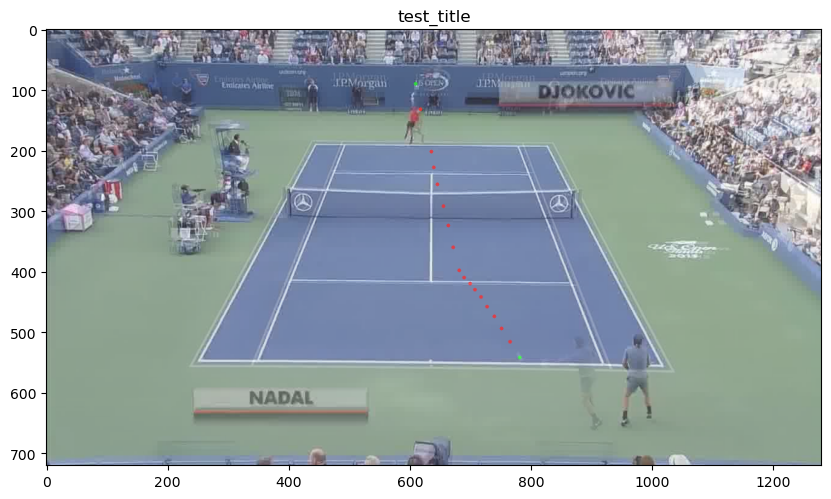

In [235]:
img_name1, img_name2 = 'img_0792.jpg', 'img_0812.jpg'
_, ax = plt.subplots(figsize=(10,6))
def plot_shot(df, img_name1, img_name2, color, radius, thickness, ax=None, title='test_title', plot_pt=None):
    image1 = cv2.imread(str(IMG_FOLDER/img_name1))
    image2 = cv2.imread(str(IMG_FOLDER/img_name2))
    for idx, (x,y) in enumerate(df.loc[img_name1:img_name2][['x','y']].values):
        if not (np.isnan(x) or np.isnan(y)): 
            color = (0, 255, 0) if idx in (0,df.loc[img_name1:img_name2].shape[0]-1) else (0, 0, 255) 
            cv2.circle(image1, (int(x*2), int(y*2)), radius, color, -1)
    pts = df.loc[img_name1:img_name2][['x','y']].values*2
    #s_pt, e_pt, pts = pts[0], results_df.loc[img_name2][['x','y']].values*2, pts[1:]
    #idx, (x_f, y_f) = find_farthest_point_right(s_pt, 'D',e_pt, pts)
    #cv2.circle(image, (int(x_f), int(y_f)), radius+1, (0, 255, 0), -1)
    #x1,y1 = list(map(int,df.loc[img_name1][['x','y']].values))
    #x2,y2 = list(map(int,df.loc[img_name2][['x','y']].values))
    #cv2.line(image1, (x1*2, y1*2), (x2*2, y2*2), (0, 255, 0), thickness)
    if not ax: _, ax = plt.subplots(figsize=(14,8))
    ax.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB), alpha=0.8)
    ax.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB), alpha=0.2)
    if plot_pt: ax.scatter(plot_pt[0], plot_pt[1],s=3, color='b')
    ax.set_title(title)
plot_shot(results_df, img_name1, img_name2, (0, 0, 255), 3, 2, ax)

In [236]:
len(sorted(results_df.clip_num.value_counts().index.values))

96

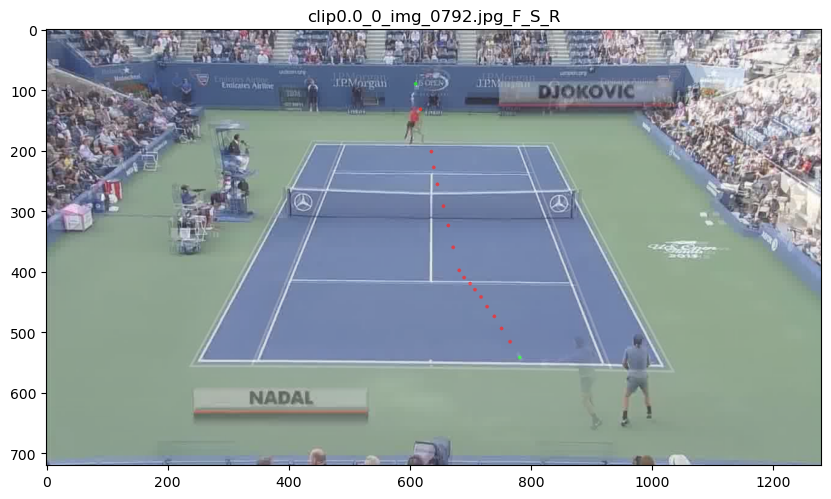

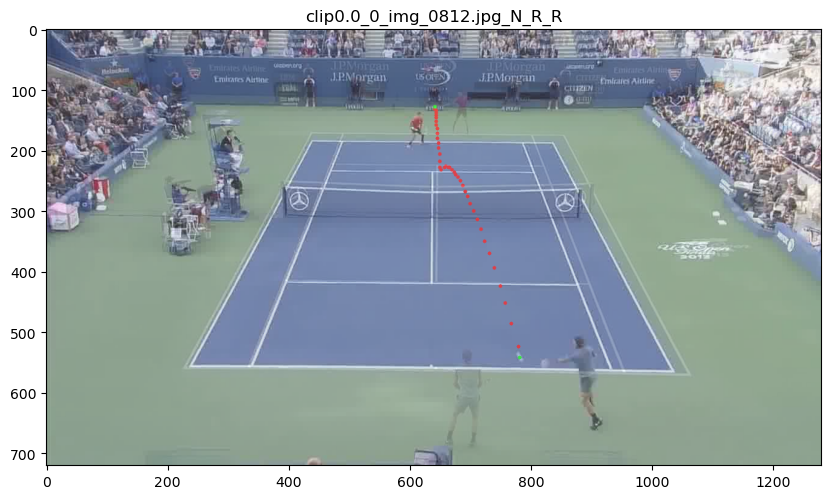

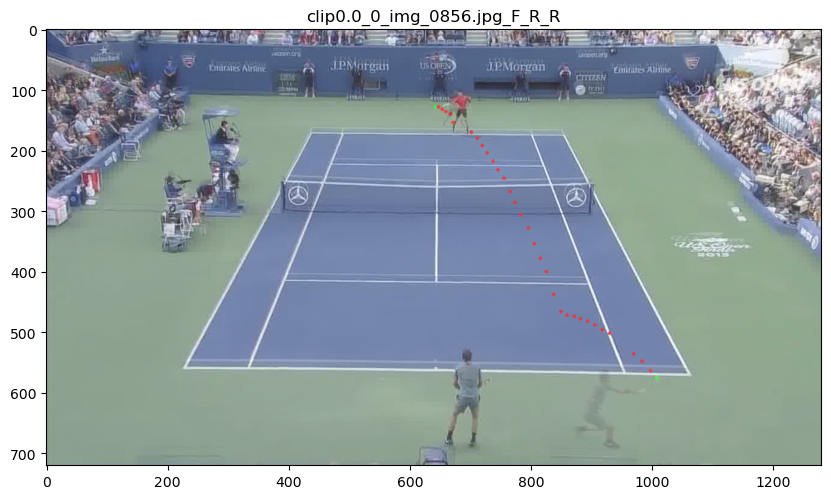

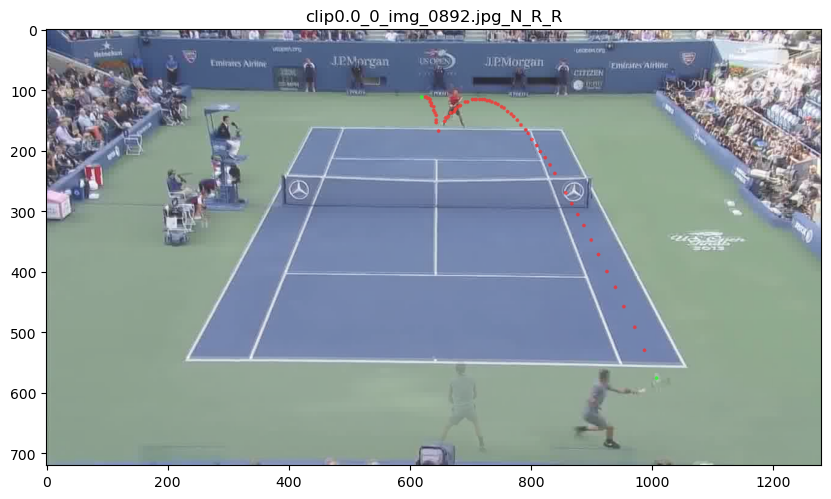

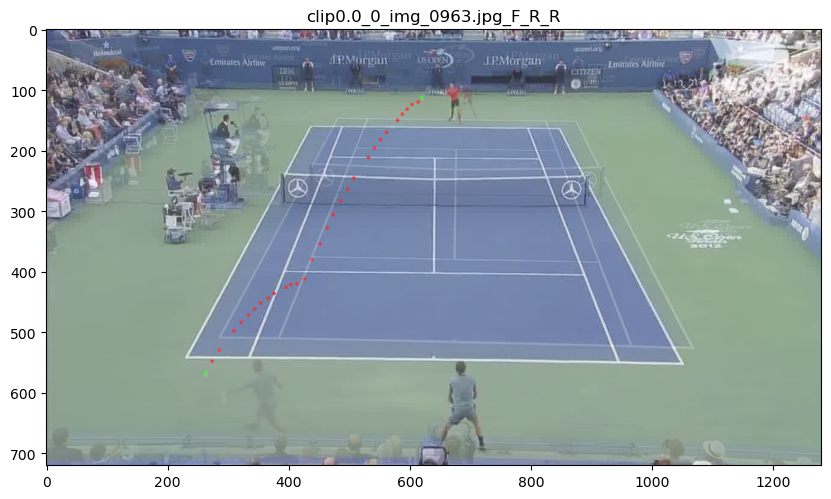

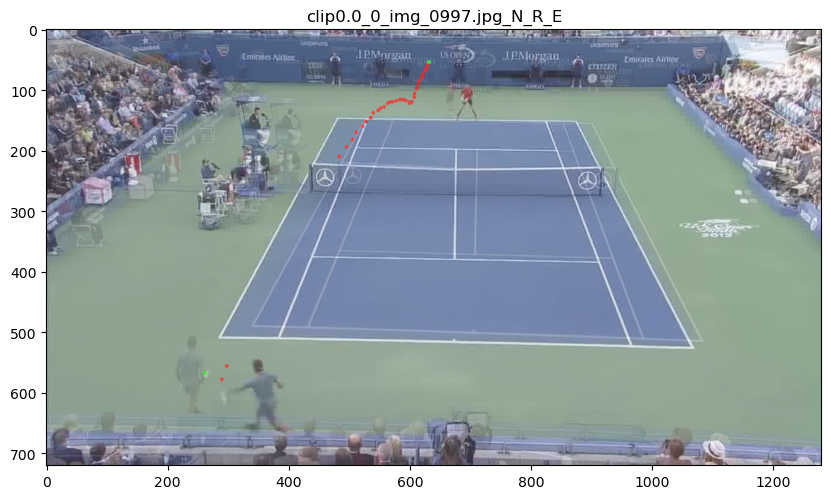

In [237]:
#clip 33 idx 1
#clip 39
#clip 40 cut short 
#clip 46/47 end shot
#clip 48 extra frame
clip_nums = sorted(results_df.clip_num.value_counts().index.values)[:1]
for clip_num in clip_nums:
    pt_tups = final_pts.get(clip_num)
    for pt_idx, pt_tup in enumerate(pt_tups):
        for s1_t, s2_t in zip(pt_tup, pt_tup[1:]):
            (s1_f, s1_s, s1_t), (s2_f, s2_s, s2_t) = s1_t, s2_t
            _, ax = plt.subplots(figsize=(10,6))
            title = f'clip{clip_num}_{pt_idx}_{s1_f}_{s1_s}_{s1_t}_{s2_t}'
            plot_shot(results_df, s1_f, s2_f, (0, 0, 255), 3, 2, ax, title)

In [238]:
##For later - CHECK WHETHER ASSIGNING ALL ONLY_TURN==TRUE and TURN==FALSE as break points works

# for f1 in results_df.loc[(results_df.turn==False) & (results_df.only_turn==True)].index.values[:100]:
#     f2_idx = results_df.index.get_loc(f1)-30
#     f2 = results_df.iloc[f2_idx].name
#     clip_num = results_df.loc[f1].clip_num
#     _, ax = plt.subplots(figsize=(10,6))
#     title = f'clip_{clip_num}_{f1}'
#     plot_shot(results_df, f2, f1, (0, 0, 255), 3, 2, ax, title)

In [239]:
##INVESTIGATE delta>60 frames

# clip_nums = sorted(results_df.clip_num.value_counts().index.values)
# for clip_num in clip_nums:
#     pt_tups = final_pts.get(clip_num)
#     for pt_idx, pt_tup in enumerate(pt_tups):
#         for s1_t, s2_t in zip(pt_tup, pt_tup[1:]):
#             delta = fname2int(s2_t[0])-fname2int(s1_t[0])
#             if delta>60:
#                 title = f'clip: {clip_num} s1: {s1_t} s2: {s2_t} {delta}'
#                 _, ax = plt.subplots(figsize=(10,6))
#                 print(f'title: {title}')
#                 plot_shot(results_df, s1_t[0], s2_t[0], (0, 0, 255), 3, 2, ax, title)


In [240]:
# logger.setLevel(logging.DEBUG)
# def fit_curves(df, img_name1, img_name2, hypers, f_offset=None, debug=False, plot=True, local_offset=6):
#     if img_name2 is None and f_offset is None:
#         print('specify offset'); return
        
#     if img_name2 is None:
#             img_name1_idx = df.index.get_loc(img_name1)
#             img_name1, img_name2 = df.index[img_name1_idx-f_offset], df.index[img_name1_idx+f_offset]
            
#     xy_df = df.loc[img_name1:img_name2,['x','y']]*2
#     x_data, y_data, fs = xy_df.values[:,0], -xy_df.values[:,1], xy_df.index.values
#     mask = ~np.isnan(x_data) & ~np.isnan(y_data)
#     x_data, y_data, fs = x_data[mask], y_data[mask], fs[mask]
#     ms_ys_es = [find_curves_w_error(x_data, y_data, cand_idx, **hypers) for cand_idx in range(1,len(x_data)-2)]
#     opt_idx, (e, m1, m2, y1_pred, y2_pred) = argmin(ms_ys_es, key=lambda x: (x[4],*x[:4]))
#     opt_idx += 1
#     if debug:
#         for idx,(m1,m2,_,_,e) in enumerate(ms_ys_es):
#             print(f'idx: {idx+1} f: {fs[idx+1]} error: {e}')
#         logger.debug(f'm1 coeff: {m1.coef_}, m2 coeff: {m2.coef_}')    
    
#     if plot:
#         x1, x2, y1, y2 = x_data[:opt_idx], x_data[opt_idx:], y_data[:opt_idx], y_data[opt_idx:]
#         if debug: print(f'{x1.shape}, {y1.shape}, {x2.shape}, {y2.shape} {y1_pred.shape} {y2_pred.shape}')
#         plt.figure(figsize=(7,4))
#         plt.plot(x1, y1, 'o', label='Data1')
#         plt.plot(x1, y1_pred, label='Curve1')
#         plt.plot(x2, y2, 'o', label='Data2')
#         plt.plot(x2, y2_pred, label='Curve2')
#         plt.legend()
#         plt.title(f'{opt_idx}_{fs[opt_idx]}_{x_data[opt_idx],y_data[opt_idx]}')

#     #second_iteration

    
#     local_slice = slice(max(df.index.get_loc(fs[opt_idx])-local_offset,0), \
#                         min(df.index.get_loc(fs[opt_idx])+local_offset, df.index.get_loc(fs[-1])-4))
#     xy_df = df[local_slice][['x','y','ball_acc']]*2
#     x_data, y_data, y_acc, fs = xy_df.values[:,0], -xy_df.values[:,1], xy_df.values[:,2], xy_df.index.values
#     mask = ~np.isnan(x_data) & ~np.isnan(y_data)
#     x_l, y_l, acc_l, fs_l = x_data[mask], y_data[mask], y_acc[mask], fs[mask]
#     logger.debug(f'local slice: {local_slice} {fs_l[0],fs_l[-1]} local shape: {x_l.shape},{y_l.shape} delta:{abs(x_l).max()-abs(x_l).min()}')
#     if abs(x_l).max()-abs(x_l).min()<=24:
#         opt_l_idx,_ = argmax(acc_l, key=lambda x: 0 if np.isnan(x) else x)
#         logger.debug(f'y_acc: {acc_l} opt_l_idx: {opt_l_idx}')
#         opt_l_idx = opt_l_idx - (1 if opt_l_idx!=0 else 0)
#         pt = x_l[opt_l_idx], y_l[opt_l_idx]
#         logger.debug(f'ST LINE TRIGGERED: {opt_l_idx} {pt}')

#     else:
#         opt_l_idx, pt = find_farthest_point((x_l[0],y_l[0]),(x_l[-1],y_l[-1]),list(zip(x_l,y_l)))
#     logger.debug(f'farthest: {fs_l[opt_l_idx]}, {opt_l_idx}, {pt}') 
#     n_offset = closer_neighbour(x_l, y_l, opt_l_idx)
#     n_missing = abs(fname2int(fs_l[opt_l_idx+n_offset]) - fname2int(fs_l[opt_l_idx+n_offset-1]))-1    
#     logger.debug(f'n_offset: {n_offset} n_missing: {n_missing} farthest w ofst {fs_l[opt_l_idx+n_offset]}')
#     local_hypers = {'d1':3, 'd2':3, 'a1':0.1, 'a2':0.1}
#     ml1, ml2, yl_pred1, yl_pred2, l_e = find_curves_w_error(x_l, y_l, opt_l_idx+n_offset, **local_hypers)
#     logger.debug(f'ml1: {ml1}')
#     intersect_xs = find_intersection(ml1, ml2, min(x_l), max(x_l), local_hypers.get('d1')) if ml1 else []
#     local_poly = PolynomialFeatures(degree=local_hypers.get('d1'), include_bias=True)  
#     intersect_ys =[]
#     if len(intersect_xs)>0:
#         intersect_ys = ml1.predict(local_poly.fit_transform(intersect_xs.reshape(-1,1)))
#         intersect_ys = intersect_ys.squeeze(axis=-1)
#         logger.debug(f'intersect: {intersect_xs[0]} {intersect_ys[0]}')
#     else:
#         intersect_xs,intersect_ys = [np.nan],[np.nan]
#     if plot:
#         plt.scatter(x1[-1], y1[-1], color='r', s=100)
#         plt.figure(figsize=(7,4))
#         plt.plot((x_l[0],x_l[-1]),(y_l[0],y_l[-1]))
#         plt.plot(x_l[:opt_l_idx+n_offset], y_l[:opt_l_idx+n_offset], 'o', label='Local1')
#         if yl_pred1 is not None: plt.plot(x_l[:opt_l_idx+n_offset], yl_pred1, label='LocalPred1')
#         plt.plot(x_l[opt_l_idx+n_offset:], y_l[opt_l_idx+n_offset:], 'o', label='Local2')
#         if yl_pred2 is not None: plt.plot(x_l[opt_l_idx+n_offset:], yl_pred2, label='LocalPred2')
#         plt.scatter(pt[0], pt[1], color='r', s=100)
#         plt.scatter(intersect_xs[0], intersect_ys[0], c='g', s=100)
#         plt.title(f'{pt}_{(intersect_xs[0],intersect_ys[0])}_{n_missing}')
#         plt.legend()
#     return n_missing, (pt[0],-pt[1]), (intersect_xs[0],-intersect_ys[0]), fs_l[opt_l_idx+n_offset]


In [241]:
import warnings
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.preprocessing import PolynomialFeatures
from scipy.optimize import fsolve
import math


def l2_error(y, y_pred):
    return np.sum((y-y_pred)**2)


def fit_model(x, y, degree=3, alpha=0.1):
    poly_features = PolynomialFeatures(degree=degree, include_bias=True)  
    x_p = poly_features.fit_transform(x)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", RuntimeWarning)
        warnings.simplefilter("ignore", UserWarning)
        model = Ridge(alpha=alpha if alpha else 0)
        model.fit(x_p, y)
        y_pred = model.predict(x_p)
        error = l2_error(y, y_pred)
        return model, y_pred, error
    
def find_curves_w_error(x, y, cut_idx, d1=4, d2=3, a1=0.1, a2=0.1):
    x, y = x.reshape(-1,1), y.reshape(-1,1)
    x1, x2 = x[:cut_idx], x[cut_idx:]
    y1, y2 = y[:cut_idx], y[cut_idx:]
    if x1.shape[0]==0 or x2.shape[0]==0: return None, None, None, None, None
    m1, y1_pred, e1 = fit_model(x1, y1, degree=d1, alpha=a1)
    m2, y2_pred, e2 = fit_model(x2, y2, degree=d2, alpha=a2)
    return m1, m2, y1_pred, y2_pred, e1+e2
    
def find_farthest_point(line_point1, line_point2, points, side_point):
    x1, y1 = line_point1
    x2, y2 = line_point2
    if np.isnan([x1, y1, x2, y2]).any(): raise AttributeError(f'Error in find farthest point {x1} {y1} {x2} {y2}')

    cp = None
    if x1 == x2:
        slope = None
        y_intercept = None
    else:
        slope = (y2 - y1) / (x2 - x1)
        y_intercept = y1 - slope * x1

    def is_same_side(point, ref_point):
        def cross_product(a,b): return a[0]*b[1]-a[1]*b[0]
        x, y = point
        x_ref, y_ref = ref_point
        if slope is None:
             return True if (x-x1)*(x_ref-x1)>=0 else False, None, None
        else:
            line_vec = (x2 - x1, y2 - y1)
            point_vec = (x - x1, y - y1)
            ref_point_vec = (x_ref-x1, y_ref-y1)

            cp_pt = cross_product(line_vec, point_vec)
            cp_ref_pt = cross_product(line_vec, ref_point_vec)
            return True if (cp_pt * cp_ref_pt >= 0) else False, cp_pt, cp_ref_pt
            
        
    def distance_from_line(point):
        x, y = point
        if slope is None:
            # For vertical lines, the distance is the absolute difference in x-coordinates
            return abs(x - x1)
        else:
            # For non-vertical lines, use the perpendicular distance formula
            return abs((y - y_intercept) - slope * x) / math.sqrt(slope**2 + 1)

    max_distance = -1
    farthest_point = None
    for idx, point in enumerate(points):
        distance = distance_from_line(point)
        if distance > max_distance and is_same_side(point, side_point)[0]:
            logger.debug(f'idx: {idx} same_side:{is_same_side(point, side_point)} point: {point} sp: {side_point} x1,y1:{x1,y1} dist: {distance:0.0f}')
            max_distance = distance
            farthest_point = (idx,point)
    return farthest_point if farthest_point is not None else (idx,point)


def find_intersection(m1, m2, x_min, x_max, d=3):
    def equations(x):
        poly_features = PolynomialFeatures(degree=d, include_bias=True)  
        x_p = poly_features.fit_transform(x.reshape(-1,1))
        y1 = m1.predict(x_p)
        y2 = m2.predict(x_p)
        return y1[0] - y2[0]

    initial_guesses = np.linspace(x_min, x_max, 21) 
    roots = []
    for x0 in initial_guesses:
        solution_x = fsolve(equations, x0)
        if abs(equations(solution_x)) < 1e-6:  # Check for valid roots
            roots.append(solution_x.round(1))
    return np.unique(np.array(roots))


def closer_neighbour(x, y, cut_idx):
    logger.debug(f'closer neighbour - cut_idx: {cut_idx}, x: {x}')
    if cut_idx==0 or cut_idx==len(x)-1: return 0 
    d1 = abs(x[cut_idx]-x[cut_idx-1])
    d2 = abs(x[cut_idx+1]-x[cut_idx])
    #print(f'd1 d2 {d1} {d2}')
    return 0 if d1<=d2 else 1

In [242]:
def foffset_fname(df, f, offset=15):
    return df.iloc[df.index.get_loc(f)+offset].name
assert foffset_fname(results_df, 'img_7215.jpg')=='img_7230.jpg'

In [243]:
logger.setLevel(logging.INFO)
def fit_curves(df, img_name1, img_name2, hypers, f_offset=None, debug=False, plot=True, local_offset=6):
    if img_name2 is None and f_offset is None: print('specify offset'); return
    if img_name2 is None: img_name1, img_name2 =  foffset_fname(df, img_name1, offset=-offset),  \
                                                  foffset_fname(df, img_name1, offset=offset)
            
    xy_df = df.loc[img_name1:img_name2,['x','y']]*2
    x_data, y_data, fs = xy_df.values[:,0], -xy_df.values[:,1], xy_df.index.values
    mask = ~np.isnan(x_data) & ~np.isnan(y_data)
    x_data, y_data, fs = x_data[mask], y_data[mask], fs[mask]
    ms_ys_es = [find_curves_w_error(x_data, y_data, cand_idx, **hypers) for cand_idx in range(1,len(x_data)-2)]
    opt_idx1, (e, m1, m2, y1_pred, y2_pred) = argmin(ms_ys_es, key=lambda x: (x[4],*x[:4]))
    opt_idx1 += 1
    pt1 = (x_data[opt_idx1], -y_data[opt_idx1])

    if debug:
        for idx,(m1,m2,_,_,e) in enumerate(ms_ys_es):
            print(f'idx: {idx+1} f: {fs[idx+1]} error: {e}')
        logger.debug(f'm1 coeff: {m1.coef_}, m2 coeff: {m2.coef_}')    

    opt_idx2, pt2 = find_farthest_point((x_data[0],y_data[0]),(x_data[-1],y_data[-1]),list(zip(x_data,y_data)), (pt1[0],-pt1[1]))
    clip_num = df.loc[img_name1].clip_num
    
    if plot:
        x1, x2, y1, y2 = x_data[:opt_idx1], x_data[opt_idx1:], y_data[:opt_idx1], y_data[opt_idx1:]
        if debug: print(f'{x1.shape}, {y1.shape}, {x2.shape}, {y2.shape} {y1_pred.shape} {y2_pred.shape}')
        plt.figure(figsize=(7,4))
        plt.plot(x1, y1, 'o', label='Data1')
        plt.plot(x1, y1_pred, label='Curve1')
        plt.plot(x2, y2, 'o', label='Data2')
        plt.plot(x2, y2_pred, label='Curve2')
        plt.scatter(x2[0], y2[0], color='r', s=100)
        plt.scatter(pt2[0], pt2[1], color='y', s=200)
        plt.plot((x_data[0],x_data[-1]),(y_data[0],y_data[-1]), color='y')
        plt.legend()
        plt.title(f'clip{clip_num}_{opt_idx1}_{fs[opt_idx1]}_{x_data[opt_idx1],y_data[opt_idx1]}')

    #print(f'inside fit curves: {pt1} {fs[opt_idx1]} {(pt2[0],-pt2[1])} {fs[opt_idx2]} end pts: {x_data[0],y_data[0]} {x_data[-1],y_data[-1]}')

    return pt1, fs[opt_idx1], (pt2[0],-pt2[1]), fs[opt_idx2]


In [244]:
def calc_delta_per_frame_backward(df, column_name):
        prev_value = np.nan
        result = pd.Series(index=df.index)
        for f, row in df.iterrows():
            current_value = row[column_name]
            #print(f'f:{f}, cv:{current_value}, pv:{prev_value}')
            i = df.index.get_loc(f)
            for j in reversed(range(max(i-11,0), max(0,i))):
                prev_value = df.iloc[j][column_name]
                if not check_nan(prev_value):
                    break
            if not check_nan(prev_value):
                #print('cv, pv, r2_dist, j-i, div]:',current_value, prev_value, r2_dist(current_value,prev_value, axis=0), (j-i))
                n_frames = fname2int(f) - fname2int(df.iloc[j].name)
                if isinstance(current_value, (int, float)) and isinstance(prev_value, (int, float)):
                      result.iloc[i] = (prev_value-current_value)/max((j - i),n_frames)
                else:
                    result.iloc[i] = r2_dist(current_value,prev_value, axis=0, nan_dim=1)/max((j - i),n_frames)
            else:
                result.iloc[i] = np.nan
        return result 

In [245]:
def fix_outliers(df, im1, im2):
    all_rows = []
    pt_df = df.loc[im1:im2]
    pt_df.loc[pt_df.x.isna()|pt_df.y.isna(), ['x','y']] = np.nan
    pt_df['x_d'] = calc_delta_per_frame_backward(pt_df, 'x')
    pt_df['y_d'] = calc_delta_per_frame_backward(pt_df, 'y')
    prev_flag = False
    for idx, row in pt_df.iterrows():
        if (abs(row.x_d)>=20 or abs(row.y_d)>=30):
            if not prev_flag:
                row['flag'] = True
                prev_flag = True
                count = 1
            else:
                row['flag'] = False
                prev_flag = False
        else:
            if prev_flag and (np.isnan((row.x,row.y)).any() or count>3):
                row['flag'] = False
                prev_flag = False
                count = 0
            elif prev_flag:
                row['flag'] = True
                prev_flag = True
                count += 1
            else:
                row['flag'] = False
                prev_flag = False
        all_rows.append(row)
    out_df = pd.DataFrame(all_rows)
    out_df.loc[out_df.flag==True, ['x','y']] = np.nan
    return out_df

In [246]:
#calc_delta_per_frame_backward(clip_df[img_name1:img_name2], 'x')

In [247]:
#img_name1, img_name2 = 'img_4253.jpg', 'img_4263.jpg'
clip_df = filter_clip(results_df, results_df.loc[img_name1].clip_num)
add_vel_acc(clip_df)
clip_df.loc[img_name1:img_name2, ['x','y','ball_acc']]

,x,y,ball_acc
img_0792.jpg,305.0,45.0,9.688779
img_0793.jpg,NaN,NaN,0.678714
img_0794.jpg,309.0,66.0,NaN
img_0795.jpg,NaN,NaN,0.368913
img_0796.jpg,NaN,NaN,NaN
img_0797.jpg,318.0,101.0,NaN
img_0798.jpg,320.0,114.0,1.164875
img_0799.jpg,323.0,128.0,4.363721
img_0800.jpg,328.0,146.0,-2.189119
img_0801.jpg,332.0,162.0,1.946666


In [248]:
fix_outliers(clip_df, img_name1, img_name2)[['x','y','x_d','y_d','flag']]

,x,y,x_d,y_d,flag
img_0792.jpg,305.0,45.0,NaN,NaN,False
img_0793.jpg,NaN,NaN,NaN,NaN,False
img_0794.jpg,309.0,66.0,-2.0,-10.500000,False
img_0795.jpg,NaN,NaN,NaN,NaN,False
img_0796.jpg,NaN,NaN,NaN,NaN,False
img_0797.jpg,318.0,101.0,-3.0,-11.666667,False
img_0798.jpg,320.0,114.0,-2.0,-13.000000,False
img_0799.jpg,323.0,128.0,-3.0,-14.000000,False
img_0800.jpg,328.0,146.0,-5.0,-18.000000,False
img_0801.jpg,332.0,162.0,-4.0,-16.000000,False


In [249]:
# img_name2 = 'img_11173.jpg'
# clip_num = results_df.loc[img_name2].clip_num
# final_pts.get(clip_num)[0][10] = ('img_11164.jpg', 'F', 'R')


# img_name2 = 'img_23282.jpg'
# clip_num = results_df.loc[img_name2].clip_num
# final_pts.get(clip_num)[0][2] = ('img_23292.jpg', 'N', 'R')

# img_name1 = 'img_61557.jpg'
# clip_num = results_df.loc[img_name1].clip_num
# final_pts.get(clip_num)[1].pop(-1)
# final_pts.get(clip_num)[1].append(('img_61612.jpg', 'F', 'R'))
# final_pts.get(clip_num)[1].append(('img_61653.jpg', 'N', 'E'))
# final_pts.get(clip_num)[1]

# results_df.loc['img_68690.jpg',['x','y']] = np.nan
# results_df.loc['img_68690.jpg',['x','y']]

# img_name1 = 'img_76805.jpg'
# final_pts.get(clip_num)[0][6] = ('img_76829.jpg', 'F', 'R')
# final_pts.get(clip_num)[0][-1] = ('img_77235.jpg', 'N', 'R')
# final_pts.get(clip_num)[0].append(('img_77275.jpg', 'F', 'E'))
# final_pts.get(clip_num)[0]

# img_name1 = 'img_81393.jpg'
# clip_num = results_df.loc[img_name1].clip_num
# final_pts.get(clip_num).pop(0)
# final_pts.get(clip_num)[0][4] = ('img_81074.jpg', 'F', 'R')
# final_pts.get(clip_num)[0][-1] = ('img_81445.jpg', 'F', 'E')



#final_pts.get(194)[0][7] = ('img_94235.jpg', 'F', 'R')
# final_pts.get(194)[0][11] = ('img_94417.jpg', 'F', 'R')
# final_pts.get(194)[0][12] = ('img_94479.jpg', 'N', 'R')
# final_pts.get(194)[0][13] = ('img_94516.jpg', 'F', 'R')
# final_pts.get(194)[0][15] = ('img_94604.jpg', 'F', 'R')
# final_pts.get(194)[0][16] = ('img_94645.jpg', 'N', 'E')
# final_pts.get(200)[1][0] = ('img_98947.jpg', 'N', 'S')

#final_pts.get(79)[0].pop(-1)

#final_pts.get(78)[0].pop(-1)
#final_pts.get(78)[0][-1] = ('img_45096.jpg', 'N', 'E')
#final_pts.get(79)[0][-1] = ('img_45645.jpg', 'F', 'T')
#final_pts.get(210)[0][-1] = ('img_104481.jpg', 'F', 'E')

final_pts.get(100)[0].pop(1)
results_df.loc['img_107089.jpg',['x','y']] = np.nan
results_df.loc['img_107089.jpg',['x','y']]

x    NaN
y    NaN
Name: img_107089.jpg, dtype: object

In [250]:
final_pts.get(100)

[[('img_60953.jpg', 'N', 'S')],
 [('img_61334.jpg', 'N', 'S'),
  ('img_61366.jpg', 'F', 'R'),
  ('img_61398.jpg', 'N', 'R'),
  ('img_61442.jpg', 'F', 'R'),
  ('img_61474.jpg', 'N', 'R'),
  ('img_61521.jpg', 'F', 'R'),
  ('img_61557.jpg', 'N', 'E')]]

DEBUG - find_farthest_point - idx: 0 same_side:(True, 0.0, 164.0) point: (650.0, -192.0) sp: (638.0, -382.0) x1,y1:(650.0, -192.0) dist: 0
DEBUG - find_farthest_point - idx: 2 same_side:(True, 80.0, 164.0) point: (638.0, -376.0) sp: (638.0, -382.0) x1,y1:(650.0, -192.0) dist: 0
DEBUG - find_farthest_point - idx: 3 same_side:(True, 164.0, 164.0) point: (638.0, -382.0) sp: (638.0, -382.0) x1,y1:(650.0, -192.0) dist: 1
DEBUG - find_farthest_point - idx: 4 same_side:(True, 276.0, 164.0) point: (638.0, -390.0) sp: (638.0, -382.0) x1,y1:(650.0, -192.0) dist: 1


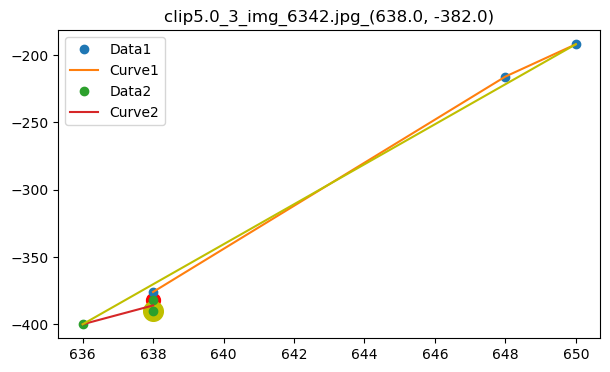

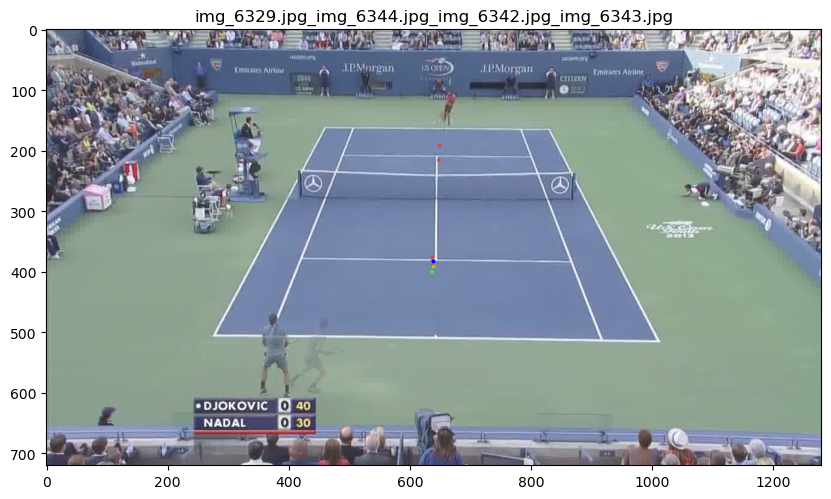

In [251]:
#DEBUG 
logger.setLevel(logging.DEBUG)

# img_name1, img_name2 = 'img_0892.jpg', 'img_0963.jpg' 
# img_name1, img_name2 = 'img_11449.jpg', 'img_11486.jpg' 
# img_name1, img_name2 = 'img_22292.jpg', 'img_22341.jpg' 
# img_name1, img_name2 = 'img_26763.jpg', 'img_26808.jpg' 
# img_name1, img_name2 = 'img_32952.jpg', 'img_33032.jpg' 
# img_name1, img_name2 = 'img_36226.jpg', 'img_36266.jpg'
# img_name1, img_name2 = 'img_62827.jpg', 'img_62854.jpg'
# img_name1, img_name2 = 'img_63610.jpg', 'img_63636.jpg'
# img_name1, img_name2 = 'img_91576.jpg', 'img_91605.jpg' 
# img_name1, img_name2 = 'img_39354.jpg', 'img_39382.jpg'
# img_name1, img_name2 = 'img_54168.jpg', 'img_54201.jpg'
# img_name1, img_name2 = 'img_94166.jpg', 'img_94199.jpg' 
# img_name1, img_name2 = 'img_101929.jpg', 'img_101956.jpg'
# img_name1, img_name2 = 'img_106977.jpg', 'img_107026.jpg' 
# img_name1, img_name2 = 'img_107498.jpg', 'img_107550.jpg' 

# img_name1, img_name2 = 'img_34298.jpg', 'img_34321.jpg' #straight line compressed
# img_name1, img_name2 = 'img_68716.jpg', 'img_68747.jpg' #xy compressed
# img_name1, img_name2 = 'img_72526.jpg', 'img_72547.jpg' #xy compressed
# img_name1, img_name2 = 'img_54257.jpg', 'img_54307.jpg' #loop hit, both approaches on wrong side
# img_name1, img_name2 = 'img_45026.jpg', 'img_45070.jpg' #wrong xy
# img_name1, img_name2 = 'img_102786.jpg', 'img_102827.jpg' #wrong xy
# img_name1, img_name2 = 'img_3162.jpg', 'img_3216.jpg' #wrong xy
# img_name1, img_name2 = 'img_24355.jpg', 'img_24395.jpg' #wrong xy
# img_name1, img_name2 = 'img_29833.jpg', 'img_29876.jpg' #wrong xy
# img_name1, img_name2 = 'img_55758.jpg', 'img_55811.jpg' #wrong xy
# img_name1, img_name2 = 'img_24355.jpg', 'img_24395.jpg' #wrong xy
# img_name1, img_name2 = 'img_29833.jpg', 'img_29876.jpg' #wrong xy
# img_name1, img_name2 = 'img_58173.jpg', 'img_58213.jpg' #wrong xy
# img_name1, img_name2 = 'img_59745.jpg', 'img_59794.jpg' #wrong xy
# img_name1, img_name2 = 'img_68755.jpg', 'img_68796.jpg' #wrong xy
# img_name1, img_name2 = 'img_76802.jpg', 'img_76825.jpg' #compressed straight line
# img_name1, img_name2 = 'img_81352.jpg', 'img_81403.jpg' #wrong both on same side
img_name1, img_name2 = 'img_4237.jpg', 'img_4273.jpg' #compress straight line
img_name1, img_name2 = 'img_4353.jpg', 'img_4386.jpg' #compress straight line
img_name1, img_name2 = 'img_7150.jpg', 'img_7173.jpg' #compress straight line (delta of 2 might solve)
img_name1, img_name2 = 'img_20849.jpg', 'img_20879.jpg' #compress straight line
img_name1, img_name2 = 'img_23245.jpg', 'img_23282.jpg' #compressed not fixed
img_name1, img_name2 = 'img_68709.jpg', 'img_68747.jpg' #compressed not fixed
img_name1, img_name2 = 'img_72520.jpg', 'img_72547.jpg' #compressed - will be fixed
img_name1, img_name2 = 'img_87778.jpg', 'img_87794.jpg' #compressed - will be fixed - consider adding end offset for serves, similarly for Far vs Near
img_name1, img_name2 = 'img_91742.jpg', 'img_91760.jpg' #compressed not fixed
img_name1, img_name2 = 'img_95646.jpg', 'img_95681.jpg'
img_name1, img_name2 = 'img_4237.jpg', 'img_4273.jpg'
# img_name1, img_name2 = 'img_81034.jpg', 'img_81073.jpg' #extra frames
img_name1, img_name2 = 'img_11129.jpg','img_11164.jpg'
img_name1, img_name2 = 'img_23246.jpg','img_23292.jpg'
img_name1, img_name2 = 'img_26949.jpg','img_26986.jpg' #not fixed
img_name1, img_name2 = 'img_29969.jpg','img_29994.jpg' #not fixed
img_name1, img_name2 = 'img_45028.jpg','img_45063.jpg' #not fixed
img_name1, img_name2 = 'img_55671.jpg','img_55694.jpg' #not fixed
img_name1, img_name2 = 'img_55694.jpg','img_55758.jpg' #not fixed
img_name1, img_name2 = 'img_58220.jpg','img_58261.jpg' #not fixed
img_name1, img_name2 = 'img_61557.jpg','img_61612.jpg' 
img_name1, img_name2 = 'img_68661.jpg','img_68707.jpg' 
img_name1, img_name2 = 'img_68717.jpg','img_68745.jpg' 
img_name1, img_name2 = 'img_70113.jpg','img_70144.jpg' 
img_name1, img_name2 = 'img_76805.jpg','img_76829.jpg' 
#img_name1, img_name2 = 'img_76829.jpg','img_76892.jpg' 
img_name1, img_name2 = 'img_77235.jpg','img_77275.jpg' 
img_name1, img_name2 = 'img_81040.jpg','img_81074.jpg'
img_name1, img_name2 = 'img_81257.jpg','img_81295.jpg' #not fixed
img_name1, img_name2 = 'img_81345.jpg','img_81393.jpg' 
img_name1, img_name2 = 'img_87778.jpg','img_87797.jpg' #not fixed
img_name1, img_name2 = 'img_91473.jpg','img_91529.jpg' #not fixed
img_name1, img_name2 = 'img_91733.jpg','img_91760.jpg' #not fixed
img_name1, img_name2 = 'img_94206.jpg','img_94235.jpg' 
img_name1, img_name2 = 'img_94370.jpg','img_94417.jpg' 
img_name1, img_name2 = 'img_94417.jpg','img_94479.jpg' 
img_name1, img_name2 = 'img_94479.jpg','img_94516.jpg' 
img_name1, img_name2 = 'img_94516.jpg','img_94563.jpg' 
img_name1, img_name2 = 'img_94563.jpg','img_94604.jpg' 
img_name1, img_name2 = 'img_98947.jpg','img_98981.jpg' #not fixed
img_name1, img_name2 = 'img_100904.jpg','img_100930.jpg' #not fixed
img_name1, img_name2 = 'img_107072.jpg','img_107101.jpg' #not fixed
img_name1, img_name2 = 'img_81342.jpg','img_81382.jpg' #not fixed
img_name1, img_name2 = 'img_45021.jpg','img_45060.jpg' #not fixed

img_name1, img_name2 = 'img_6329.jpg','img_6344.jpg' #not fixed


clip_df = filter_clip(results_df, results_df.loc[img_name1].clip_num)
p_clip_df = fix_outliers(clip_df, img_name1, img_name2)
add_vel_acc(p_clip_df)
#print(p_clip_df[['x','y','ball_acc']])
hypers = {'d1':3, 'd2':2, 'a1':0.1, 'a2':0.1}
pt1, b_f1, pt2, b_f2 = fit_curves(p_clip_df, img_name1, img_name2, hypers, debug=False, plot=True, local_offset=6)
title = f'{img_name1}_{img_name2}_{b_f1}_{b_f2}'
_, ax = plt.subplots(figsize=(10,6))
plot_shot(results_df, img_name1, img_name2, (0, 0, 255), 3, 2, ax, title, plot_pt=pt1)
ax.scatter(pt2[0], pt2[1], color='y', s=3)


In [252]:

# logger.setLevel(logging.INFO)
# hypers = {'d1':3, 'd2':2, 'a1':0.1, 'a2':0.1}
# clip_nums = sorted(results_df.clip_num.value_counts().index.values)[10:40]
# for clip_num in clip_nums:
#     print(f'clip {clip_num}')
#     pt_tups = final_pts.get(clip_num)
#     for pt_idx, pt_tup in enumerate(pt_tups):
#         for s1_t, s2_t in zip(pt_tup, pt_tup[1:]):
#             (s1_f, s1_s, s1_t), (s2_f, s2_s, s2_t) = s1_t, s2_t
#             start_offset = 4 if s1_t=='S' else 9 
#             s1_f_mod = results_df.iloc[results_df.index.get_loc(s1_f)+start_offset].name
#             s2_f_mod = s2_f
#             if (fname2int(s2_f)-fname2int(s1_f))>70 and s2_t=='E': 
#                 s2_f_mod = results_df.iloc[results_df.index.get_loc(s1_f)+40].name
#             clip_df = filter_clip(results_df, results_df.loc[s1_f].clip_num)
#             add_vel_acc(clip_df)
#             #print(f'{clip_num} {s1_f_mod},{s2_f_mod} {s1_t} {s2_t}')
#             if (fname2int(s2_f)-fname2int(s1_f))<20 and s2_t=='T': print('SKIPPING'); continue
#             pt1, b_f1, pt2, b_f2 = fit_curves(clip_df, s1_f_mod, s2_f_mod, hypers, debug=False, plot=False, local_offset=6)
#             trunc_clip_df = clip_df.loc[foffset_fname(clip_df,b_f1,-5):foffset_fname(clip_df, b_f1, 5)]
#             if (trunc_clip_df.x.max()-trunc_clip_df.x.min()) <= 6:
#                 _, ax = plt.subplots(figsize=(10,6))
#                 _, opt_idx3 = argmax(abs(trunc_clip_df.loc[trunc_clip_df.x*2==pt1[0],['ball_acc']].values))
#                 pt3, b_f3 = trunc_clip_df.iloc[opt_idx3][['x','y']].values[0], trunc_clip_df.iloc[opt_idx3].index[0]
#                 print(f'{clip_num}_{pt3}_{b_f3}')
#                 title = f'clip{clip_num}_{pt_idx}_{s1_f}_{s2_f}_{b_f1}_{b_f2}_{b_f3}'
#                 plot_shot(results_df, s1_f_mod, s2_f_mod, (0, 0, 255), 3, 2, ax, title, plot_pt=pt1)
#                 ax.scatter(pt2[0], pt2[1], color='y', s=3)
#                 ax.scatter(pt3[0]*2, pt3[1]*2, color='lawngreen', s=3)
            

In [253]:
logger.setLevel(logging.INFO)
hypers = {'d1':3, 'd2':2, 'a1':0.1, 'a2':0.1}
#hypers_adj = {'d1':5, 'd2':2, 'a1':0.1, 'a2':0.1}

clip_nums = sorted(results_df.clip_num.value_counts().index.values)[75:]
for clip_num in [111]:
    pt_tups = final_pts.get(clip_num)
    for pt_idx, pt_tup in enumerate(pt_tups):
        for s1_t, s2_t in zip(pt_tup, pt_tup[1:]):
            (s1_f, s1_s, s1_ty), (s2_f, s2_s, s2_ty) = s1_t, s2_t
            start_offset = 4 if s1_ty=='S' else 9 
            s1_f_mod = results_df.iloc[results_df.index.get_loc(s1_f)+start_offset].name
            s2_f_mod = s2_f
            if s1_s=='N': s2_f_mod = results_df.iloc[results_df.index.get_loc(s2_f)-3].name
            #if (fname2int(s2_f)-fname2int(s1_f))<15: 
            #    print('Short Point'); continue
            if (fname2int(s2_f)-fname2int(s1_f))>65 and s2_ty in ('E','T'): 
                s2_f_mod = results_df.iloc[results_df.index.get_loc(s1_f)+40].name
            clip_df = filter_clip(results_df, results_df.loc[s1_f].clip_num)
            p_clip_df = fix_outliers(clip_df, s1_f, s2_f)
            add_vel_acc(p_clip_df)
            #print(f'{clip_num} {s1_f},{s2_f} {s1_ty} {s2_ty}')
            if s2_ty=='T': 
                print('SKIPPING'); 
                print(f'{s1_t}')
                #final_w_bounce_pts[clip_num][pt_idx].append(s1_t)
            else:
                #_, ax = plt.subplots(figsize=(10,6))
                pt1, b_f1, pt2, b_f2 = fit_curves(p_clip_df, s1_f_mod, s2_f_mod, hypers, debug=False, plot=False, local_offset=6)
                title = f'clip{clip_num}_{pt_idx}_{s1_f}_{s2_f}_{s2_t}_{b_f1}_{b_f2}'
                print(f'{s1_t}')
                print(f"{(b_f2,'B','B')}")
                #final_w_bounce_pts[clip_num][pt_idx].append(s1_t)
                #final_w_bounce_pts[clip_num][pt_idx].append((b_f2,'B','B'))
                #print(final_w_bounce_pts)
                #plot_shot(results_df, s1_f_mod, s2_f_mod, (0, 0, 255), 3, 2, ax, title, plot_pt=pt1)
                #ax.scatter(pt2[0], pt2[1], color='y', s=3)
        #final_w_bounce_pts[clip_num][pt_idx].append(s2_t)
        print(f'{s2_t}')
   
   

E


In [254]:
logger.setLevel(logging.INFO)
final_w_bounce_pts = defaultdict(list)
hypers = {'d1':3, 'd2':2, 'a1':0.1, 'a2':0.1}
#hypers_adj = {'d1':5, 'd2':2, 'a1':0.1, 'a2':0.1}
clip_nums = sorted(results_df.clip_num.value_counts().index.values)

for clip_num in clip_nums:
    pt_tups = final_pts.get(clip_num)
    for pt_idx, pt_tup in enumerate(pt_tups):
        pos = len(final_w_bounce_pts[clip_num])
        final_w_bounce_pts[clip_num].insert(pos,[])
        #print(f'clip {clip_num} pt_idx: {pt_idx}')
        for s1_t, s2_t in zip(pt_tup, pt_tup[1:]):
            (s1_f, s1_s, s1_ty), (s2_f, s2_s, s2_ty) = s1_t, s2_t
            start_offset = 4 if s1_ty=='S' else 9 
            s1_f_mod = results_df.iloc[results_df.index.get_loc(s1_f)+start_offset].name
            s2_f_mod = s2_f
            if s1_s=='N': s2_f_mod = results_df.iloc[results_df.index.get_loc(s2_f)-3].name
            #if (fname2int(s2_f)-fname2int(s1_f))<15: 
            #    print('Short Point'); continue
            if (fname2int(s2_f)-fname2int(s1_f))>65 and s2_ty in ('E','T'): 
                s2_f_mod = results_df.iloc[results_df.index.get_loc(s1_f)+40].name
            clip_df = filter_clip(results_df, results_df.loc[s1_f].clip_num)
            p_clip_df = fix_outliers(clip_df, s1_f, s2_f)
            add_vel_acc(p_clip_df)
            #print(f'{clip_num} {s1_f},{s2_f} {s1_f_mod},{s1_f_mod} {s1_ty} {s2_ty}')
            if s2_ty=='T': 
                #print('SKIPPING'); 
                final_w_bounce_pts[clip_num][pt_idx].append(s1_t)
            else:
                #_, ax = plt.subplots(figsize=(10,6))
                pt1, b_f1, pt2, b_f2 = fit_curves(p_clip_df, s1_f_mod, s2_f_mod, hypers, debug=False, plot=False, local_offset=6)
                title = f'clip{clip_num}_{pt_idx}_{s1_f}_{s2_f}_{s2_t}_{b_f1}_{b_f2}'
                final_w_bounce_pts[clip_num][pt_idx].append(s1_t)
                final_w_bounce_pts[clip_num][pt_idx].append((b_f2,'B','B'))
                #print(final_w_bounce_pts)
                #plot_shot(results_df, s1_f_mod, s2_f_mod, (0, 0, 255), 3, 2, ax, title, plot_pt=pt1)
                #ax.scatter(pt2[0], pt2[1], color='y', s=3)
        final_w_bounce_pts[clip_num][pt_idx].append(s2_t)
   

In [258]:
final_pts.get(200)

[[('img_98594.jpg', 'N', 'S'), ('img_98625.jpg', 'F', 'E')],
 [('img_98947.jpg', 'N', 'S'),
  ('img_98981.jpg', 'F', 'R'),
  ('img_99014.jpg', 'N', 'R'),
  ('img_99052.jpg', 'F', 'R'),
  ('img_99092.jpg', 'N', 'R'),
  ('img_99132.jpg', 'F', 'R'),
  ('img_99171.jpg', 'N', 'R'),
  ('img_99218.jpg', 'F', 'R'),
  ('img_99252.jpg', 'N', 'R'),
  ('img_99296.jpg', 'F', 'R'),
  ('img_99334.jpg', 'N', 'R'),
  ('img_99366.jpg', 'F', 'R'),
  ('img_99409.jpg', 'N', 'R'),
  ('img_99461.jpg', 'F', 'R'),
  ('img_99488.jpg', 'N', 'R'),
  ('img_99528.jpg', 'F', 'R'),
  ('img_99562.jpg', 'N', 'R'),
  ('img_99604.jpg', 'F', 'R'),
  ('img_99638.jpg', 'N', 'R'),
  ('img_99668.jpg', 'F', 'R'),
  ('img_99708.jpg', 'N', 'R'),
  ('img_99750.jpg', 'F', 'R'),
  ('img_99783.jpg', 'N', 'R'),
  ('img_99815.jpg', 'F', 'R')]]

In [256]:
final_w_bounce_pts.get(111)

[[('img_70196.jpg', 'N', 'E')]]

In [257]:
json.dump( final_w_bounce_pts, open( "final_w_bounce_pts_old.json", 'w' ) )


In [259]:
final_pts.get(7)[0][-1] = ('img_8498.jpg', 'N', 'E')
final_w_bounce_pts.get(7)

[[('img_8158.jpg', 'F', 'S'),
  ('img_8171.jpg', 'B', 'B'),
  ('img_8180.jpg', 'N', 'R'),
  ('img_8210.jpg', 'B', 'B'),
  ('img_8226.jpg', 'F', 'R'),
  ('img_8252.jpg', 'B', 'B'),
  ('img_8263.jpg', 'N', 'R'),
  ('img_8298.jpg', 'B', 'B'),
  ('img_8309.jpg', 'F', 'R'),
  ('img_8337.jpg', 'B', 'B'),
  ('img_8348.jpg', 'N', 'R'),
  ('img_8377.jpg', 'B', 'B'),
  ('img_8400.jpg', 'F', 'R'),
  ('img_8498.jpg', 'N', 'T')]]

In [260]:
final_w_bounce_pts.get(1)

[[('img_1608.jpg', 'F', 'S'),
  ('img_1622.jpg', 'B', 'B'),
  ('img_1633.jpg', 'N', 'R'),
  ('img_1672.jpg', 'B', 'B'),
  ('img_1686.jpg', 'F', 'R'),
  ('img_1699.jpg', 'B', 'B'),
  ('img_1717.jpg', 'N', 'R'),
  ('img_1728.jpg', 'B', 'B'),
  ('img_1740.jpg', 'F', 'R'),
  ('img_1775.jpg', 'B', 'B'),
  ('img_1795.jpg', 'N', 'E')]]

In [261]:
final_w_bounce_pts[40] = [[('img_17618.jpg', 'N', 'S'),
('img_17633.jpg', 'B', 'B'),
('img_17654.jpg', 'F', 'R'),
('img_17679.jpg', 'B', 'B'),
('img_17695.jpg', 'N', 'R'),
('img_17713.jpg', 'B', 'B'),
('img_17726.jpg', 'F', 'R'),
('img_17749.jpg', 'B', 'B'),
('img_17760.jpg', 'N', 'R'),
('img_17787.jpg', 'B', 'B'),
('img_17798.jpg', 'F', 'R'),
('img_17833.jpg', 'B', 'B'),
('img_17842.jpg', 'N', 'R'),
('img_17866.jpg', 'B', 'B'),
('img_17880.jpg', 'F', 'R'),
('img_17913.jpg', 'B', 'B'),
('img_17928.jpg', 'N', 'R'),
('img_17952.jpg', 'B', 'B'),
('img_17959.jpg', 'F', 'R'),
('img_18002.jpg', 'B', 'B'),
('img_18022.jpg', 'N', 'E')]]

In [262]:
final_w_bounce_pts[74] = [[('img_41508.jpg', 'N', 'S'),
('img_41522.jpg', 'B', 'B'),
('img_41537.jpg', 'F', 'R'),
('img_41559.jpg', 'B', 'B'),
('img_41568.jpg', 'N', 'R'),
('img_41593.jpg', 'B', 'B'),
('img_41606.jpg', 'F', 'R'),
('img_41633.jpg', 'B', 'B'),
('img_41642.jpg', 'N', 'R'),
('img_41673.jpg', 'B', 'B'),
('img_41686.jpg', 'F', 'R'),
('img_41714.jpg', 'B', 'B'),
('img_41721.jpg', 'N', 'R'),
('img_41750.jpg', 'B', 'B'),
('img_41768.jpg', 'F', 'R'),
('img_41793.jpg', 'B', 'B'),
('img_41806.jpg', 'N', 'R'),
('img_41838.jpg', 'B', 'B'),
('img_41851.jpg', 'F', 'R'),
('img_41871.jpg', 'B', 'B'),
('img_41884.jpg', 'N', 'R'),
('img_41926.jpg', 'B', 'B'),
('img_41945.jpg', 'F', 'R'),
('img_41972.jpg', 'B', 'B'),
('img_41988.jpg', 'N', 'R'),
('img_42017.jpg', 'B', 'B'),
('img_42029.jpg', 'F', 'R'),
('img_42054.jpg', 'B', 'B'),
('img_42066.jpg', 'N', 'R'),
('img_42112.jpg', 'B', 'B'),
('img_42123.jpg', 'F', 'R'),
('img_42136.jpg', 'N', 'T')
                          ]]

In [263]:
final_w_bounce_pts[117] = [[('img_76597.jpg', 'F', 'S'),
  ('img_76612.jpg', 'B', 'B'),
  ('img_76623.jpg', 'N', 'R'),
  ('img_76653.jpg', 'B', 'B'),
  ('img_76664.jpg', 'F', 'R'),
  ('img_76688.jpg', 'B', 'B'),
  ('img_76705.jpg', 'N', 'R'),
  ('img_76728.jpg', 'B', 'B'),
  ('img_76745.jpg', 'F', 'R'),
  ('img_76783.jpg', 'B', 'B'),
  ('img_76797.jpg', 'N', 'R'),
  ('img_76812.jpg', 'B', 'B'),
  ('img_76829.jpg', 'F', 'R'),
  ('img_76875.jpg', 'B', 'B'),
  ('img_76892.jpg', 'N', 'R'),
  ('img_76914.jpg', 'B', 'B'),
  ('img_76932.jpg', 'F', 'R'),
  ('img_76977.jpg', 'B', 'B'),
  ('img_76992.jpg', 'N', 'R'),
  ('img_77016.jpg', 'B', 'B'),
  ('img_77034.jpg', 'F', 'R'),
  ('img_77066.jpg', 'B', 'B'),
  ('img_77078.jpg', 'N', 'R'),
  ('img_77101.jpg', 'B', 'B'),
  ('img_77113.jpg', 'F', 'R'),
  ('img_77152.jpg', 'B', 'B'),
  ('img_77162.jpg', 'N', 'R'),
  ('img_77184.jpg', 'B', 'B'),
  ('img_77197.jpg', 'F', 'R'),
  ('img_77220.jpg', 'B', 'B'),
  ('img_77235.jpg', 'N', 'R'),
  ('img_77310.jpg', 'F', 'R'),
  ('img_77316.jpg', 'B', 'B'),
  ('img_77327.jpg', 'F', 'E') ]]


In [264]:
final_w_bounce_pts[200] = [[('img_98594.jpg', 'N', 'S'),
  ('img_98607.jpg', 'B', 'B'),
  ('img_98625.jpg', 'F', 'E')],
 [('img_98947.jpg', 'N', 'S'),
  ('img_98963.jpg', 'B', 'B'),
  ('img_98981.jpg', 'F', 'R'),
  ('img_99001.jpg', 'B', 'B'),
  ('img_99014.jpg', 'N', 'R'),
  ('img_99035.jpg', 'B', 'B'),
  ('img_99052.jpg', 'F', 'R'),
  ('img_99079.jpg', 'B', 'B'),
  ('img_99092.jpg', 'N', 'R'),
  ('img_99116.jpg', 'B', 'B'),
  ('img_99132.jpg', 'F', 'R'),
  ('img_99167.jpg', 'B', 'B'),
  ('img_99171.jpg', 'N', 'R'),
  ('img_99204.jpg', 'B', 'B'),
  ('img_99218.jpg', 'F', 'R'),
  ('img_99241.jpg', 'B', 'B'),
  ('img_99252.jpg', 'N', 'R'),
  ('img_99281.jpg', 'B', 'B'),
  ('img_99296.jpg', 'F', 'R'),
  ('img_99321.jpg', 'B', 'B'),
  ('img_99334.jpg', 'N', 'R'),
  ('img_99353.jpg', 'B', 'B'),
  ('img_99366.jpg', 'F', 'R'),
  ('img_99392.jpg', 'B', 'B'),
  ('img_99409.jpg', 'N', 'R'),
  ('img_99447.jpg', 'B', 'B'),
  ('img_99461.jpg', 'F', 'R'),
  ('img_99481.jpg', 'B', 'B'),
  ('img_99488.jpg', 'N', 'R'),
  ('img_99515.jpg', 'B', 'B'),
  ('img_99528.jpg', 'F', 'R'),
  ('img_99553.jpg', 'B', 'B'),
  ('img_99562.jpg', 'N', 'R'),
  ('img_99583.jpg', 'B', 'B'),
  ('img_99604.jpg', 'F', 'R'),
  ('img_99631.jpg', 'B', 'B'),
  ('img_99638.jpg', 'N', 'R'),
  ('img_99660.jpg', 'B', 'B'),
  ('img_99668.jpg', 'F', 'R'),
  ('img_99686.jpg', 'B', 'B'),
  ('img_99708.jpg', 'N', 'R'),
  ('img_99738.jpg', 'B', 'B'),
  ('img_99750.jpg', 'F', 'R'),
  ('img_99766.jpg', 'B', 'B'),
  ('img_99783.jpg', 'N', 'R'),
  ('img_99806.jpg', 'B', 'B'),
  ('img_99815.jpg', 'F', 'E')
]]

In [265]:
# clip_nums = sorted(results_df.clip_num.value_counts().index.values)
# for clip_num in clip_nums:
#     pt_tups = final_pts.get(clip_num)
#     for pt_idx, pt_tup in enumerate(pt_tups):
#         pos = len(final_w_bounce_pts[clip_num])
#         for s1_t, s2_t in zip(pt_tup, pt_tup[1:]):
#             (s1_f, s1_s, s1_ty), (s2_f, s2_s, s2_ty) = s1_t, s2_t
#             delta = (fname2int(s2_f)-fname2int(s1_f))
#             if delta<20: 
#                 print(f'{clip_num} {delta} {s1_t} {s2_t}')


In [266]:
results_df['n_b'] = results_df['n_kp'].map(lambda x: np.array(x)[:4].mean(axis=0)[:2] if not np.isnan(x).any() else np.nan)
results_df['f_b'] = results_df['f_kp'].map(lambda x: np.array(x)[:4].mean(axis=0)[:2] if not np.isnan(x).any() else np.nan)

In [267]:
def tuple_shot(s_t, df=results_df, plot_chart=False):
    f, side, ty = s_t
    if side in ('N','F'):
        f_idx = df.index.get_loc(f)
        sel_cols = ['n_hs','f_hs','n_p','f_p','n_b','f_b','x','y']
        row = df.loc[f,sel_cols]
        shot = None
        player = row.n_p if side[-1]=='N' else row.f_p
        body_pt = row.n_b if side[-1]=='N' else row.f_b
        hands = row.n_hs.mean(axis=0) if ((not np.isnan(row.n_hs).any()) and (side[-1]=='N')) else \
                (row.f_hs.mean(axis=0) if ((not np.isnan(row.f_hs).any()) and (side[-1]=='F')) else [np.nan, np.nan])
        ball = np.array([row.x,row.y])*2
        compare_pt = hands if np.isnan(ball).any() else ball
        try:
            shot = 'BH' if ((side=='F') ^ (player=='gray') ^ (compare_pt[0]>=body_pt[0]))==0 else 'FH'
        except:
            print(body_pt)
        if ty =='S': shot='S'
        if plot_chart:
            image = cv2.imread(str(IMG_FOLDER/f))
            for idx, (x,y) in enumerate(df.iloc[f_idx-10:f_idx+10][['x','y']].values*2):
                if not (np.isnan(x) or np.isnan(y)): 
                    color = (0, 255, 0) if idx==10 else (255, 0, 0)
                    cv2.circle(image, (int(x), int(y)), 3, color , -1)
            plt.figure(figsize=(6,4))
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title(f"{f}_{side}_{shot}")
        return shot
    else:
        return None

In [268]:
test_t1 = ('img_4085.jpg', 'F', 'R')
test_t2 = ('img_4200.jpg', 'N', 'R')
test_t3 = ('img_4521.jpg', 'B', 'B')
assert tuple_shot(test_t1, plot_chart=False)=='FH'
assert tuple_shot(test_t2, plot_chart=False)=='FH'
assert tuple_shot(test_t3, plot_chart=False) is None

In [269]:
clip_nums = sorted(results_df.clip_num.value_counts().index.values)
for clip_num in clip_nums:
    pt_tups = final_w_bounce_pts.get(clip_num)
    for pt_idx, pt_tup in enumerate(pt_tups):
        for s_t in pt_tup:
            shot = tuple_shot(s_t, plot_chart=False)
            print(f'clip:{clip_num} pt_idx:{pt_idx} s_t:{s_t} shot:{shot}')

clip:0.0 pt_idx:0 s_t:('img_0792.jpg', 'F', 'S') shot:S
clip:0.0 pt_idx:0 s_t:('img_0803.jpg', 'B', 'B') shot:None
clip:0.0 pt_idx:0 s_t:('img_0812.jpg', 'N', 'R') shot:FH
clip:0.0 pt_idx:0 s_t:('img_0840.jpg', 'B', 'B') shot:None
clip:0.0 pt_idx:0 s_t:('img_0856.jpg', 'F', 'R') shot:FH
clip:0.0 pt_idx:0 s_t:('img_0879.jpg', 'B', 'B') shot:None
clip:0.0 pt_idx:0 s_t:('img_0892.jpg', 'N', 'R') shot:BH
clip:0.0 pt_idx:0 s_t:('img_0946.jpg', 'B', 'B') shot:None
clip:0.0 pt_idx:0 s_t:('img_0963.jpg', 'F', 'R') shot:FH
clip:0.0 pt_idx:0 s_t:('img_0982.jpg', 'B', 'B') shot:None
clip:0.0 pt_idx:0 s_t:('img_0997.jpg', 'N', 'R') shot:FH
clip:0.0 pt_idx:0 s_t:('img_1029.jpg', 'B', 'B') shot:None
clip:0.0 pt_idx:0 s_t:('img_1043.jpg', 'F', 'E') shot:FH
clip:1.0 pt_idx:0 s_t:('img_1608.jpg', 'F', 'S') shot:S
clip:1.0 pt_idx:0 s_t:('img_1622.jpg', 'B', 'B') shot:None
clip:1.0 pt_idx:0 s_t:('img_1633.jpg', 'N', 'R') shot:FH
clip:1.0 pt_idx:0 s_t:('img_1672.jpg', 'B', 'B') shot:None
clip:1.0 pt_idx:0

In [270]:
final_w_bounce_pts.get(7)[0].insert(13, ('img_8425.jpg', 'B', 'B'))
final_w_bounce_pts.get(7)[0][-1] = ('img_8498.jpg', 'N', 'E')

In [271]:
rows = []
for clip_num, pt_tups in final_w_bounce_pts.items():
    for pt_idx, pt_tup in enumerate(pt_tups):
        for s_t in pt_tup:
            shot = tuple_shot(s_t, plot_chart=False)
            rows.append([clip_num, pt_idx, *s_t, shot])

points_df = pd.DataFrame(rows, columns=['clip_num', 'pt_idx', 'img_name', 'side', 'return_type', 'shot_type'])
points_df.head(15)
points_df.loc[points_df.img_name=='img_45042.jpg',['img_name']] = 'img_45030.jpg'
points_df.loc[points_df.img_name=='img_53069.jpg',['img_name']] = 'img_53065.jpg'
points_df.loc[points_df.img_name== 'img_1699.jpg','img_name'] = 'img_1705.jpg'
points_df.loc[points_df.img_name== 'img_4368.jpg','img_name'] = 'img_4377.jpg'
points_df.loc[points_df.img_name== 'img_7145.jpg','img_name'] = 'img_7148.jpg'
points_df.loc[points_df.img_name=='img_5603.jpg',['img_name','side','return_type']] = ['img_5662.jpg','B','B']
points_df.loc[points_df.img_name=='img_5647.jpg',['img_name','side','return_type']] = ['img_5670.jpg','F','E']
points_df.loc[points_df.img_name=='img_8400.jpg','return_type'] = 'E'
for drop_f in ('img_8425.jpg','img_8495.jpg','img_8498.jpg'):
    drop_idx = points_df[points_df.img_name==drop_f].index
    points_df.drop(drop_idx, inplace=True)

nan
nan


In [272]:
# velocity of hit - analyze variance based on frame distance (previous hit is a feature)
# translate ball location in 2d to 3d 
# compute result at end of point and adjust each point
# vertical/horizontal distance of bounce from player/service line/side lines
# angle: players line vs. ball trajectory (player location at his shot and return shot)
# features: velocity, shot_type, angle, ball distances, player distances 
# other features: player position (distance from net, distance from side line, quadrant)
# time series?

In [273]:
mod_kp = np.zeros((18,2))
mod_kp[0] = np.array([435,164]) 
mod_kp[1] = np.array([847,167]) 
mod_kp[2] = np.array([228,548]) 
mod_kp[3] = np.array([1051,557])
mod_kp[4] = np.array([487,164])
mod_kp[5] = np.array([333,548])
mod_kp[6] = np.array([795,167])
mod_kp[7] = np.array([946,555])
mod_kp[8] = np.array([467,215])
mod_kp[9] = np.array([815,218])
mod_kp[10] = np.array([390,405])
mod_kp[11] = np.array([889,410])
mod_kp[12] = np.array([641,217])
mod_kp[13] = np.array([639,407])

mod_kp[14] = np.array([387,288])
mod_kp[15] = np.array([387,242])
mod_kp[16] = np.array([891,296])
mod_kp[17] = np.array([893,246])

ref_net_kp = mod_kp[14:][:,None,:]

In [274]:
import logging

logger = logging.getLogger(__name__) 
logger.setLevel(logging.DEBUG)

# Remove any existing handlers 
for handler in logger.handlers[:]: 
    logger.removeHandler(handler)

# Create a single handler
handler = logging.StreamHandler()
formatter = logging.Formatter("%(levelname)s - %(funcName)s - %(message)s")
handler.setFormatter(formatter)
logger.addHandler(handler)

# Prevent propagation (optional if not using a logger hierarchy)
logger.propagate = False

logger.debug("This message should appear only once.")

DEBUG - <module> - This message should appear only once.


In [275]:
# import logging

# logger = logging.getLogger(__name__)  # Or logging.getLogger() for the root logger

# formatter = logging.Formatter("%(levelname)s - %(funcName)s - %(message)s")
# handler.setFormatter(formatter)

# # Add the handler to the logger
# logger.addHandler(handler)

In [276]:
import numpy as np

def estimate_heel_bottom(knee_xy, ankle_xy, extrapolation_factor=1.7):
  knee_point = np.array(knee_xy)
  ankle_point = np.array(ankle_xy)
  if np.isnan(knee_point).any() or np.isnan(ankle_point).any():
      return np.array([np.nan]*4).reshape(2,2)
 
  leg_vector = ankle_point - knee_point
  heel_point = knee_point + leg_vector * extrapolation_factor

  return heel_point


In [277]:
results_df['n_knees'] = results_df.apply(lambda row: row.n_kp[13:15,:2] if not np.isnan(row.n_kp).any() else np.nan, axis=1)
results_df['n_ankles'] = results_df.apply(lambda row: row.n_kp[15:17,:2] if not np.isnan(row.n_kp).any() else np.nan, axis=1)
results_df['f_knees'] = results_df.apply(lambda row: row.f_kp[13:15,:2] if not np.isnan(row.f_kp).any() else np.nan, axis=1)
results_df['f_ankles'] = results_df.apply(lambda row: row.f_kp[15:17,:2] if not np.isnan(row.f_kp).any() else np.nan, axis=1)
results_df['n_heels'] = results_df.apply(lambda row: estimate_heel_bottom(row.n_knees, row.n_ankles), axis=1)
results_df['f_heels'] = results_df.apply(lambda row: estimate_heel_bottom(row.f_knees, row.f_ankles, extrapolation_factor=1.2), axis=1)

In [278]:
# import numpy.linalg as LA
# np.set_printoptions(precision=4)
# np.set_printoptions(suppress=True)


# col_x_v1_p1, col_x_v1_p2, \
# col_x_v2_p1, col_x_v2_p2, \
# col_x_v3_p1, col_x_v3_p2, \
# col_x_v4_p1, col_x_v4_p2  = 10, 13, 8, 12, 4, 6, 5, 7


# col_y_v1_p1, col_y_v1_p2, \
# col_y_v2_p1, col_y_v2_p2, \
# col_y_v3_p1, col_y_v3_p2, \
# col_y_v4_p1, col_y_v4_p2, = 10, 8, 13, 12, 11, 9, 3, 1

# col_z_v1_p1, col_z_v1_p2, col_z_v2_p1, col_z_v2_p2 = 14, 15, 16, 17 #'LeftB', 'LeftTop', 'RightB', 'RightTop'

# f = 'img_9225.jpg'
# img_path = IMG_FOLDER/f
# hm = results_df.loc[f,['hm']][0]
# court_kp = results_df.loc[f,['kp']][0].squeeze()
# net_kp = cv2.perspectiveTransform(ref_net_kp.reshape(-1,1,2), hm).squeeze()
# court_net_kp = np.concatenate((court_kp, net_kp), axis=0)
# #print(f'court, net, concat shapes: {court_kp.shape, net_kp.shape, court_net_kp.shape}')


# for name in sorted(globals()):
#   if name.startswith('col_') and not callable(globals()[name]):
#     globals()[name[4:]] = court_net_kp[globals()[name]]
#     #print(f'{name[4:]} {globals()[name[4:]]}')

# van_pts = []
# plines = [[np.cross((*eval(ax+'_'+line+'_p1')*1000, 1000), (*eval(ax+'_'+line+'_p2')*1000, 1000)) for line in ('v1','v2','v3','v4')] for ax in ('x','y') ]
# plines.extend([[np.cross((*eval(ax+'_'+line+'_p1')*1000, 1000), (*eval(ax+'_'+line+'_p2')*1000, 1000)) for line in ('v1','v2')] for ax in ('z')])

# Ms = []
# for coord_ax in plines:
#     M = np.zeros((3,3))
#     for line in coord_ax:
#         M += line.reshape(3,1) @ line.reshape(1,3)
#     Ms.append(M)


# P_v2 = np.zeros((3,3))
# for idx, M in enumerate(Ms):
#     eigenvalues, eigenvectors = LA.eig(M)
#     #print(f'eigen {eigenvalues} {eigenvectors}')
#     smallest_eigenvalue_index = np.argmin(eigenvalues)
#     smallest_eigenvector = eigenvectors[:, smallest_eigenvalue_index]
#     P_v2[idx,:] = smallest_eigenvector
# van_pts_v2 = P_v2/P_v2[:,-1].reshape(-1,1)
# van_pts_v2

In [319]:
import cv2
from matplotlib import pyplot as plt
import types
from functools import partial
from itertools import starmap

col_x_v1_p1, col_x_v1_p2, col_x_v2_p1, col_x_v2_p2 = 10, 13, 8, 12
col_y_v1_p1, col_y_v1_p2, col_y_v2_p1, col_y_v2_p2 = 10, 8, 13, 12
col_z_v1_p1, col_z_v1_p2, col_z_v2_p1, col_z_v2_p2 = 14, 15, 16, 17 #'LeftB', 'LeftTop', 'RightB', 'RightTop'


def calculate_P(df, f, plot_chart=False, figsize=(7,4)):
    img_path = IMG_FOLDER/f
    hm = df.loc[f,['hm']][0]
    court_kp = df.loc[f,['kp']][0].squeeze()
    net_kp = cv2.perspectiveTransform(ref_net_kp.reshape(-1,1,2), hm).squeeze()
    court_net_kp = np.concatenate((court_kp, net_kp), axis=0)
    #print(f'court, net, concat shapes: {court_kp.shape, net_kp.shape, court_net_kp.shape}')
    
    
    for name in sorted(globals()):
      if name.startswith('col_') and not callable(globals()[name]):
        globals()[name[4:]] = court_net_kp[globals()[name]]
        #print(f'{name[4:]} {globals()[name[4:]]}')
      
    

    van_pts = []
    plines = [np.cross((*eval(ax+'_'+line+'_p1'), 1), (*eval(ax+'_'+line+'_p2'), 1)) for ax in ('x','y','z') for line in ('v1','v2')]
    for i in range(0, len(plines), 2):
      van_pts.append(np.cross(*plines[i:i+2]))
    van_pts = np.array(van_pts)
    if np.isnan(van_pts).any(): return np.nan
    van_pts = van_pts / van_pts[:,-1].reshape(-1,1)
    #van_pts = van_pts_v2
    #print(f'{van_pts}')
    srvcbox_ntpost = np.cross(  np.cross((*eval('z_v1_p1'), 1),  van_pts[1]), np.cross((*eval('x_v1_p1'), 1), (*eval('x_v1_p2'), 1))  )
    srvcbox_ntpost = srvcbox_ntpost / srvcbox_ntpost[-1]
    wo, ref_x, ref_y, ref_z = map(np.array, ((*eval('z_v1_p1'), 1), (*eval('z_v2_p1'), 1), srvcbox_ntpost, (*eval('z_v1_p2'), 1)))
    ref_mat = np.array([ref_x, ref_y, ref_z])
    real_lens = np.array([33*12, -21.5*12, 42])
    a_mat, b_mat = van_pts-ref_mat, ref_mat-wo
    if plot_chart:
        def draw_line(img, p1, p2, ax, thickness=2):
              cv2.line(img, tuple(map(int,p1)), tuple(map(int,p2)), colors.get(ax), thickness)
        colors = {'x': (255,0,0), 'y': (0,255,0), 'z': (0,0,255)} #red, green, blue
        plt.figure(figsize=figsize)
        img = cv2.imread(str(img_path))
        list(starmap(partial(draw_line,img),[(eval(ax+'_'+line+'_p1'), eval(ax+'_'+line+'_p2'), ax) for ax in ('x','y','z') for line in ('v1','v2')]))
        tmp_p = (eval('x_v1_p1')-eval('x_v1_p2'))*1.3+eval('x_v1_p2')
        draw_line(img, tmp_p, eval('x_v1_p2'), 'x')
        draw_line(img, wo[:-1], ref_x[:-1], 'x')
        draw_line(img, wo[:-1], ref_y[:-1], 'y')
        draw_line(img, wo[:-1], ref_z[:-1], 'z')
        ball_c = df.loc[f].ball_c*2
        heels = max(df.loc[f].f_heels, key=lambda x: x[1]) if df.loc[f].side=='F' else min(df.loc[f].n_heels, key=lambda x: x[1])
        cv2.circle(img, (int(ball_c[0]), int(ball_c[1])), 4, colors['x'], -1)
        cv2.circle(img, (int(heels[0]), int(heels[1])), 2, colors['x'], -1)
        plt.title(f'{f}')
        plt.imshow(img)
        
   
    try:
        scale_factors = np.array([np.linalg.lstsq(a.reshape(1,-1).T , b.T , rcond=None)[0]/r_len for a,b,r_len in zip(a_mat, b_mat, real_lens)])
        #print(f'scale factors: {scale_factors*1000}')   
        #print(f'wo: {wo}')
    except:
         return np.nan
    return np.concatenate(((van_pts*scale_factors).T, wo.reshape(-1,1)), axis=1)

In [320]:
def compute_2d_3d_with_plane(pt_2d, serve_plane, P, ret_ft=True):
    P_updated = np.concatenate([P.T, serve_plane.reshape(-1,1)], axis=1)
    P_updated_inv = np.linalg.inv(P_updated)
    pt_h_0 = np.array((*pt_2d,1,0)) #if t is None else np.array(((*t,1,0)))
    vals = pt_h_0 @ P_updated_inv
    vals = vals/vals[-1]
    return vals[:-1] if not ret_ft else np.around(vals[:-1]/12, 3)

In [321]:
def compute_2d_3d_with_y(pt_2d, y_coord, P):
    PT_inv = np.linalg.inv(P.T[:-1])
    pt_h = np.array((*pt_2d,1))
    z = (P.T[-1] @ PT_inv[:,-2] + y_coord) / (pt_h @ PT_inv[:,-2])
    pt_h_scaled = z * pt_h
    vals = pt_h_scaled - P.T[-1]
    pt_3d = vals @ PT_inv
    return pt_3d 

In [322]:
def compute_plane_v2(df, f1, f2, P1, P2, f2_type='B'):
    row1, row2 = df.loc[f1], df.loc[f2]
    try:
        ank1, ball1, side1 = max(row1.f_heels, key=lambda x: x[1]) if row1.side=='F' else min(row1.n_heels, key=lambda x: x[1]), row1[['x','y']].values*2, row1.side
        ank2, ball2, side2 = max(row2.f_heels, key=lambda x: x[1]) if row2.side=='F' else min(row2.n_heels, key=lambda x: x[1]), row2[['x','y']].values*2, row2.side
    except:
        return np.nan, (np.nan, np.nan)
    z_plane = np.array([0,0,1,0])
    ank1_3d = compute_2d_3d_with_plane(ank1, z_plane, P1, ret_ft=False)
    logger.debug(f'ank1: {ank1_3d/12}')
    ball1_3d = compute_2d_3d_with_y(ball1, ank1_3d[-2], P1) #compute ball 3d assuming y_coord is same as ankle
    logger.debug(f'ball1 3d: {ball1_3d/12}')
    if f2_type=='B':
        ball2_3d = compute_2d_3d_with_plane(ball2, z_plane, P2, ret_ft=False)
    else: 
        ank2_3d = compute_2d_3d_with_plane(ank2, z_plane, P2, ret_ft=False)
        ball2_3d = compute_2d_3d_with_y(ball2, 0 if f2_type=='T' else ank2_3d[-2] , P2) 
    logger.debug(f'ball2 3d: {ball2_3d/12}')
    abc = np.cross(ball1_3d-ball2_3d, np.array([0,0,1]))
    serve_plane = np.concatenate([abc, np.array(-np.dot(abc, ball1_3d).reshape(1))])
    logger.debug(f'pt1_3d: {ball1_3d/12} pt2_3d: {ball2_3d/12}')
    return serve_plane, (ball1_3d/12, ball2_3d/12)
    

In [323]:
def  compute_plane(results_df, f1, f2, P1, P2):
    row1, row2 = results_df.loc[f1], results_df.loc[f2]
    try:
        ank, ball, side, P = max(row1.f_heels, key=lambda x: x[1]) if row1.side=='F' else min(row1.n_heels, key=lambda x: x[1]), row1.ball_c*2, row1.side, P1
    except:
        return [np.nan]
    ank_h = np.array((*ank,1))
    PT_inv = np.linalg.inv(P.T[:-1])
    z = (P.T[-1] @ PT_inv[:,-1]) / (ank_h @ PT_inv[:,-1]) #assuming z coordinate of ankle is zero calculate scaling value
    ank_h_scaled = z * ank_h
    vals = ank_h_scaled - P.T[-1]
    toe_h = vals @ PT_inv
    #print(f'toe_h: {toe_h/12}')
    ball_h = np.array((*ball,1))
    y_coord = toe_h[-2]
    z = (P.T[-1] @ PT_inv[:,-2] + y_coord) / (ball_h @ PT_inv[:,-2])
    #print(f'ball_h: {ball_h}, z: {z}')
    ball_h_scaled = z * ball_h
    vals = ball_h_scaled - P.T[-1]
    ball_pt_3d = vals @ PT_inv
    #print(f'ball_pt_3d: {ball_pt_3d/12}')

    bounce_h = np.array((*row2[['x','y']].values*2,1))
    P = P2
    PT_inv = np.linalg.inv(P.T[:-1])
    #print(f'bounce_h: {bounce_h}')
    z = (P.T[-1] @ PT_inv[:,-1]) / (bounce_h @ PT_inv[:,-1])
    #print(f'z: {z}')
    bounce_h_scaled = z * bounce_h
    vals = bounce_h_scaled - P.T[-1]
    bounce_pt_3d = vals @ PT_inv
    #print(f'bounce_pt_3d: {bounce_pt_3d/12}')
    logger.debug(f'pt1_3d: {ball_pt_3d/12} pt2_3d: {bounce_pt_3d/12}')

    abc = np.cross(ball_pt_3d-bounce_pt_3d, np.array([0,0,1]))
    serve_plane = np.concatenate([abc, np.array(-np.dot(abc, ball_pt_3d).reshape(1))])
    #print(f'serve plane: {serve_plane}')
    return serve_plane, (ball_pt_3d/12, bounce_pt_3d/12)

(array([    707.72,      65.18,      -0.  , -150875.08]),
 (array([14.  , 40.91, 10.28]), array([ 19.43, -18.07,  -0.  ])),
 (array([    490.9 ,      72.69,      -0.  , -118142.  ]),
  (array([14.  , 40.91, 10.28]), array([20.06,  0.  , -7.21]))))

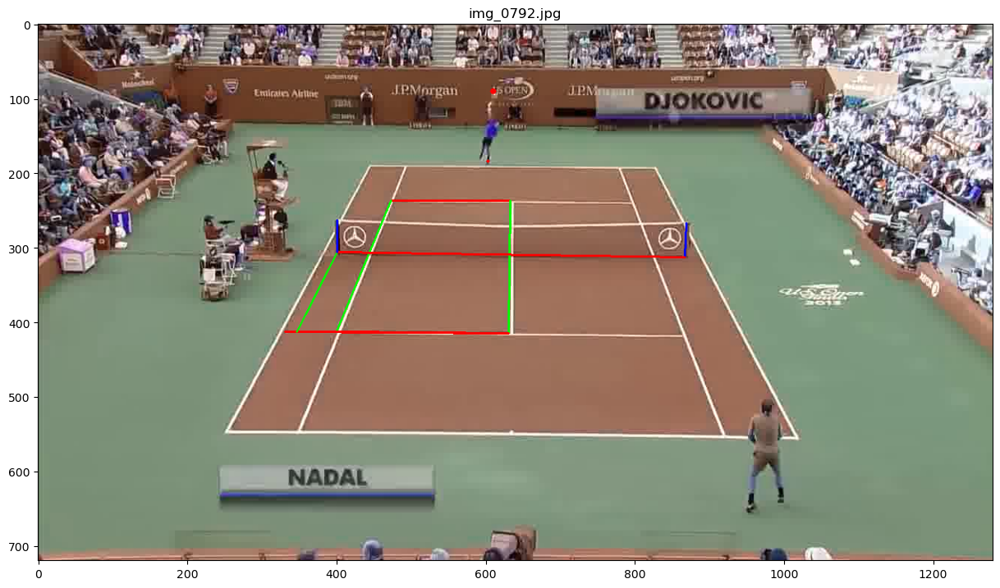

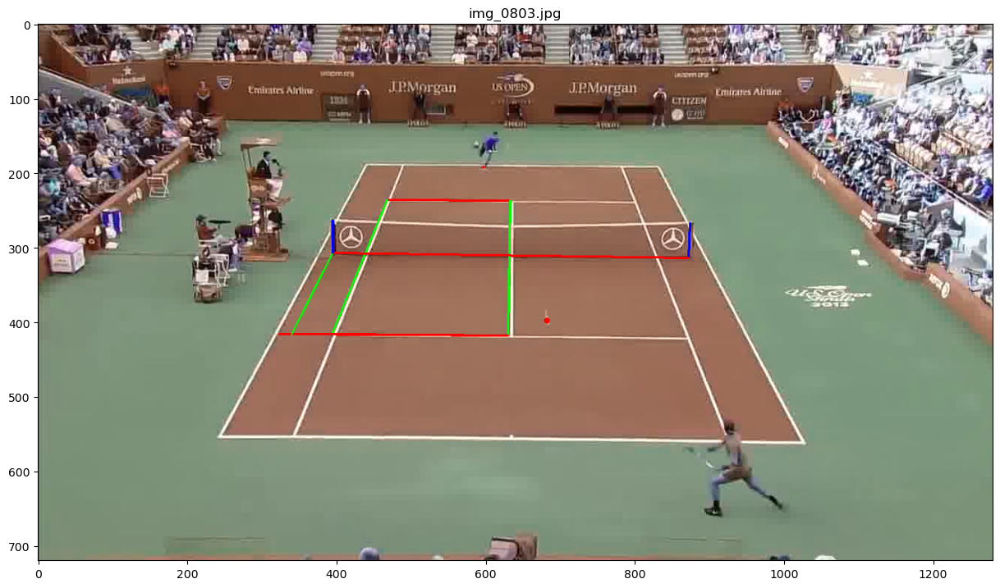

In [324]:
img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg') 
#img_name1, img_name2 = ('img_12482.jpg', 'img_12495.jpg') 
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(15,15)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(15,15))
serve_plane, end_pts = compute_plane(results_df, img_name1, img_name2, P1, P2)
serve_plane, end_pts, compute_plane_v2(results_df, img_name1, img_name2, P1, P2, f2_type='T')

(array([  -719.68,     53.25,      0.  , 194038.54]),
 (array([ 19.19, -44.32,   3.32]), array([23.63, 15.65,  1.47])))

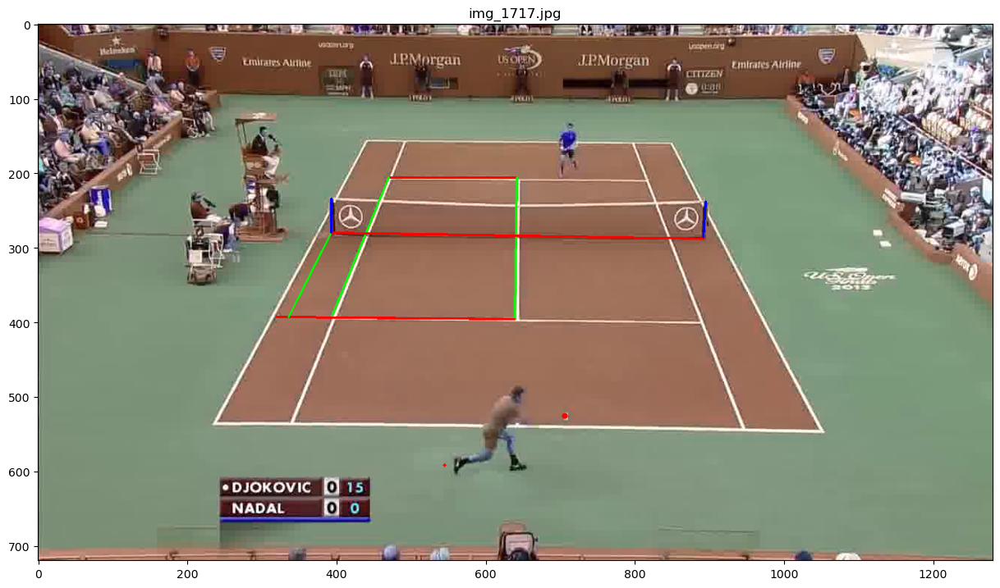

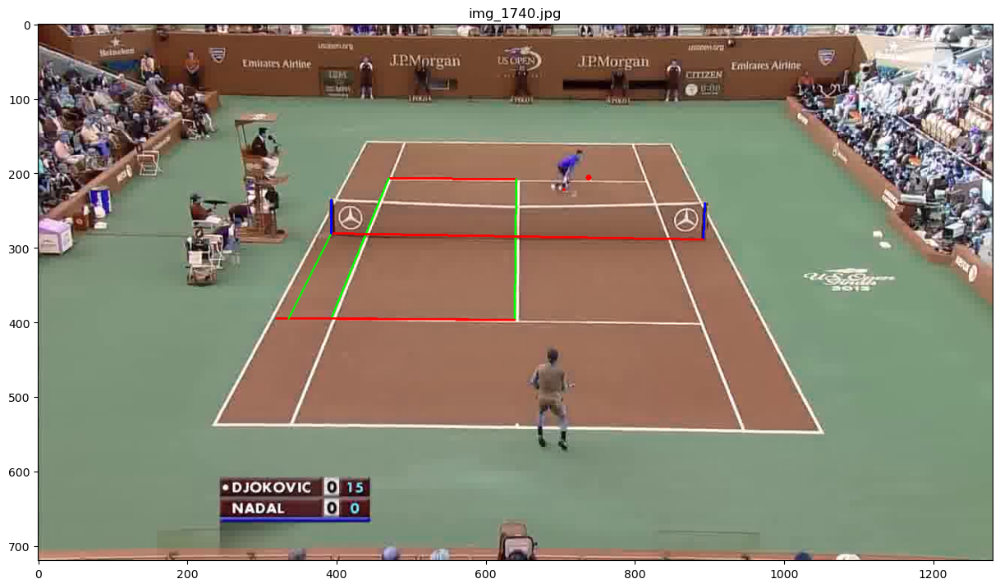

In [325]:
img_name1, img_name2 = ('img_1717.jpg', 'img_1740.jpg') 
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(15,15)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(15,15))
compute_plane_v2(results_df, img_name1, img_name2, P1, P2, f2_type='N')

In [326]:
def compute_2d_3d(df, img_name, serve_plane, P, t=None):
  row = df.loc[img_name]
  P_updated = np.concatenate([P.T, serve_plane.reshape(-1,1)], axis=1)
  P_updated_inv = np.linalg.inv(P_updated)
  ball_h_0 = np.array((*row[['x','y']].values*2,1,0)) if t is None else np.array(((*t,1,0)))
  vals = ball_h_0 @ P_updated_inv
  vals = vals/vals[-1]
  return np.around(vals[:-1]/12,3)

In [327]:
def y_dist(a,b):
  return np.abs(a[1]-b[1])

def x_dist(a,b):
  return np.abs(a[0]-b[0])

def xy_dist(a,b):
    return r2_dist(a,b,axis=0,nan_dim=1)

def ft_miles_hour(x, frames=1, fps=30):
  return x*0.000189394*fps*60*60/frames

def compute_speed(df, img_name1, img_name2, P1, P2, dist_func, sp, fps=30, frames=None):
    if check_nan(sp): return np.nan
    if frames is None: frames = fname2int(img_name2) - fname2int(img_name1)
    pt1_2d, pt2_2d = df.loc[img_name1, ['x','y']].values*2, df.loc[img_name2, ['x','y']].values*2
    pt1, pt2 = compute_2d_3d_with_plane(pt1_2d, sp, P1), compute_2d_3d_with_plane(pt2_2d, sp, P2)
    logger.debug(f'{img_name1} {img_name2} {frames} {pt1} {pt2} {np.around(ft_miles_hour(dist_func(pt1, pt2), fps=fps, frames=frames),0)}')
    return np.around(ft_miles_hour(dist_func(pt1, pt2), fps=fps, frames=frames),0)


[  -782.4      56.91      0.   210429.96] (array([ 19.19, -44.32,   3.32]), array([23.93, 20.88,  0.  ])) 58.0
[    492.27      54.93      -0.   -115822.01] (array([15.03, 41.02,  9.86]), array([19.61,  0.  ,  0.27])) 65.0


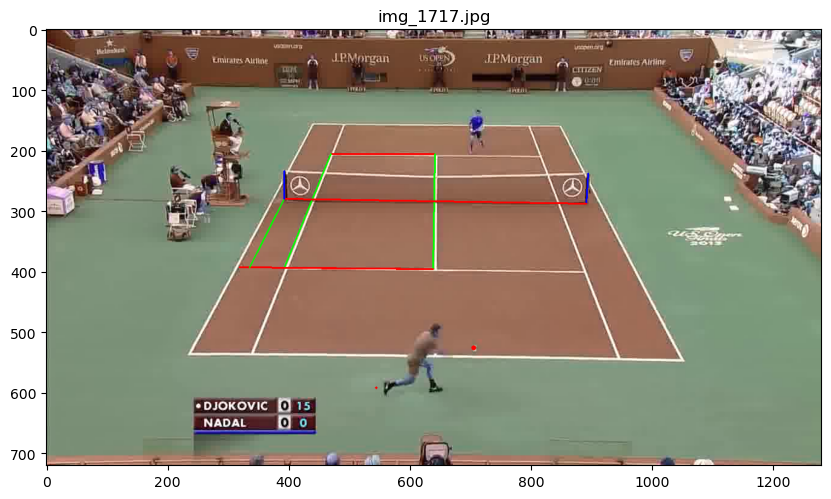

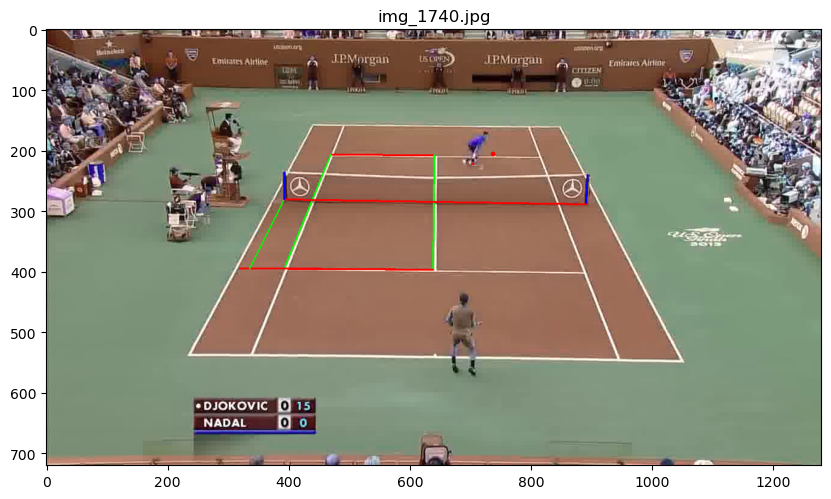

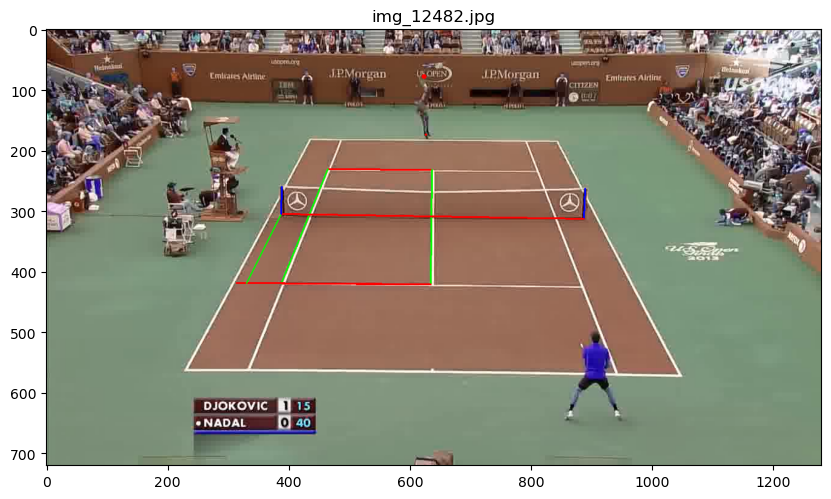

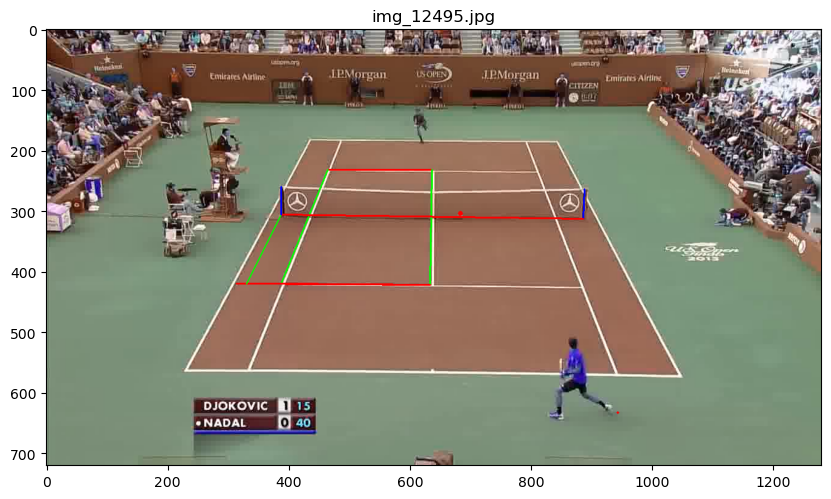

In [328]:
img_name1, img_name2 = ('img_1717.jpg', 'img_1740.jpg') 
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(10,10)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(10,10))
serve_plane, end_pts = compute_plane_v2(results_df, img_name1, img_name2, P1, P2)
print(serve_plane, end_pts, compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane))


img_name1, img_name2 = ('img_12482.jpg', 'img_12495.jpg') 
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(10,10)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(10,10))
serve_plane, end_pts = compute_plane_v2(results_df, img_name1, img_name2, P1, P2, f2_type='T')
print(serve_plane, end_pts, compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane))

In [329]:
results_df.loc['img_6340.jpg',['x','y']] = [321, 183]
results_df.loc['img_6340.jpg'].ball_c[0],results_df.loc['img_6340.jpg'].ball_c[1] = 321,183
results_df.loc['img_6340.jpg'].ball_c

array([321., 183.])

In [330]:
# np.set_printoptions()
# np.set_printoptions(precision=1)
# np.set_printoptions(suppress=True)

In [331]:
def draw_line(img, p1, p2, ax, thickness=2):
              cv2.line(img, tuple(map(int,p1)), tuple(map(int,p2)), colors.get(ax), thickness)
colors = {'x': (255,0,0), 'y': (0,255,0), 'z': (0,0,255)} #red, green, blue

In [332]:
np.set_printoptions(precision=2)
np.set_printoptions(suppress=True)
P_v1 = calculate_P(results_df, img_name1)

P shape: (3, 4), real_3d_pts: (11, 4)
real_2d_pts: [[498. 157.   1.]
 [352. 514.   1.]
 [785. 158.   1.]
 [927. 521.   1.]
 [479. 204.   1.]
 [803. 205.   1.]
 [406. 381.   1.]
 [873. 384.   1.]
 [640. 205.   1.]
 [639. 382.   1.]
 [641. 158.   1.]]
P shape: (3, 4), real_3d_pts: (5, 4)
real_2d_pts: [[641. 130.   1.]
 [638. 463.   1.]
 [642. 102.   1.]
 [541. 177.   1.]
 [540. 209.   1.]]


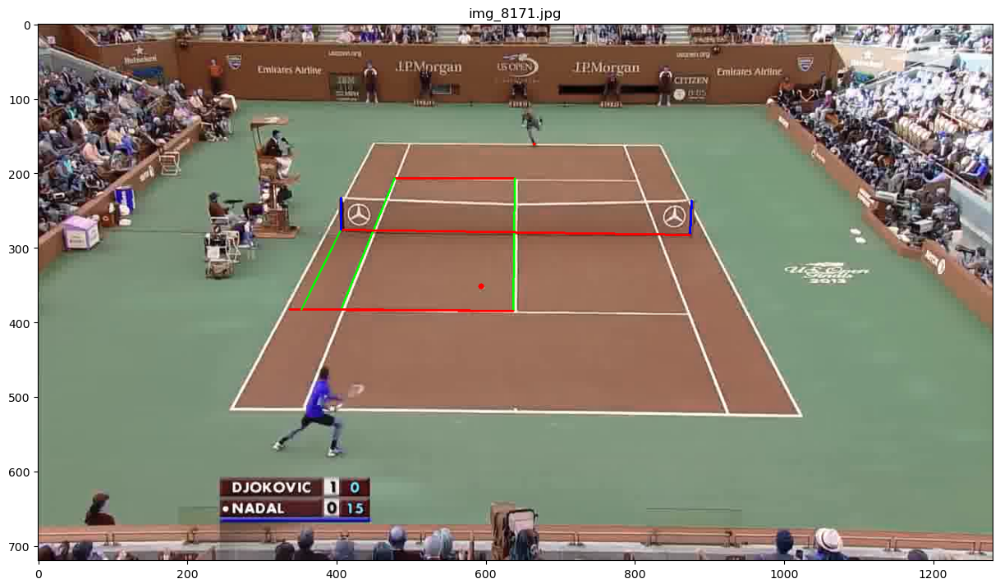

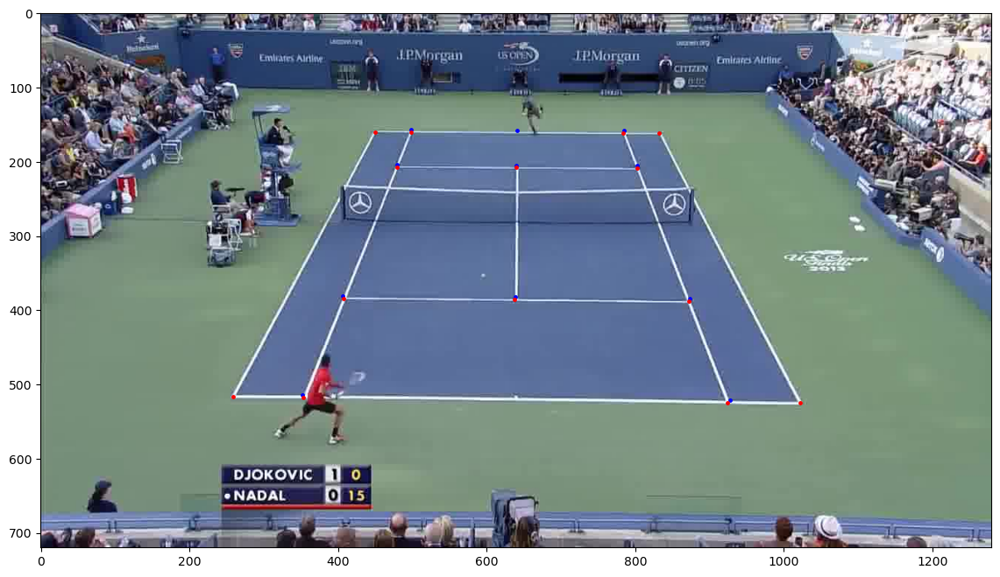

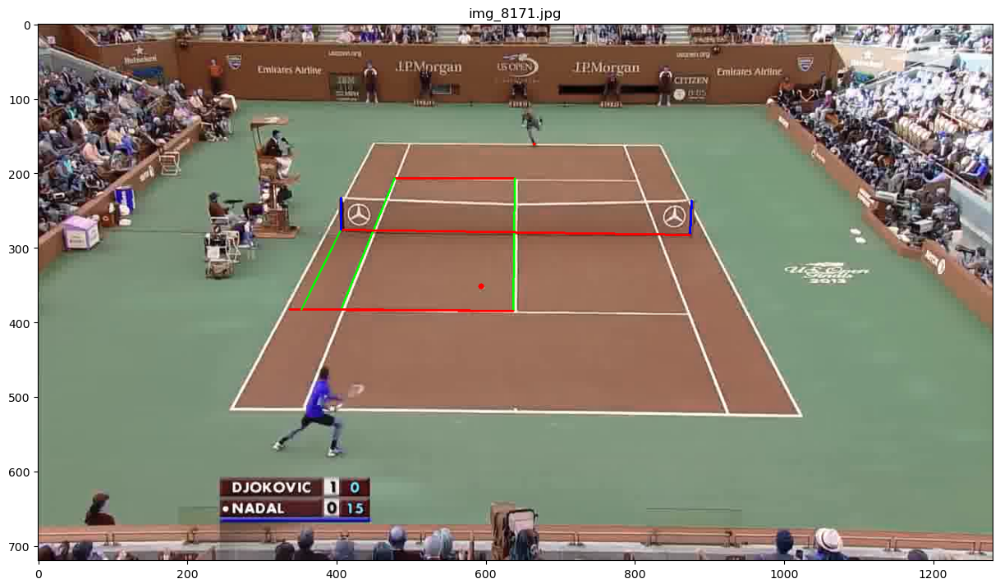

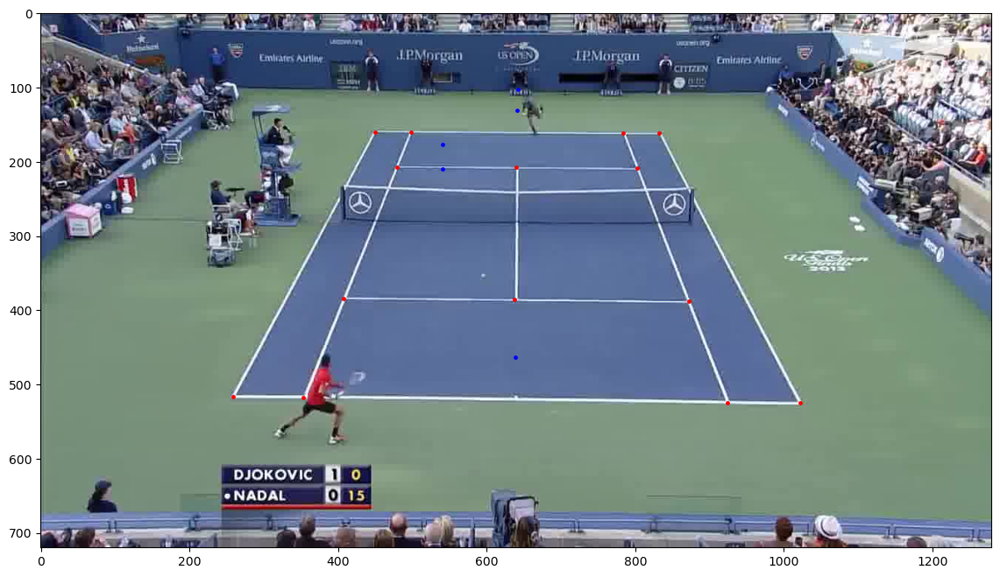

In [333]:

img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg')
#img_name1, img_name2 = 'img_19151.jpg','img_19168.jpg'
img_name2 = 'img_8171.jpg'
real_court_kps =  np.array([
    [ 3*12,   39*12,  0,  1],       #4
    [ 3*12,  -39*12,  0,  1],       #5
    [30*12,   39*12,  0,  1],       #6
    [30*12,  -39*12,  0,  1],       #7
    [ 3*12,   21*12,  0,  1],       #8
    [30*12,   21*12,  0,  1],       #9
    [ 3*12,  -21*12,  0,  1],       #10
    [30*12,  -21*12,  0,  1],       #11
    [16.5*12, 21*12,  0,  1],       #12
    [16.5*12,-21*12,  0,  1],       #13
    [16.5*12, 39*12,  0,  1],      #test
])

real_net_pts = np.array([
    [(3+13.5)*12,  39*12, 3*12, 1],       #center of net, farther baseline, net height
    [(3+13.5)*12, -39*12, 3*12, 1],       #center of net, closer baseline, net height
    [(3+13.5)*12,  39*12, 3*12*2, 1],     #center of net, farther baseline, 2x net
    [(3+13.5)*12//2, 39*12//2, 3*12, 1],  #quarter net, half way to farther baseline, net height
    [(3+13.5)*12//2, 39*12//2, 0, 1],     #quarter net, half way to farther baseline, floor
])


def validate_P_courtkp(df, f, real_3d_pts=real_court_kps, ax=None, plot_chart=True):
    P = calculate_P(df, f, plot_chart=True, figsize=(15,15))
    court_kps = df.loc[f].kp.squeeze()
    print(f'P shape: {P.shape}, real_3d_pts: {real_3d_pts.shape}')
    real_2d_pts = real_3d_pts @ P.T
    real_2d_pts = np.around(real_2d_pts/real_2d_pts[:,2:])
    print(f'real_2d_pts: {real_2d_pts}')
    if not ax: _, ax = plt.subplots(figsize=(14,8))
    img = cv2.imread(str(IMG_FOLDER/f))
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), alpha=1)
    ax.scatter(real_2d_pts[:,0], real_2d_pts[:,1],s=6, color='b')
    ax.scatter(court_kps[:,0], court_kps[:,1],s=6, color='r')
    
validate_P_courtkp(results_df, img_name2, real_3d_pts=real_court_kps)
validate_P_courtkp(results_df, img_name2, real_3d_pts=real_net_pts)

DEBUG - compute_plane_v2 - ank1: [ 13.89 -39.07   0.  ]
DEBUG - compute_plane_v2 - ball1 3d: [ 13.32 -39.07  11.23]
DEBUG - compute_plane_v2 - ball2 3d: [19.23 18.15  0.  ]
DEBUG - compute_plane_v2 - pt1_3d: [ 13.32 -39.07  11.23] pt2_3d: [19.23 18.15  0.  ]
DEBUG - compute_speed - img_19151.jpg img_19168.jpg 17 [ 13.32 -39.07  11.23] [19.23 18.15  0.  ] 69.0


69.0

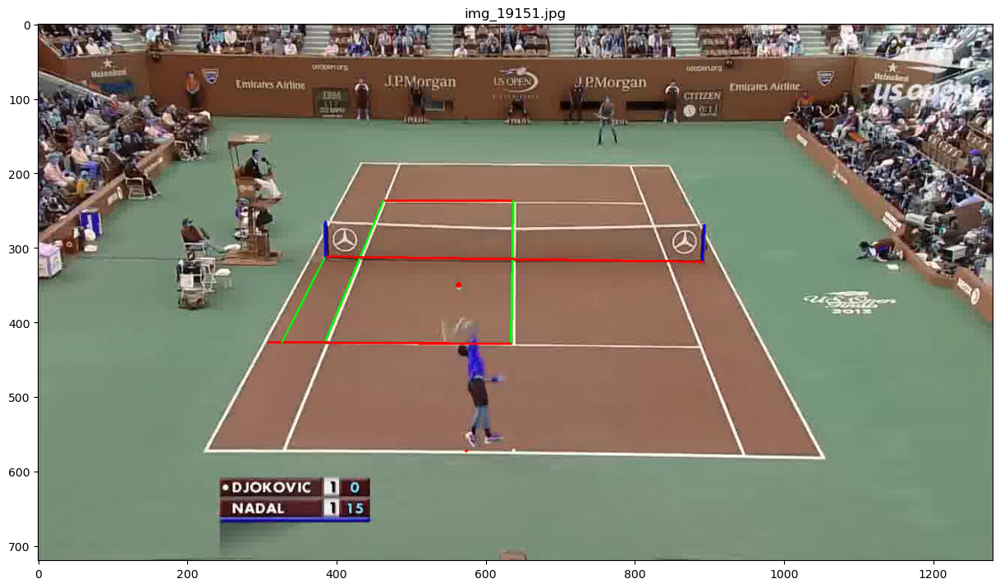

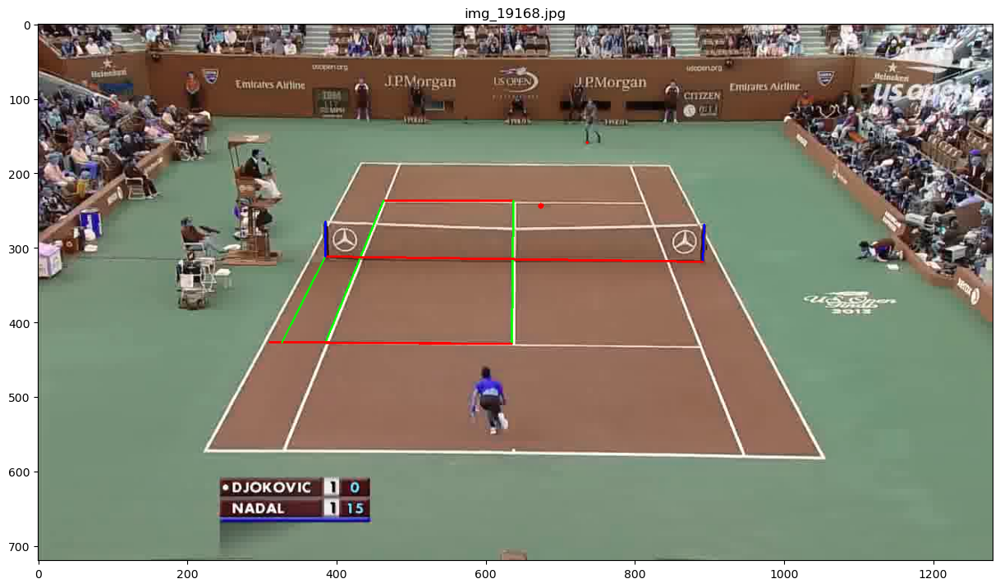

In [334]:
logger.setLevel(logging.DEBUG)
img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg') 
img_name1, img_name2 = 'img_9225.jpg','img_9238.jpg'
img_name1, img_name2 = 'img_8158.jpg','img_8171.jpg'
img_name1, img_name2 = 'img_17618.jpg','img_17633.jpg'
img_name1, img_name2 = 'img_19151.jpg','img_19168.jpg'
P1, P2 = calculate_P(results_df, img_name1, plot_chart=True, figsize=(15,15)), calculate_P(results_df, img_name2, plot_chart=True, figsize=(15,15))
serve_plane,_ = compute_plane_v2(results_df, img_name1, img_name2, P1, P2)
compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane)

In [335]:
# f = foffset_fname(results_df, img_name1, 50)
# img = cv2.imread(str(IMG_FOLDER/f))
# plt.figure(figsize=(30,30))
# plt.imshow(img)

In [336]:
# img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg')  #111
# img_name1, img_name2 =  ('img_0812.jpg', 'img_0840.jpg') #57
# #img_name1, img_name2 =  ('img_0856.jpg', 'img_0879.jpg') #66
# #img_name1, img_name2 =  ('img_0892.jpg', 'img_0946.jpg') #37
# #img_name1, img_name2 =  ('img_0963.jpg', 'img_0982.jpg') #85
# #img_name1, img_name2 =  ('img_0997.jpg', 'img_1029.jpg') #78
# #img_name1, img_name2 = ('img_6328.jpg', 'img_6341.jpg') 
# Ps = list(map(partial(calculate_P, results_df), (img_name1, img_name2)))
# serve_plane = compute_plane(results_df, img_name1, img_name2, *Ps)
# for f1_offset in (0,1,2,3):
#     for idx in range(2,14):
#         f1 = foffset_fname(results_df, img_name1, f1_offset)
#         f2 = foffset_fname(results_df, f1, idx)
#         if not np.isnan(results_df.loc[f2].ball_c).any() and not np.isnan(results_df.loc[f1].ball_c).any():
#             img_names = (f1, f2)
#             Ps = list(map(partial(calculate_P, results_df), img_names))
#             s = compute_speed(results_df, f1, f2, *Ps, dist_func=y_dist, sp=serve_plane)
#             print(f'{f1} {f2} {s}')

In [337]:
logger.setLevel(logging.DEBUG)
def compute_max_speed(df, img_name1, img_name2, f1_offsets=4, dist_func=y_dist, plot_chart=False):
    P1, P2 = calculate_P(df, img_name1, plot_chart=plot_chart), calculate_P(df, img_name2, plot_chart=plot_chart)
    serve_plane, _ = compute_plane_v2(df, img_name1, img_name2, P1, P2)
    serve_s = compute_speed(df, img_name1, img_name2, P1, P2, dist_func=dist_func, sp=serve_plane)
    all_s = []
    slice_df = df.loc[img_name1:img_name2]
    all_fs = slice_df[slice_df.ball_c.map(lambda x: not np.isnan(x).any())].index.values[:f1_offsets]
    logger.debug(f'all_fs: {all_fs}')
    speed_dict = {}
    for idx1 in range(len(all_fs)):
        max_s = 0 
        for idx2 in range(idx1+1, len(all_fs)):
            f1, f2 = all_fs[idx1], all_fs[idx2]
            P1, P2 = calculate_P(df, f1, plot_chart=False), calculate_P(df, f2, plot_chart=plot_chart)
            s = compute_speed(df, f1, f2, P1, P2, dist_func=dist_func, sp=serve_plane)
            speed_dict[(f1,f2)] = s
    logger.debug(f'speed_dict: {speed_dict}')
    excl_speed_dict = {}
    for remove_f in all_fs:
        max_s = 0 
        for (f1,f2),s in speed_dict.items():
            if not (f1==remove_f or f2==remove_f):
                if s>max_s: max_s=s
        excl_speed_dict[remove_f] = max_s

    logger.debug(sorted(excl_speed_dict.items(), key=lambda item: item[1]))
    first_item, second_item = sorted(excl_speed_dict.items(), key=lambda item: item[1])[0], sorted(excl_speed_dict.items(), key=lambda item: item[1])[1]
    sel_item = first_item if first_item[0]!=img_name1 else second_item
    return sel_item, sel_item[1]/serve_s
                
            
    

img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg')  
img_name1, img_name2 = 'img_1608.jpg', 'img_1622.jpg'
img_name1, img_name2 = 'img_5395.jpg','img_5408.jpg'
#img_name1, img_name2 = 'img_6325.jpg','img_6343.jpg'
#img_name1, img_name2 = 'img_7145.jpg','img_7168.jpg'
#img_name1, img_name2 = 'img_8158.jpg','img_8171.jpg'

#img_name1, img_name2 = 'img_9225.jpg','img_9238.jpg'
#img_name1, img_name2 = 'img_10811.jpg','img_10822.jpg'
#img_name1, img_name2 = 'img_17618.jpg','img_17633.jpg'
#img_name1, img_name2 = 'img_19151.jpg','img_19168.jpg'
compute_max_speed(results_df, img_name1, img_name2, f1_offsets=15, plot_chart=False)

DEBUG - compute_plane_v2 - ank1: [13.33 39.77  0.  ]
DEBUG - compute_plane_v2 - ball1 3d: [13.89 39.77 10.16]
DEBUG - compute_plane_v2 - ball2 3d: [ 27.23 -17.64   0.  ]
DEBUG - compute_plane_v2 - pt1_3d: [13.89 39.77 10.16] pt2_3d: [ 27.23 -17.64   0.  ]
DEBUG - compute_speed - img_5395.jpg img_5408.jpg 13 [13.89 39.77 10.16] [ 27.23 -17.64  -0.  ] 90.0
DEBUG - compute_max_speed - all_fs: ['img_5395.jpg' 'img_5396.jpg' 'img_5397.jpg' 'img_5398.jpg'
 'img_5399.jpg' 'img_5401.jpg' 'img_5402.jpg' 'img_5403.jpg'
 'img_5404.jpg' 'img_5405.jpg' 'img_5406.jpg' 'img_5407.jpg'
 'img_5408.jpg']
DEBUG - compute_speed - img_5395.jpg img_5396.jpg 1 [13.89 39.77 10.16] [15.   35.01  9.29] 97.0
DEBUG - compute_speed - img_5395.jpg img_5397.jpg 2 [13.89 39.77 10.16] [16.05 30.5   8.3 ] 95.0
DEBUG - compute_speed - img_5395.jpg img_5398.jpg 3 [13.89 39.77 10.16] [17.03 26.26  7.73] 92.0
DEBUG - compute_speed - img_5395.jpg img_5399.jpg 4 [13.89 39.77 10.16] [18.12 21.58  6.63] 93.0
DEBUG - compute_spe

(('img_5396.jpg', 99.0), 1.1)

In [338]:
logger.setLevel(logging.DEBUG)
def compute_max_speed_v2(df, img_name1, img_name2, f1_offsets=4, dist_func=y_dist, plot_chart=False, f2_type='B', ret_ends=False):
    P1, P2 = calculate_P(df, img_name1, plot_chart=False), calculate_P(df, img_name2, plot_chart=plot_chart)
    serve_plane, end_pts = compute_plane_v2(df, img_name1, img_name2, P1, P2, f2_type=f2_type)
    if np.isnan(serve_plane).any(): return (np.nan,np.nan) if not ret_ends else (np.nan, np.nan),(np.nan, np.nan)
    serve_s = compute_speed(df, img_name1, img_name2, P1, P2, dist_func=dist_func, sp=serve_plane)
    all_s = []
    slice_df = df.loc[img_name1:img_name2]
    all_fs = slice_df[slice_df.ball_c.map(lambda x: not np.isnan(x).any())].index.values[:f1_offsets]
    logger.debug(f'all_fs: {all_fs}')
    speed_dict = {}
    for f1 in all_fs:
        f2 = img_name2
        P1, P2 = calculate_P(df, f1, plot_chart=plot_chart), calculate_P(df, f2, plot_chart=False)
        s_avg = compute_speed(df, f1, f2, P1, P2, dist_func=dist_func, sp=serve_plane)
        n_frames = fname2int(f2)-fname2int(f1)
        s_ini = s_avg + n_frames*(n_frames-1)/2 * 0.2
        s_ini = s_avg + (n_frames-1)/2 * (s_avg**2) * 3.5e-4
        speed_dict[(f1,f2)] = s_ini
        #print(f'{f1} {f2} {n_frames} {s_avg} {s_ini}')
    logger.debug(f'speed_dict: {sorted(speed_dict.items(), key=lambda item: item[1], reverse=True)}')

    first_item, second_item =  sorted(speed_dict.items(), key=lambda item: item[1], reverse=True)[0],  sorted(speed_dict.items(), key=lambda item: item[1], reverse=True)[1]
#    if first_item[1]/second_item[1]>1.15:
    if first_item[1]>140:
        print(f'first item corrupted. {first_item[1]} {second_item[1]}')
        return second_item if (not ret_ends) else (second_item, end_pts)
    else:
        return first_item if (not ret_ends) else (first_item, end_pts)

f_type = 'B'
img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg')  
img_name1, img_name2 = 'img_1608.jpg', 'img_1622.jpg'
img_name1, img_name2 = 'img_5395.jpg','img_5408.jpg'
img_name1, img_name2 = 'img_6325.jpg','img_6341.jpg'
img_name1, img_name2 = 'img_7145.jpg','img_7168.jpg'
#img_name1, img_name2 = 'img_8158.jpg','img_8171.jpg'
#img_name1, img_name2 = 'img_9225.jpg','img_9238.jpg'
img_name1, img_name2 = 'img_10811.jpg','img_10822.jpg'
#img_name1, img_name2 = 'img_12482.jpg','img_12495.jpg'
#img_name1, img_name2 = 'img_12843.jpg','img_12858.jpg'
    
#img_name1, img_name2 = 'img_14303.jpg','img_14317.jpg'
#img_name1, img_name2 = 'img_17618.jpg','img_17633.jpg'
#img_name1, img_name2 = 'img_18803.jpg','img_18820.jpg' #net 
#img_name1, img_name2 = 'img_19151.jpg','img_19168.jpg'
#img_name1, img_name2 = 'img_26651.jpg','img_26664.jpg'

#img_name1, img_name2 = 'img_17297.jpg','img_17308.jpg'
#img_name1, img_name2 = 'img_45018.jpg','img_45030.jpg'
#img_name1, img_name2 = 'img_65531.jpg','img_65541.jpg'
#img_name1, img_name2 = 'img_51967.jpg','img_51978.jpg'
#img_name1, img_name2 = 'img_53065.jpg','img_53081.jpg'
img_name1, img_name2, f_type = 'img_28165.jpg', 'img_28180.jpg', 'T'

compute_max_speed_v2(results_df, img_name1, img_name2, f1_offsets=4, plot_chart=False, f2_type=f_type, ret_ends=True)

DEBUG - compute_plane_v2 - ank1: [ 19.3  -38.54   0.  ]
DEBUG - compute_plane_v2 - ball1 3d: [ 18.28 -38.54  10.68]
DEBUG - compute_plane_v2 - ball2 3d: [7.69 0.   4.67]
DEBUG - compute_plane_v2 - pt1_3d: [ 18.28 -38.54  10.68] pt2_3d: [7.69 0.   4.67]
DEBUG - compute_speed - img_28165.jpg img_28180.jpg 15 [ 18.28 -38.54  10.68] [7.69 0.   4.67] 53.0
DEBUG - compute_max_speed_v2 - all_fs: ['img_28165.jpg' 'img_28166.jpg' 'img_28167.jpg' 'img_28168.jpg']
DEBUG - compute_speed - img_28165.jpg img_28180.jpg 15 [ 18.28 -38.54  10.68] [7.69 0.   4.67] 53.0
DEBUG - compute_speed - img_28166.jpg img_28180.jpg 14 [ 17.21 -34.65  10.2 ] [7.69 0.   4.67] 51.0
DEBUG - compute_speed - img_28167.jpg img_28180.jpg 13 [ 16.11 -30.66   9.88] [7.69 0.   4.67] 48.0
DEBUG - compute_speed - img_28168.jpg img_28180.jpg 12 [ 15.01 -26.63   9.31] [7.69 0.   4.67] 45.0
DEBUG - compute_max_speed_v2 - speed_dict: [(('img_28165.jpg', 'img_28180.jpg'), 59.88205), (('img_28166.jpg', 'img_28180.jpg'), 56.9172750000

((('img_28165.jpg', 'img_28180.jpg'), 59.88205),
 (array([ 18.28, -38.54,  10.68]), array([7.69, 0.  , 4.67])))

In [341]:
# P1, P2 = calculate_P(results_df, 'img_5395.jpg'),  calculate_P(results_df, 'img_5408.jpg')
# serve_plane = compute_plane(results_df, 'img_5395.jpg','img_5408.jpg', P1, P2)
# P1, P2 = calculate_P(results_df, 'img_5395.jpg'),  calculate_P(results_df, 'img_5396.jpg')
# compute_speed(results_df, 'img_5395.jpg','img_5396.jpg', P1, P2, dist_func=y_dist, sp=serve_plane)

In [342]:
#img_name1, img_name2 = ('img_0792.jpg', 'img_0803.jpg')  
#img_name1, img_name2 = 'img_1608.jpg', 'img_1622.jpg'
#img_name1, img_name2 = 'img_5395.jpg','img_5408.jpg'
#img_name1, img_name2 = 'img_6325.jpg','img_6341.jpg'
#img_name1, img_name2 = 'img_7145.jpg','img_7168.jpg'
#img_name1, img_name2 = 'img_8158.jpg','img_8171.jpg'
#img_name1, img_name2 = 'img_9225.jpg','img_9238.jpg'
#img_name1, img_name2 = 'img_10811.jpg','img_10822.jpg'
#img_name1, img_name2 = 'img_10811.jpg','img_10822.jpg'
# img_name1, img_name2 = 'img_12843.jpg','img_12858.jpg'
# img_name1, img_name2 = 'img_14303.jpg','img_14317.jpg'
# img_name1, img_name2 = 'img_17618.jpg','img_17633.jpg'
# img_name1, img_name2 = 'img_18803.jpg','img_18820.jpg' #net 
# img_name1, img_name2 = 'img_19151.jpg','img_19168.jpg'


# plot_shot(results_df, img_name1, img_name2, (255,0,0), 3, 2)

In [343]:
validate_speed_fs = []
for idx, row in points_df.iterrows():
    if row.shot_type=='S':
       f1, f2 = row.img_name, points_df.iloc[idx+1].img_name
       validate_speed_fs.append(f"img_name1, img_name2 = '{f1}','{f2}'")
#serve_speed_gt = defaultdict(int)

In [344]:
serve_speed_gt = defaultdict(int)
serve_speed_gt[0] = 121,('F','St') #120
serve_speed_gt[1] = 98,('F','Si')  #101
serve_speed_gt[2] = 108,('F','Si') #104
serve_speed_gt[3] = 113,('F','St') #109
serve_speed_gt[4] = 110,('F','St') #107
serve_speed_gt[5] = 120,('F','St') #110
serve_speed_gt[6] = 119,('F','Si') #117 
serve_speed_gt[7] = 122,('F','B')  #138
serve_speed_gt[8] = 119,('F','T')  #
serve_speed_gt[9] = 87,('F','Si')  #98
serve_speed_gt[10] = 122,('F','T') #
serve_speed_gt[11] = 93, ('F','B') #99
serve_speed_gt[12] = 114,('F','Si')#107
serve_speed_gt[13] = 115,('F','B') #110
serve_speed_gt[14] = 123,('N','St')#120
serve_speed_gt[15] = 88,('N','St') #97
serve_speed_gt[16] = 117,('N','T') #
serve_speed_gt[17] = 89,('N','St') #99
serve_speed_gt[18] = 123,('N','St')# 118
serve_speed_gt[19] = 98,('N','T') # net, speed not recorded
serve_speed_gt[20] = 91,('N','B') #97
serve_speed_gt[21] = 115,('N','T') #net
serve_speed_gt[22] = 111,('N','Si')#109
serve_speed_gt[23] = 118,('N','St')#121
serve_speed_gt[24] = 93,('N','B')  #98
serve_speed_gt[25] = 111,('N','Si')#107
serve_speed_gt[26] = 119,('N','Si')#112
serve_speed_gt[27] = 107,('N','T') #
serve_speed_gt[28] = 93,('N','Si') #102
serve_speed_gt[29] = 123,('N','Si')#116
serve_speed_gt[30] = 109,('N','Si')#112
serve_speed_gt[31] = 112,('N','B') #111
serve_speed_gt[32] = 107,('N','T') #119
serve_speed_gt[33] = 79,('N','St') #
serve_speed_gt[34] = 110,('N','T')
serve_speed_gt[35] = 84,('N','B')
serve_speed_gt[36] = 119,('N','T')
serve_speed_gt[37] = 87,('N','B')
serve_speed_gt[38] = 112,('N','Si')
serve_speed_gt[39] = 111 ,('N','St')
serve_speed_gt[40] = 107,('N','Si')
serve_speed_gt[41] = 110,('F','St')
serve_speed_gt[42] = 120,('F','St')
serve_speed_gt[43] = 90,('F','Si')
serve_speed_gt[44] = 111,('F','Si')
serve_speed_gt[45] = 116,('F','T')
serve_speed_gt[46] = 87,('F','B')
serve_speed_gt[47] = 119,('F','St')
serve_speed_gt[48] = 113,('F','T')
serve_speed_gt[49] = 85,('F','B')
serve_speed_gt[50] = 121,('F','St')


In [345]:
# logger.setLevel(logging.DEBUG)
# idx =33
# exec(validate_speed_fs[idx])
# compute_max_speed_v2(results_df, img_name1, img_name2, f1_offsets=4, plot_chart=True)

In [346]:
compute_max_speed_v2(results_df, f1, f2, f1_offsets=4, plot_chart=False)

DEBUG - compute_plane_v2 - ank1: [ 13.8  -39.47   0.  ]
DEBUG - compute_plane_v2 - ball1 3d: [ 14.06 -39.47  10.97]
DEBUG - compute_plane_v2 - ball2 3d: [16.19 60.7   0.  ]
DEBUG - compute_plane_v2 - pt1_3d: [ 14.06 -39.47  10.97] pt2_3d: [16.19 60.7   0.  ]
DEBUG - compute_speed - img_102728.jpg img_107415.jpg 4687 [ 14.06 -39.47  10.97] [16.19 60.7  -0.  ] 0.0
DEBUG - compute_max_speed_v2 - all_fs: ['img_102728.jpg' 'img_102730.jpg' 'img_102731.jpg' 'img_102732.jpg']
DEBUG - compute_speed - img_102728.jpg img_107415.jpg 4687 [ 14.06 -39.47  10.97] [16.19 60.7  -0.  ] 0.0
DEBUG - compute_speed - img_102730.jpg img_107415.jpg 4685 [ 14.46 -20.9    5.66] [16.19 60.7  -0.  ] 0.0
DEBUG - compute_speed - img_102731.jpg img_107415.jpg 4684 [14.86 -2.23  0.47] [16.19 60.7  -0.  ] 0.0
DEBUG - compute_speed - img_102732.jpg img_107415.jpg 4683 [15.44 25.34 -7.15] [16.19 60.7  -0.  ] 0.0
DEBUG - compute_max_speed_v2 - speed_dict: [(('img_102728.jpg', 'img_107415.jpg'), 0.0), (('img_102730.jpg',

(('img_102728.jpg', 'img_107415.jpg'), 0.0)

In [347]:
logger.setLevel(logging.INFO)
count = -1
all_errors = []
for idx, row in points_df.iterrows():
    if row.shot_type=='S':
        count += 1 
        f1, f2, s1_ty, s2_ty, s1_r, s2_r = row.img_name, points_df.iloc[idx+1].img_name, row.shot_type, points_df.iloc[idx+1].shot_type, row.return_type, points_df.iloc[idx+1].return_type
        #print(f'{f1} {f2} {s1_ty} {s2_ty} {s1_r} {s2_r}')
        try:
            f, max_s= compute_max_speed_v2(results_df, f1, f2, f1_offsets=6, plot_chart=False)
        except:
            print(f'failed {f1} {f2}')
            continue
        error = (max_s/serve_speed_gt[count][0]-1)*100 if count<51  else np.nan
        print(f'{count} {f1}:{f2} {s2_r} - {max_s} {serve_speed_gt[count]} {error: 0.2f}')#{speed_r:0.1f}')
        #if s2_r!='T': all_errors.append(error)
        if count<51 and (serve_speed_gt[count][1][1]!='T' and s2_r!='T'): all_errors.append(error)
        

0 img_0792.jpg:img_0803.jpg B - 131.175 (121, ('F', 'St'))  8.41
1 img_1608.jpg:img_1622.jpg B - 98.672475 (98, ('F', 'Si'))  0.69
2 img_5395.jpg:img_5421.jpg R - 77.279375 (108, ('F', 'Si')) -28.45
3 img_6325.jpg:img_6344.jpg E - 103.965625 (113, ('F', 'St')) -8.00
4 img_7148.jpg:img_7173.jpg R - 73.6202 (110, ('F', 'St')) -33.07
5 img_8158.jpg:img_8210.jpg B - 14.212575 (120, ('F', 'St')) -88.16
6 img_9225.jpg:img_10830.jpg R - 5.51685 (119, ('F', 'Si')) -95.36
7 img_10811.jpg:img_10898.jpg B - 50.3863 (122, ('F', 'B')) -58.70
8 img_12482.jpg:img_12891.jpg B - 1.0714 (119, ('F', 'T')) -99.10
9 img_12843.jpg:img_13881.jpg S - 1.181475 (87, ('F', 'Si')) -98.64
10 img_13881.jpg:img_14349.jpg B - 1.081725 (122, ('F', 'T')) -99.11
11 img_14303.jpg:img_14386.jpg B - 43.949475 (93, ('F', 'B')) -52.74
12 img_15439.jpg:img_16228.jpg S - 6.1896 (114, ('F', 'Si')) -94.57
13 img_16228.jpg:img_16310.jpg B - 39.890950000000004 (115, ('F', 'B')) -65.31
14 img_17297.jpg:img_17654.jpg R - 10.0527 (12

In [348]:
#validation that F/N are followed by side==B or return_type==T or shot_type==S
for clip_num in sorted(points_df.clip_num.value_counts().index.values):
    points_clip_df = filter_clip(points_df, clip_num).reset_index(drop=True)
    for idx, row in points_clip_df.iterrows():
        if idx==len(points_clip_df)-1: break
        next_row = points_clip_df.iloc[idx+1]
        if (row.side in ('N','F')) and not ((next_row.side in ('B')) or next_row.return_type in ('T') or next_row.shot_type in ('S')):
            print(f'clip:{clip_num} {idx} {len(points_clip_df)} {row.img_name,row.side} {next_row.img_name,next_row.side}')
            

clip:1.0 6 10 ('img_1717.jpg', 'N') ('img_1740.jpg', 'F')
clip:49.0 13 17 ('img_20957.jpg', 'F') ('img_20990.jpg', 'N')
clip:87.0 6 18 ('img_55534.jpg', 'F') ('img_55553.jpg', 'N')
clip:87.0 9 18 ('img_55588.jpg', 'F') ('img_55644.jpg', 'N')
clip:87.0 12 18 ('img_55671.jpg', 'F') ('img_55694.jpg', 'N')
clip:117.0 30 34 ('img_77236.jpg', 'N') ('img_77310.jpg', 'F')
clip:195.0 26 30 ('img_95933.jpg', 'F') ('img_95968.jpg', 'N')


In [349]:
def compute_heels_3d(row, col='n_heels', df=results_df):
    f = row.img_name
    if check_nan(df.loc[f,col]): return np.array([np.nan, np.nan, np.nan])
    heels_2d = df.loc[f,col].mean(axis=0)
    heels_2d = max(df.loc[f,col], key=lambda x: x[1]) if col=='f_heels' else (min(df.loc[f,col], key=lambda x: x[1]) if col=='n_heels' else np.nan)
    P = calculate_P(df, f)
    heels_3d = np.array([*heels_2d,1]) @ LA.inv(P.T[[0,1,3]])
    heels_3d = np.around(np.array([*heels_3d[:2]/heels_3d[-1],0])/12,1)
    logger.debug(f'f: {f} heels_2d: {heels_2d} heels_3d: {heels_3d}')
    return heels_3d

In [350]:
def compute_hit_angle(pt1, pt2, side):
    if check_nan(pt1) or check_nan(pt2): return np.nan
    hit_v = pt2 - pt1
    y_axis = np.array([0, 1, 0])
    #logger.debug(f'dot: {np.dot(hit_v, y_axis)}, mod: {np.sqrt(np.sum(hit_v**2))} arccos: {np.arccos( np.dot(hit_v, y_axis) / np.sqrt(np.sum(hit_v**2)) )}')
    theta = np.degrees( np.arccos( np.dot(hit_v, y_axis) / np.sqrt(np.sum(hit_v**2)) ) )
    theta = 180-theta if theta>90 else theta
    theta = theta if ((hit_v[0]>0 and side=='N')|(hit_v[0]<0 and side=='F')) else -theta 
    return theta 

In [351]:
def assign_results(df):
    for idx,row in df.iterrows():
        prev_idx = df.index[df.index.get_loc(idx)-1]
        if row.return_type in ('T'):
            df.loc[idx,'result'] = 'L'
            df.loc[prev_idx,'result'] = 'W'
        elif row.return_type in ('E'):
            if row.shot_type=='S':
                cond1 = (row.ball_3d[0]<=16.5 and row.ball_3d_f1[0]>=16.5 and row.ball_3d_f1[0]<=30)
                cond2 = (row.ball_3d[0]>16.5 and row.ball_3d_f1[0]<=16.5 and row.ball_3d_f1[0]>=3)
                cond3 = row.b2bl>=18
                logger.debug(f'cond1 {cond1}  cond2 {cond2} cond3 {cond3}')
                if (cond1 or cond2) and cond3:
                    logger.debug(f'entered S and inside 1')
                    df.loc[idx,'result'] = 'W'
                    df.loc[prev_idx,'result'] = 'L'
                else:
                    logger.debug(f'entered S and inside 2')
                    df.loc[idx,'result'] = 'L'
                    df.loc[prev_idx,'result'] = 'W'
            elif (row.shot_type!='S') and (row.b2sl<0 or row.b2bl<0):
                logger.debug(f'entered S and inside 3')
                df.loc[idx,'result'] = 'L'
                df.loc[prev_idx,'result'] = 'W'
            elif (row.shot_type!='S') and (row.b2sl>=0 and row.b2bl>=0):
                logger.debug(f'not S and inside 3')
                df.loc[idx,'result'] = 'W'
                df.loc[prev_idx,'result'] = 'L'
        elif row.return_type in ('R'):
            df.loc[idx,'result'] = 'R'
        else:
            df.loc[idx,'result'] = 'O'
            

In [352]:
logger.setLevel(logging.INFO)
clip_num = 7 

def gen_point_attribs(point_df, clip_num, df=results_df):
    point_clip_df = filter_clip(points_df, clip_num).reset_index(drop=True)
    point_clip_df['f_heels'] = point_clip_df.apply(lambda row: compute_heels_3d(row, col='f_heels'), axis=1)
    point_clip_df['n_heels'] = point_clip_df.apply(lambda row: compute_heels_3d(row, col='n_heels'), axis=1)
    all_rows = []
    for idx, row in point_clip_df.iterrows():
        row['player'] = df.loc[row.img_name].f_p if row.side=='F' else (df.loc[row.img_name].n_p if row.side=='N' else np.nan)
        next_row = point_clip_df.iloc[idx+1] if idx<len(point_clip_df)-1 else pd.Series(np.nan, index=row.index)
        logger.debug(f'next row: {row.img_name} {next_row.img_name}')
        if row.side in ('N','F') and type(next_row.img_name) is str:
            #print(f'idx: {idx} {row.img_name} {next_row.img_name}')
            #next_bounce =  True if next_row.side=='B' else False
            f2_type = 'T' if next_row.return_type=='T' else next_row.side
            (_, x_max_s), _ = compute_max_speed_v2(df, row.img_name, next_row.img_name, f1_offsets=6, dist_func=x_dist, plot_chart=False, f2_type=f2_type, ret_ends=True)
            (_, y_max_s), end_pts = compute_max_speed_v2(df, row.img_name, next_row.img_name, f1_offsets=6, dist_func=y_dist, plot_chart=False, f2_type=f2_type, ret_ends=True)
            if x_max_s>40 or y_max_s>150: print('Out of range speed')
            row['x_speed'] = round(x_max_s) if not np.isnan(x_max_s) and x_max_s<40 else np.nan
            row['y_speed'] = round(y_max_s) if not np.isnan(y_max_s) and y_max_s<150 else np.nan
            end_pts = np.around(end_pts,1) if (not check_nan(end_pts[0]) and not check_nan(end_pts[1])) else (np.nan, np.nan)
            #print(f'end_pts: {end_pts}')
            row['ball_3d'], next_pt = end_pts
            row['ball_3d_f1'] = next_pt
            cur_heels, opp_heels = (row.n_heels, row.f_heels) if row.side=='N' else (row.f_heels, row.n_heels)     
            row['hh2c'], row['hh2n'] = (16.5 - cur_heels[0],  -cur_heels[1]) if row.side=='N' else (-16.5 + cur_heels[0],  cur_heels[1]) #hit heels to center line
            row['oh2c'], row['oh2n'] = (16.5 - opp_heels[0],  -opp_heels[1]) if neg_side(row.side)=='N' else (-16.5 + opp_heels[0],  opp_heels[1]) #oppsite heels to center line
            row['r2b_theta'] = np.around(compute_hit_angle(row['ball_3d'], next_pt, row.side),1) #return to bounce theta 
            row['r2h_theta'] = np.around(compute_hit_angle(row['ball_3d'], opp_heels, row.side),1)
            #print(f"{opp_heels} {row['r2b_theta']} {row['r2h_theta']}")
            if next_row.side=='B' and not check_nan(next_pt):
                logger.debug(f'next_pt: {next_pt}, opp_heels: {opp_heels}')
                row['b2sl'], row['b2bl'] = min(next_pt[0]-3, 30-next_pt[0]), 39-(-next_pt[1] if neg_side(row.side)=='N' else next_pt[1])
                row['b2h_x'], row['b2h_y'], _ = (next_pt - opp_heels) if neg_side(row.side)=='N' else -(next_pt - opp_heels) # bounce in current frame to opposite player heels in current frame
                #overrides:
                if row.img_name in ('img_8348.jpg'): row.b2sl = -1*row.b2sl
                prev_row = point_clip_df.iloc[max(idx-2,0):idx][point_clip_df.side==neg_side(row.side)]
                if prev_row.shape[0]>0:
                    prev_opp_heels = prev_row.n_heels.values[0] if neg_side(row.side)=='N' else prev_row.f_heels.values[0]
                    #print(f' prev row {prev_row.n_heels} prev {prev_opp_heels}')
                    row['r2ph_theta'] = np.around(compute_hit_angle(row['ball_3d'], prev_opp_heels, row.side),1)
                    row['b2ph_x'], row['b2ph_y'], _ = (next_pt - prev_opp_heels)  if neg_side(row.side)=='N' else -(next_pt - prev_opp_heels) # bounce in current frame to opposite player heels in previous return frame 
                else:
                    row['b2ph_x'], row['b2ph_y'], row['r2ph_theta'] = [np.nan]*3 
            else:
                row['b2sl'], row['b2bl'], row['b2h_x'], row['b2h_y'], row['b2ph_x'], row['b2ph_y'], row['r2ph_theta']= [np.nan]*7
        else:
            if row.side in ('B'):
                row['ball_3d'] = next_pt
        all_rows.append(row)
    point_clip_df = pd.DataFrame(all_rows)
    point_clip_df = point_clip_df.loc[ (point_clip_df.side=='F') | (point_clip_df.side=='N')]
    point_clip_df['r2r_theta'] = point_clip_df['r2b_theta'] - point_clip_df['r2b_theta'].shift(1)
    point_clip_df['h2h_theta'] = point_clip_df['r2h_theta'] - point_clip_df['r2ph_theta']
    point_clip_df.loc[point_clip_df.shot_type=='S',['r2r_theta', 'h2h_theta','b2ph_x','b2ph_y']] = np.nan
    # point_clip_df['net_theta'] = point_clip_df['r2r_theta'] - point_clip_df['h2h_theta']
    # point_clip_df['theta_cov'] = point_clip_df['net_theta'] / point_clip_df['r2r_theta']
    # point_clip_df['x_cov'] = point_clip_df['b2h_x'] / point_clip_df['b2ph_x'] 
    # point_clip_df['y_cov'] = point_clip_df['b2h_y'] / point_clip_df['b2ph_y'] 
    # #point_clip_df['result'] = np.where(point_clip_df.return_type in ('R','T'), point_clip_df.return_type, np.where(point_clip_df.
    point_clip_df['hdist'] = np.around(np.sqrt(np.sum((point_clip_df[['hh2c','hh2n']].values - point_clip_df.shift(2)[['hh2c','hh2n']].values)**2, axis=1)))
    point_clip_df['return_type'] = point_clip_df['return_type'].shift(-1).fillna('O')
    assign_results(point_clip_df)
    point_clip_df[['hdist_avg','x_speed_avg','y_speed_avg']] = np.around(point_clip_df.apply(lambda row: point_clip_df.loc[((point_clip_df.index<=row.name) & (point_clip_df.side==row.side) & (point_clip_df.shot_type!='S') & (point_clip_df.result!='O')),\
                                                                                             ['hdist','x_speed','y_speed']].mean(), axis=1),1)
    sel_cols = ['clip_num','img_name','return_type','side','shot_type','player','x_speed','y_speed','r2r_theta','h2h_theta','b2ph_x','b2h_x','b2ph_y','b2h_y','hh2c','hh2n','oh2c','oh2n','b2sl','b2bl','hdist','hdist_avg','x_speed_avg','y_speed_avg','result']
    #display(point_clip_df[sel_cols])
    return point_clip_df[sel_cols].round(2)


In [370]:
final_w_bounce_pts.get(111)

[[('img_70196.jpg', 'N', 'E')]]

In [378]:
rows = []
for clip_num, pt_tups in final_w_bounce_pts.items():
    for pt_idx, pt_tup in enumerate(pt_tups):
        for s_t in pt_tup:
            shot = tuple_shot(s_t, plot_chart=False)
            rows.append([clip_num, pt_idx, *s_t, shot])
points_df = pd.DataFrame(rows, columns=['clip_num', 'pt_idx', 'img_name', 'side', 'return_type', 'shot_type'])


nan
nan


In [379]:
points_df[points_df.clip_num==209]

,clip_num,pt_idx,img_name,side,return_type,shot_type
1214,209.0,0,img_103906.jpg,F,R,BH
1215,209.0,0,img_103944.jpg,N,T,FH


In [380]:
points_df.head(15)
points_df.loc[points_df.img_name=='img_45042.jpg',['img_name']] = 'img_45030.jpg'
points_df.loc[points_df.img_name=='img_53069.jpg',['img_name']] = 'img_53065.jpg'
points_df.loc[points_df.img_name== 'img_1699.jpg','img_name'] = 'img_1705.jpg'
points_df.loc[points_df.img_name== 'img_4368.jpg','img_name'] = 'img_4377.jpg'
points_df.loc[points_df.img_name== 'img_7145.jpg','img_name'] = 'img_7148.jpg'
points_df.loc[points_df.img_name=='img_5603.jpg',['img_name','side','return_type']] = ['img_5662.jpg','B','B']
points_df.loc[points_df.img_name=='img_5647.jpg',['img_name','side','return_type']] = ['img_5670.jpg','F','E']
points_df.loc[points_df.img_name=='img_8400.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_7383.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name== 'img_12495.jpg','img_name'] = 'img_12491.jpg'
points_df.loc[points_df.img_name== 'img_4556.jpg','img_name'] = 'img_4553.jpg'
points_df.loc[points_df.img_name== 'img_18002.jpg','img_name'] = 'img_17987.jpg'
points_df.loc[points_df.img_name== 'img_23292.jpg','img_name'] = 'img_23290.jpg'
points_df.loc[points_df.img_name== 'img_21023.jpg','img_name'] = 'img_21009.jpg'
points_df.loc[points_df.img_name== 'img_21023.jpg','img_name'] = 'img_21009.jpg'
points_df.loc[points_df.img_name=='img_33032.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_33447.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_37290.jpg','return_type'] = 'T'
points_df.loc[points_df.img_name== 'img_39662.jpg','img_name'] = 'img_39674.jpg'
#points_df.loc[points_df.img_name=='img_45554.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name== 'img_51312.jpg','img_name'] = 'img_51240.jpg'
points_df.loc[points_df.img_name== 'img_51212.jpg','img_name'] = 'img_51232.jpg'
points_df.loc[points_df.img_name== 'img_55488.jpg','img_name'] = 'img_55491.jpg'
results_df.loc['img_59764.jpg',['x','y']] = [380,90] #clip 91 push ball out
points_df.loc[points_df.img_name== 'img_61010.jpg','img_name'] = 'img_60962.jpg'
points_df.loc[points_df.img_name== 'img_66634.jpg','img_name'] = 'img_66627.jpg'
points_df.loc[points_df.img_name== 'img_67764.jpg','img_name'] = 'img_67797.jpg'
points_df.loc[points_df.img_name== 'img_67775.jpg','img_name'] = 'img_67810.jpg'
points_df.loc[points_df.img_name== 'img_68730.jpg','img_name'] = 'img_68747.jpg'
points_df.loc[points_df.img_name== 'img_68747.jpg','img_name'] = 'img_68762.jpg'
points_df.loc[points_df.img_name=='img_70144.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name== 'img_74126.jpg','img_name'] = 'img_74121.jpg'
points_df.loc[points_df.img_name== 'img_75252.jpg','img_name'] = 'img_75260.jpg'
points_df.loc[points_df.img_name== 'img_77235.jpg','img_name'] = 'img_77236.jpg'
points_df.loc[points_df.img_name== 'img_78784.jpg','img_name'] = 'img_78780.jpg'
points_df.loc[points_df.img_name== 'img_81291.jpg','img_name'] = 'img_81280.jpg'
points_df.loc[points_df.img_name== 'img_81358.jpg','img_name'] = 'img_81372.jpg'
points_df.loc[points_df.img_name== 'img_82748.jpg','img_name'] = 'img_82763.jpg'
points_df.loc[points_df.img_name=='img_85240.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name== 'img_94604.jpg','img_name'] = 'img_94605.jpg'
points_df.loc[points_df.img_name== 'img_96901.jpg','img_name'] = 'img_96892.jpg'
results_df.loc['img_97821.jpg',['x','y']] = [381,90] #clip 91 push ball out
points_df.loc[points_df.img_name== 'img_102776.jpg','img_name'] = 'img_102781.jpg'
points_df.loc[points_df.img_name=='img_102781.jpg','return_type'] = 'E'
#points_df.loc[points_df.img_name== 'img_102781.jpg','img_name'] = 'img_102782.jpg'
points_df.loc[points_df.img_name=='img_104386.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name=='img_74121.jpg','return_type'] = 'E'
points_df.loc[points_df.img_name== 'img_99766.jpg','img_name'] = 'img_99773.jpg'


points_df.loc[points_df.img_name=='img_45554.jpg','return_type'] = 'R'
for drop_f in ('img_1728.jpg','img_7414.jpg','img_8425.jpg','img_8495.jpg','img_8498.jpg','img_20980.jpg', 'img_33476.jpg','img_33495.jpg','img_43486.jpg','img_43511.jpg','img_43528.jpg','img_45645.jpg','img_55546.jpg','img_55628.jpg',
               'img_55688.jpg','img_70170.jpg','img_70196.jpg',*points_df[points_df.clip_num==143].img_name.values,*points_df[points_df.clip_num==145].img_name.values, 'img_85264.jpg','img_85326.jpg','img_95967.jpg','img_102817.jpg','img_102887.jpg'
              ,'img_104407.jpg','img_104481.jpg', *points_df[points_df.clip_num==210].img_name.values,'img_103906.jpg','img_103944.jpg','img_74184.jpg'):
    drop_idx = points_df[points_df.img_name==drop_f].index
    points_df.drop(drop_idx, inplace=True)

In [381]:
points_df[points_df.clip_num==209]

,clip_num,pt_idx,img_name,side,return_type,shot_type


In [354]:
def plot_point(df):
    n_rows, n_cols = (df.shape[0]-1)//3+(1 if (df.shape[0]-1)%3!=0 else 0), 3
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*8, n_rows*4))
    for (idx1,row1), (idx2,row2), ax in zip(df.iterrows(), df[1:].iterrows(), axes.flatten()):
        title = f'{row1.clip_num}_{row1.img_name}_{row2.img_name}_s_ty:{row1.shot_type}_r2r:{row1.r2r_theta}_b2ph:{row1.b2ph_x,row1.b2ph_y}_res:{row1.result}'
        plot_shot(results_df, row1.img_name, row2.img_name, (255,0,0), 3, 3, ax=ax, title=title)

In [355]:
np.array(sorted(points_df.clip_num.value_counts().index))

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,  32.,  33.,
        35.,  36.,  37.,  38.,  39.,  40.,  46.,  47.,  48.,  49.,  56.,
        57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,  67.,
        69.,  70.,  71.,  72.,  73.,  74.,  76.,  77.,  78.,  79.,  80.,
        83.,  84.,  85.,  86.,  87.,  88.,  89.,  90.,  91., 100., 102.,
       103., 104., 105., 106., 107., 108., 109., 110., 112., 113., 114.,
       115., 116., 117., 140., 141., 142., 144., 146., 174., 187., 188.,
       189., 190., 191., 193., 194., 195., 196., 197., 200., 202., 203.,
       208., 251.])

In [356]:
logger.setLevel(logging.INFO)
img_name1, img_name2, f_type = 'img_12482.jpg','img_12491.jpg', 'T'
img_name1, img_name2, f_type = 'img_1740.jpg','img_1775.jpg', 'B'
img_name1, img_name2, f_type = 'img_4538.jpg','img_4556.jpg', 'T'
img_name1, img_name2, f_type = 'img_14432.jpg','img_14454.jpg', 'T'
img_name1, img_name2, f_type = 'img_23291.jpg', 'img_23322.jpg', 'B'
img_name1, img_name2, f_type = 'img_28165.jpg', 'img_28180.jpg', 'T'
img_name1, img_name2, f_type = 'img_29713.jpg', 'img_29743.jpg', 'B' #wrong speed calculation
img_name1, img_name2, f_type = 'img_30786.jpg', 'img_30807.jpg', 'B' 
img_name1, img_name2, f_type = 'img_41768.jpg', 'img_41792.jpg', 'B' 
img_name1, img_name2, f_type = 'img_56719.jpg', 'img_56753.jpg', 'B' 
img_name1, img_name2, f_type = 'img_59740.jpg', 'img_59765.jpg', 'B' 
img_name1, img_name2, f_type = 'img_77236.jpg', 'img_77310.jpg', 'B' 
img_name1, img_name2, f_type = 'img_77310.jpg', 'img_77316.jpg', 'B' 

P1, P2 = calculate_P(results_df, img_name1), calculate_P(results_df, img_name2)
serve_plane, end_pts = compute_plane_v2(results_df,img_name1, img_name2, P1, P2, f2_type=f_type)
compute_speed(results_df, img_name1, img_name2, P1, P2, dist_func=y_dist, sp=serve_plane), end_pts
compute_max_speed_v2(results_df, img_name1, img_name2, f1_offsets=6, f2_type=f_type), end_pts

/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_50918/184241106.py:11: RuntimeWarning: invalid value encountered in scalar divide
  return x*0.000189394*fps*60*60/frames


((('img_77311.jpg', 'img_77316.jpg'), 111.5712),
 (array([22.48, 14.62,  9.73]), array([ 12.35, -13.63,   0.  ])))

In [357]:
logger.setLevel(logging.INFO)
compute_plane_v2(results_df,img_name1, img_name2, P1, P2, f2_type=f_type)

(array([   338.91,   -121.58,      0.  , -70113.17]),
 (array([22.48, 14.62,  9.73]), array([ 12.35, -13.63,   0.  ])))

In [358]:
(39.4)/18*30*3600*0.000189394

44.772741599999996

In [359]:
#5, 8, 58
clip_num = 200
#points_df[points_df.clip_num==clip_num]
#results_df.loc[points_df[points_df.clip_num==clip_num].img_name,['x','y','ball_c']]

In [367]:
points_df[points_df.clip_num==111]

,clip_num,pt_idx,img_name,side,return_type,shot_type


In [445]:
import numpy.linalg as LA
#gen_point_attribs(points_df, 111)

In [362]:
import warnings
from IPython.display import display
logger.setLevel(logging.INFO)
all_points_df = pd.DataFrame([])
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', category=UserWarning)
    for clip_num in np.array(sorted(points_df.clip_num.value_counts().index)):
    #np.array(sorted(points_df.clip_num.value_counts().index))[20:30]:
        point_clip_df = gen_point_attribs(points_df, clip_num)
        all_points_df = pd.concat([all_points_df,point_clip_df], ignore_index=True)
        #display(point_clip_df)
        #plot_point(point_clip_df)

first item corrupted. 156.3936 134.4687


/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_50918/184241106.py:11: RuntimeWarning: invalid value encountered in scalar divide
  return x*0.000189394*fps*60*60/frames
/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_50918/184241106.py:11: RuntimeWarning: invalid value encountered in scalar divide
  return x*0.000189394*fps*60*60/frames


first item corrupted. 306.60720000000003 70.351875
first item corrupted. 33210.2038 4354.486675
Out of range speed
first item corrupted. 2168.1548000000003 67.705
Out of range speed
first item corrupted. 145.4423 136.743
first item corrupted. 155.209575 131.870925
first item corrupted. 145734.81862499999 19.0206
first item corrupted. 1568170.698 69.96515
first item corrupted. 374.27875 91.333575


/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_50918/184241106.py:11: RuntimeWarning: invalid value encountered in scalar divide
  return x*0.000189394*fps*60*60/frames
/var/folders/0p/wt4x3lmn6bsbg6rgw45f7d7r0000gn/T/ipykernel_50918/184241106.py:11: RuntimeWarning: invalid value encountered in scalar divide
  return x*0.000189394*fps*60*60/frames


first item corrupted. 174.3 133.9501
first item corrupted. 659.892675 490.625
Out of range speed


In [363]:
all_points_df.result.value_counts()

R    401
O    103
L     98
W     74
Name: result, dtype: int64

In [384]:
cond1 = (all_points_df.result.shift(1)=='W') 
cond2 = (all_points_df.result.shift(-1)=='W')
cond3 = (all_points_df.shot_type=='S') & ((all_points_df.return_type=='T') | (all_points_df.return_type=='E'))
all_points_df.loc[(all_points_df.result=='L')].shape,\
all_points_df.loc[(all_points_df.result=='L') & (cond1)].shape,\
all_points_df.loc[(all_points_df.result=='L') & (cond2)].shape,\
all_points_df.loc[(all_points_df.result=='L') & (cond1|cond2)].shape,\
all_points_df.loc[(all_points_df.result=='L') & ~(cond1|cond2) & cond3].shape


((98, 25), (51, 25), (21, 25), (72, 25), (26, 25))

In [389]:
cond1 = (all_points_df.result.shift(1)=='L') 
cond2 = (all_points_df.result.shift(-1)=='L')
cond3 = (all_points_df.shot_type=='S') & ((all_points_df.return_type=='T') | (all_points_df.return_type=='E'))
all_points_df.loc[(all_points_df.result=='W')].shape,\
all_points_df.loc[(all_points_df.result=='W') & (cond1)].shape,\
all_points_df.loc[(all_points_df.result=='W') & (cond2)].shape,\
all_points_df.loc[(all_points_df.result=='W') & (cond1|cond2)].shape,\
all_points_df.loc[(all_points_df.result=='W') & ~(cond1|cond2) & cond3].shape


((74, 27), (21, 27), (51, 27), (72, 27), (1, 27))

In [390]:
all_points_df[cond3].shape,\
all_points_df.loc[(all_points_df.result=='W') & (all_points_df.result.shift(1)=='L')].shape,\
all_points_df.loc[(all_points_df.result=='L') & (all_points_df.result.shift(1)=='W')].shape

((27, 27), (21, 27), (51, 27))

In [391]:
len(set(all_points_df[cond3].img_name.values).union(set(all_points_df.loc[(all_points_df.result=='W') & (all_points_df.result.shift(1)=='L')].img_name.values)).union(set(all_points_df.loc[(all_points_df.result=='L') & (all_points_df.result.shift(1)=='W')].img_name.values)))

99

In [392]:
all_points_df['r2r_theta_f1'] = all_points_df['r2r_theta'].shift(-1)
all_points_df['shot_type_f1'] = all_points_df['shot_type'].shift(-1)
all_points_df.loc[cond3,['r2r_theta_f1','shot_type_f1']] = np.nan

In [393]:
x_attribs = ['shot_type', 'player', 'x_speed', 'y_speed', 'r2r_theta', 'h2h_theta','b2ph_x', 'b2ph_y', 'b2h_x', 'b2h_y', 'hh2c', 'hh2n', \
             'oh2c', 'oh2n', 'b2sl', 'b2bl', 'hdist', 'hdist_avg', 'x_speed_avg', 'y_speed_avg']
y_attribs = ['result_final']

In [394]:
all_points_df['result'].value_counts()

R    401
O    103
L     98
W     74
Name: result, dtype: int64

In [395]:
all_points_df[cond3].result.value_counts()

L    26
W     1
Name: result, dtype: int64

In [396]:
all_points_df['result_final'] = all_points_df['result']
all_points_df.loc[(all_points_df.result=='W') & (all_points_df.result.shift(1)=='L'), 'result_final'] = 'O'
all_points_df.loc[(all_points_df.result=='L') & (all_points_df.result.shift(1)=='W'), 'result_final'] = 'O'
all_points_df.result_final.value_counts()

R    401
O    175
W     53
L     47
Name: result_final, dtype: int64

In [397]:
x_cat_attribs = ['shot_type', 'player']
x_cont_attribs = ['x_speed', 'y_speed', 'r2r_theta', 'h2h_theta', 'b2ph_x', 'b2ph_y', 'b2h_x', 'b2h_y', \
                  'hh2c', 'hh2n', 'oh2c', 'oh2n', 'b2sl','b2bl', 'hdist', 'hdist_avg', 'x_speed_avg', 'y_speed_avg']
set(x_cat_attribs).union(set(x_cont_attribs)) - set(x_attribs), set(x_attribs)-set(x_cat_attribs).union(set(x_cont_attribs))

(set(), set())

In [448]:
cond4 = (all_points_df.shot_type=='S') & ((all_points_df.return_type.shift(-1)=='T') | (all_points_df.return_type.shift(-1)=='E'))
O_drop_idx = all_points_df[(all_points_df.result_final=='O')|(all_points_df.result_final=='L')|cond3|cond4].index
#O_drop_idx = all_points_df[(all_points_df.result_final=='O')|cond3|cond4].index
all_points_final_df = all_points_df.drop(O_drop_idx, axis=0)

In [449]:
all_points_final_df.result_final.value_counts()

R    401
W     39
Name: result_final, dtype: int64

In [450]:
all_points_final_df.set_index('img_name', inplace=True)

In [451]:
#all_points_final_df[['clip_num','shot_type','result']]

In [452]:
#all_points_df[all_points_df.clip_num==64]

In [453]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split

#X = pd.get_dummies(all_points_df[x_attribs], columns=x_cat_attribs)
 
X_train, X_test, y_train, y_test = train_test_split(all_points_final_df[x_attribs], all_points_final_df[y_attribs], test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((352, 20), (88, 20), (352, 1), (88, 1))

In [458]:
y_train.value_counts()

result_final
R               316
W                36
dtype: int64

In [455]:
hgb_classifier.classes_

array(['R', 'W'], dtype=object)

In [460]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_score, recall_score, roc_auc_score
from sklearn.ensemble import HistGradientBoostingClassifier

encoders = {}
for col in all_points_final_df[x_attribs].columns:
    if all_points_final_df[col].dtype == 'object':
        encoders[col] = LabelEncoder()
        X_train[col] = encoders[col].fit_transform(X_train[col])
        X_test[col] = encoders[col].transform(X_test[col])



# Create the HistGradientBoostingClassifier and specify the categorical columns
categorical_features = [i for i, col in enumerate(all_points_final_df[x_attribs].columns) if all_points_final_df[x_attribs][col].dtype == 'object']

#interaction_cst = [{'theta_cov','r2r_theta'}, {'b2ph_x','x_cov'},{'b2ph_y','y_cov'}]
interaction_cst = [{7,4}, {5,8},{6,9}]
hgb_classifier = HistGradientBoostingClassifier(categorical_features=categorical_features,
                                                class_weight='balanced',
                                                l2_regularization=500,
                                                random_state=42, 
                                                max_iter=100,
                                                learning_rate=0.1,
                                                max_leaf_nodes=10,
                                                #interaction_cst=interaction_cst
                                            
                                               )
hgb_classifier.fit(X_train, y_train)
y_train_pred = hgb_classifier.predict(X_train).reshape(-1,1)
y_test_pred = hgb_classifier.predict(X_test).reshape(-1,1)
y_train_prob = hgb_classifier.predict_proba(X_train)[:,1]
y_test_prob = hgb_classifier.predict_proba(X_test)[:,1]

test_accuracy = hgb_classifier.score(X_test, y_test)
test_precision = precision_score(y_test, y_test_pred, average=None)
test_recall = recall_score(y_test, y_test_pred, average=None)
test_roc = roc_auc_score(y_test, y_test_prob, average=None)

train_accuracy = hgb_classifier.score(X_train, y_train)
train_precision = precision_score(y_train, y_train_pred, average=None)
train_recall = recall_score(y_train, y_train_pred, average=None)
train_roc = roc_auc_score(y_train, y_train_prob, average=None)

pr_idx = np.where(hgb_classifier.classes_=='W')[0][0]
print(f"Train Acc: {train_accuracy:0.2f} Prec:{train_precision[pr_idx]:0.2f} Recall:{train_recall[pr_idx]:0.2f} ROC:{train_roc:0.2f}")
print(f"Test Acc: {test_accuracy:0.2f} Prec:{test_precision[pr_idx]:0.2f} Recall:{test_recall[pr_idx]:0.2f} ROC:{test_roc:0.2f}")
# print(f"Train Acc: {train_accuracy:0.2f} Prec:{train_precision[pr_idx]:0.2f} Recall:{train_recall[pr_idx]:0.2f} ")
# print(f"Test Acc: {test_accuracy:0.2f} Prec:{test_precision[pr_idx]:0.2f} Recall:{test_recall[pr_idx]:0.2f} ")


/Users/sanjaykarinje/mambaforge/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Train Acc: 0.74 Prec:0.28 Recall:0.92 ROC:0.90
Test Acc: 0.60 Prec:0.03 Recall:0.33 ROC:0.39


In [462]:
np.unique(y_train)

array(['R', 'W'], dtype=object)

In [472]:
set(y_train.result_final.values)

{'R', 'W'}

In [463]:
compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

ValueError: classes should include all valid labels that can be in y

In [461]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
scale_pos_weight = class_weights[1] / class_weights[0]

ValueError: classes should include all valid labels that can be in y

In [407]:
hgb_classifier.classes_

array(['L', 'R', 'W'], dtype=object)

In [408]:
col = 'result_final'
encoders[col] = LabelEncoder()
y_train[col] = encoders[col].fit_transform(y_train[col])
y_test[col] = encoders[col].transform(y_test[col])


In [409]:
y_train.value_counts()

result_final
1               319
2                31
0                16
dtype: int64

In [410]:
from sklearn.utils.class_weight import compute_sample_weight
sample_weights = compute_sample_weight('balanced', y_train)

In [412]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split

# Assuming you have your data as X (features) and y (labels)
# If not already split, you can split your data like this:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define your hyperparameters

num_classes = 3
params = {
    'max_depth': 12,
    'min_child_weight': 4,
    'eta': 0.3,
    'subsample': 1,
    'colsample_bytree': 1,
    'objective': 'multi:softprob',  # Changed to multi-class objective
    'num_class': num_classes,  # Specify the number of classes
    'eval_metric': 'mlogloss',  # Changed to multi-class evaluation metric
    'n_estimators': 200,
    'gamma': 3,
    'reg_lambda': 200,  # L2 regularization
    'reg_alpha': 0  # L1 regularization
}

# Create the XGBoost classifier
xgb_model = xgb.XGBClassifier(**params)

# Train the model
xgb_model.fit(X_train, y_train, sample_weight=sample_weights)


# Make predictions on the test set
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Print detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# If you want to see feature importances
# feature_importance = model.feature_importances_
# for i, importance in enumerate(feature_importance):
#    print(f"Feature {i}: {importance}")

# Save the model if needed
#model.save_model("xgboost_model.json")

Accuracy: 0.35

Classification Report:
              precision    recall  f1-score   support

           0       0.06      0.50      0.11         2
           1       0.93      0.33      0.49        82
           2       0.09      0.50      0.15         8

    accuracy                           0.35        92
   macro avg       0.36      0.44      0.25        92
weighted avg       0.84      0.35      0.45        92



In [413]:
#R    403 220 200
#W     38 220 22
#L     18 18 54

In [414]:
#!pip install xgboost

In [415]:
np.unique(y_pred, return_counts=True)

(array([0, 1, 2]), array([16, 29, 47]))

In [416]:
# for a,b in zip(y_test, y_pred):
#     print(a,b)

In [417]:
# for a,b in zip(y_test.values[:,0],y_test_pred[:,0]):
#     print(a,b)

/Users/sanjaykarinje/mambaforge/lib/python3.10/site-packages/sklearn/experimental/enable_hist_gradient_boosting.py:16: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(
python(65644) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65645) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65646) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65647) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65648) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65649) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65650) MallocStackLogging: can't turn o

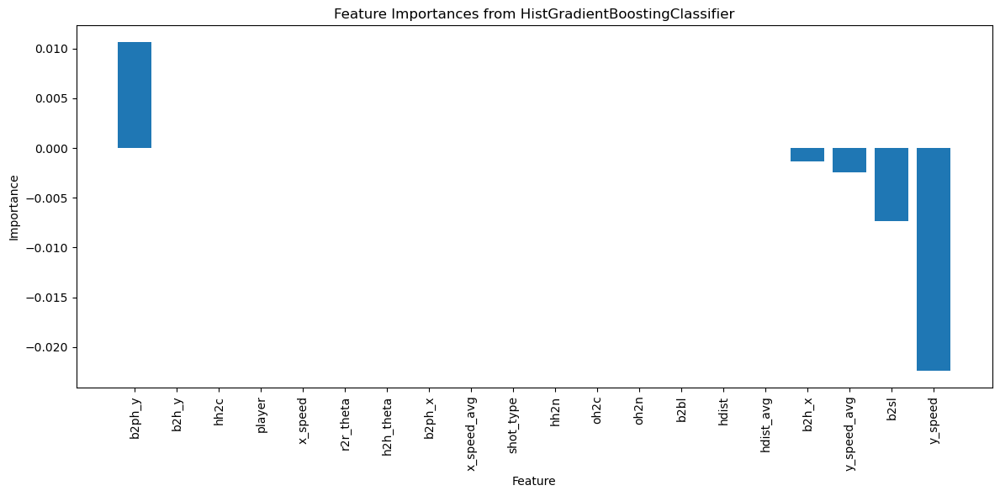

In [418]:
from sklearn.experimental import enable_hist_gradient_boosting  # noqa
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.inspection import permutation_importance


#result = permutation_importance(hgb_classifier, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)
result = permutation_importance(xgb_model, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get the importances and their corresponding indices
importances = result.importances_mean
indices = np.argsort(importances)[::-1]

# Create a bar chart
plt.figure(figsize=(12, 6))
plt.bar(range(len(importances)), importances[indices], align='center')
plt.xticks(range(len(importances)), X_train.columns[indices].values, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances from HistGradientBoostingClassifier')
plt.tight_layout()
plt.show()


In [419]:
#!pip install shap
!pip install --upgrade shap

python(65741) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 6.5 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: shap
    Found existing installation: shap 0.45.1
    Uninstalling shap-0.45.1:
      Successfully uninstalled shap-0.45.1


In [420]:
import shap
from shap import TreeExplainer

# Create the TreeExplainer
explainer = TreeExplainer(xgb_model, data=X_train)

# Calculate SHAP values
shap_values = explainer.shap_values(X_train)


if isinstance(shap_values, list):
    shap_values_array = shap_values[0]  # Using SHAP values for the first class for illustration
else:
    shap_values_array = shap_values

# Convert to Explanation object
shap_values = shap.Explanation(values=shap_values_array, base_values=explainer.expected_value[0], data=X_train)
shap_values.values.shape

(366, 20, 3)

In [421]:
pos_idx = np.where(y_train == 0)[0]
pos_idx

array([  5,  30,  44,  60,  73, 159, 182, 189, 200, 217, 250, 284, 290,
       291, 343, 350])

In [422]:
y_train.values[:,0]

array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 2,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 2, 2,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 0, 1, 1,
       2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 2, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1,
       1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 2, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [423]:
X_train_v1 = X_train.reset_index(drop=True)
pos_idx_0 = X_train_v1[(X_train_v1.player==0) & (y_train.values[:,0]==0)].index.values
pos_idx_1 = X_train_v1[(X_train_v1.player==1) & (y_train.values[:,0]==0)].index.values
idx_0 = X_train_v1[(X_train_v1.player==0)].index.values
idx_1 = X_train_v1[(X_train_v1.player==1)].index.values
pos_idx, pos_idx_0, pos_idx_1

(array([  5,  30,  44,  60,  73, 159, 182, 189, 200, 217, 250, 284, 290,
        291, 343, 350]),
 array([ 73, 182, 284, 290, 291, 343, 350]),
 array([  5,  30,  44,  60, 159, 189, 200, 217, 250]))

In [424]:
pos_idx0 = np.where(y_train == 0)[0]
pos_idx1 = np.where(y_train == 1)[0]
pos_idx2 = np.where(y_train == 2)[0]
shap_values[pos_idx0].mean(axis=0).sum(axis=0).values, shap_values[pos_idx1].mean(axis=0).sum(axis=0).values, shap_values[pos_idx2].mean(axis=0).sum(axis=0).values

(array([ 0.45,  0.  , -0.06]),
 array([0.  , 0.  , 0.01]),
 array([-0.07,  0.  ,  0.12]))

In [425]:
idx = 0
list(reversed(X_train.columns[np.argsort(shap_values[eval(f'pos_idx{idx}')].values.mean(axis=0)[:,idx])]))

['y_speed',
 'b2ph_y',
 'b2sl',
 'b2h_x',
 'hdist_avg',
 'y_speed_avg',
 'player',
 'x_speed',
 'r2r_theta',
 'h2h_theta',
 'b2ph_x',
 'b2h_y',
 'x_speed_avg',
 'hh2c',
 'hh2n',
 'oh2c',
 'oh2n',
 'b2bl',
 'hdist',
 'shot_type']

In [426]:
def naninfmean(x):
    finite_values = np.abs(x[np.isfinite(x)])
    return np.nanmean(finite_values) if len(finite_values) > 0 else np.nan

In [427]:
shap_values_0 = shap_values[pos_idx_0].mean(axis=0)
shap_values_1 = shap_values[pos_idx_1].mean(axis=0)
shap_values_0.base_values = shap_values[pos_idx_0].base_values.mean()
shap_values_1.base_values = shap_values[pos_idx_1].base_values.mean()
shap_values_0.data = np.nanmean(np.abs(shap_values[pos_idx_0].data), axis=0)
shap_values_1.data = np.nanmean(np.abs(shap_values[pos_idx_1].data), axis=0)

In [428]:
#shap_values[pos_idx0].values.sum(axis=1), shap_values[pos_idx1].values.sum(axis=1),  shap_values[pos_idx0].base_values

In [429]:
shap_values[pos_idx0].values[:,:,0].sum(axis=1).mean().round(2), shap_values[pos_idx1].values[:,:,1].sum(axis=1).mean().round(2), \
shap_values[pos_idx2].values[:,:,2].sum(axis=1).mean().round(2), shap_values[pos_idx0].base_values.round(2)

(0.45, 0.0, 0.12, 0.33)

In [430]:
shap_values_0[:,0].values, shap_values_0[:,0].data, X_train.columns[list(reversed(np.argsort(shap_values_0[:,0].values)))]

(array([0.  , 0.  , 0.  , 0.24, 0.  , 0.  , 0.  , 0.09, 0.03, 0.  , 0.  ,
        0.  , 0.  , 0.  , 0.08, 0.  , 0.  , 0.01, 0.  , 0.  ]),
 array([ 0.57,  0.  ,  5.57, 63.43,  6.6 ,  3.46,  3.9 , 17.78,  2.63,
        19.88,  6.57, 45.53,  4.27, 41.  , 10.03, 16.98,  8.2 ,  7.3 ,
         5.56, 66.43]),
 Index(['y_speed', 'b2ph_y', 'b2sl', 'b2h_x', 'hdist_avg', 'y_speed_avg',
        'player', 'x_speed', 'r2r_theta', 'h2h_theta', 'b2ph_x', 'b2h_y',
        'x_speed_avg', 'hh2c', 'hh2n', 'oh2c', 'oh2n', 'b2bl', 'hdist',
        'shot_type'],
       dtype='object'))

In [431]:
shap_values_1[:,0].values, shap_values_1[:,0].data, X_train.columns[list(reversed(np.argsort(shap_values_1[:,0].values)))]

(array([0.  , 0.  , 0.  , 0.31, 0.  , 0.  , 0.  , 0.11, 0.02, 0.  , 0.  ,
        0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.  , 0.  , 0.  ]),
 array([ 0.33,  1.  ,  7.56, 52.11,  8.38,  3.03, 10.41, 22.04,  9.78,
        20.02,  6.11, 40.79,  5.04, 41.57,  6.62, 16.76, 10.25,  8.79,
         7.81, 64.73]),
 Index(['y_speed', 'b2ph_y', 'b2h_x', 'b2sl', 'hdist_avg', 'y_speed_avg',
        'player', 'x_speed', 'r2r_theta', 'h2h_theta', 'b2ph_x', 'b2h_y',
        'x_speed_avg', 'hh2c', 'hh2n', 'oh2c', 'oh2n', 'b2bl', 'hdist',
        'shot_type'],
       dtype='object'))

In [432]:
np.argmax(shap_values[pos_idx_0].values[:,:,0], axis=1), np.argmax(shap_values[pos_idx_1].values[:,:,0], axis=1)

(array([14,  3, 14,  3,  3,  3, 14]), array([7, 7, 3, 3, 3, 0, 3, 3, 3]))

In [433]:
X_train.columns[np.argmax(shap_values[pos_idx_0].values[:,:,0], axis=1)], \
X_train.columns[np.argmax(shap_values[pos_idx_1].values[:,:,0], axis=1)]

(Index(['b2sl', 'y_speed', 'b2sl', 'y_speed', 'y_speed', 'y_speed', 'b2sl'], dtype='object'),
 Index(['b2ph_y', 'b2ph_y', 'y_speed', 'y_speed', 'y_speed', 'shot_type',
        'y_speed', 'y_speed', 'y_speed'],
       dtype='object'))

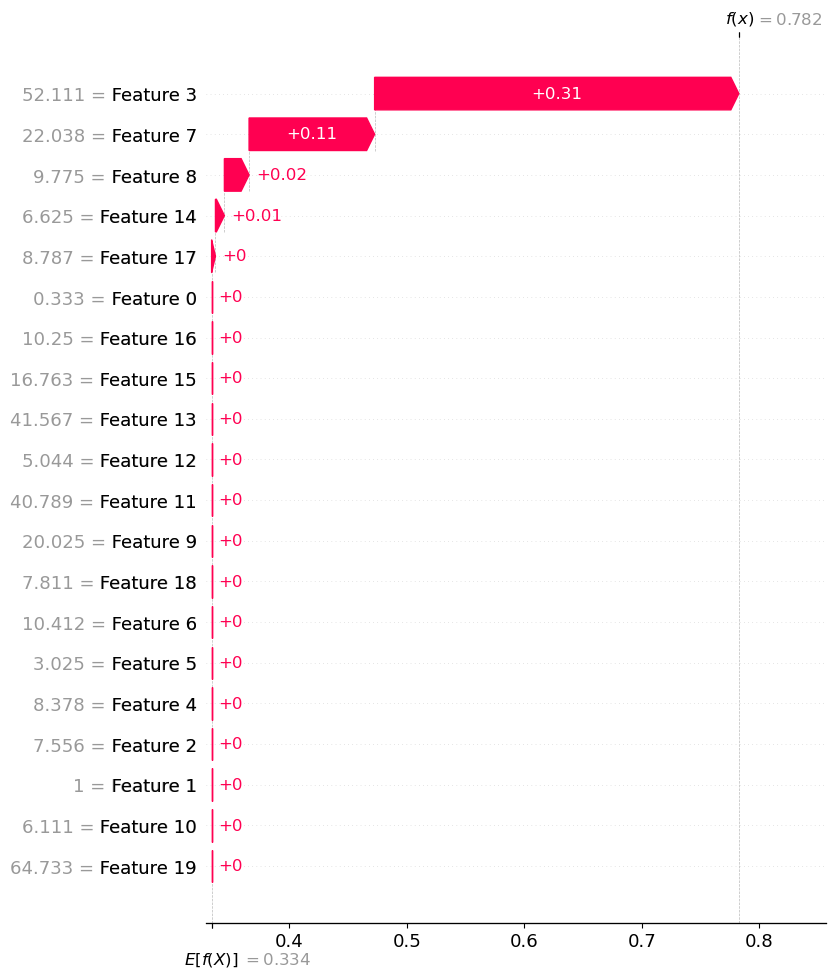

In [434]:
shap.plots.waterfall(shap_values_1[:,0], max_display=22)
#shap.plots.waterfall(shap_values[74,:,0], max_display=22)

In [435]:
# plt.hist(all_points_final_df.theta_cov[all_points_final_df.theta_cov.map(np.isfinite)], bins=30, edgecolor='black')
# plt.show()

In [436]:
all_points_final_df.groupby(['player', 'result_final']).agg(naninfmean).T

player              gray                                red              \
result_final           L           R          W           L           R   
clip_num      116.375000  101.785000  80.454545  116.000000  101.004975   
x_speed         5.500000    8.583756   7.318182    9.700000   10.135000   
y_speed        61.875000   69.653061  68.590909   55.300000   76.472637   
r2r_theta       6.614286    7.376471   9.533333    8.520000    8.965318   
h2h_theta       3.460000    1.973054   1.665000    2.955556    3.024138   
b2ph_x          3.900000    8.926347  11.900000    9.822222   10.635057   
b2h_x           2.633333    7.737436  10.819048    8.900000    8.313930   
b2ph_y         17.780000   17.667066  15.250000   23.800000   17.319540   
b2h_y          19.883333   19.469744  16.609524   21.766667   19.225871   
hh2c            7.300000    6.886935   6.700000    7.140000    6.231841   
hh2n           46.225000   43.598492  44.045455   41.290000   41.812438   
oh2c            4.212500    5.498000   5.540909    4.860000    5.089552   
oh2n           39.462500   42.628500  42.004545   40.920000   44.463682   
b2sl           10.033333    7.046154   6.138095    7.244444    6.488557   
b2bl           16.983333   15.515897  12.423810   19.300000   13.898507   
hdist          10.666667   10.954839  10.600000   12.000000    9.031646   
hdist_avg       8.866667   10.947973  11.315000   10.700000    9.405128   
x_speed_avg     5.737500    7.857895   7.763636    8.780000    8.945251   
y_speed_avg    65.587500   64.615789  68.063636   66.360000   72.665922   
r2r_theta_f1   15.650000    9.002020  10.145455   19.290000    7.637000   

player                   
result_final          W  
clip_num      76.705882  
x_speed       12.117647  
y_speed       75.294118  
r2r_theta      9.746667  
h2h_theta      2.526667  
b2ph_x         9.186667  
b2h_x          9.800000  
b2ph_y        18.106667  
b2h_y         18.294118  
hh2c           7.041176  
hh2n          40.664706  
oh2c           4.329412  
oh2n          45.176471  
b2sl           5.064706  
b2bl          12.576471  
hdist         11.928571  
hdist_avg     10.735714  
x_speed_avg   10.447059  
y_speed_avg   75.170588  
r2r_theta_f1  10.368750

In [437]:
#all_points_final_df.groupby(['player', 'side']).agg(naninfmean).T

In [438]:
sample_index = 44  # change this index to choose a different sample
def plot_shap_waterfall(shap_values, sample_idx, figsize=(5,3)):
    sample_shap_values = shap_values[sample_index]
    #print(f'{y_train.iloc[sample_index].name}')
    shap.plots.waterfall(sample_shap_values, max_display=22, show=False)
    fig = plt.gcf()
    fig.set_size_inches(6, 6)  # Adjust the width and height as needed
    plt.title(f'{y_train.iloc[sample_index].name}')
    plt.show()
plot_shap_waterfall(shap_values, sample_index)

ValueError: The waterfall plot can currently only plot a single explanation, but a matrix of explanations (shape (20, 3)) was passed! Perhaps try `shap.plots.waterfall(shap_values[0])` or for multi-output models, try `shap.plots.waterfall(shap_values[0, 0])`.

In [439]:
# for a,b in zip(y_test_pred, y_test.values[:,0]):
#     print(a,b)

In [440]:
#all_points_df[['clip_num']+y_attribs+x_attribs]

In [441]:
# img_name1, img_name2 = 'img_94605.jpg', 'img_94640.jpg'
# compute_max_speed_v2(df, img_name1, img_name2, f1_offsets=6, dist_func=x_dist, plot_chart=False, f2_type='B', ret_ends=True)

In [442]:
plot_shot(results_df, 'img_20957.jpg','img_20990.jpg',(255,0,0),3,3)
#results_df.loc['img_103906.jpg':'img_103944.jpg',['x','y','f_heels','n_heels']]

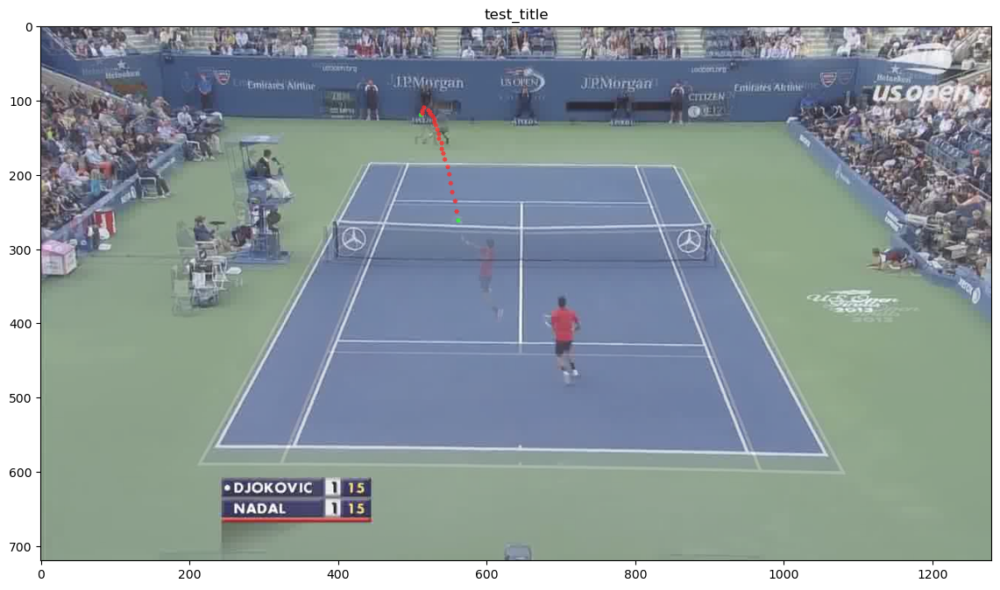

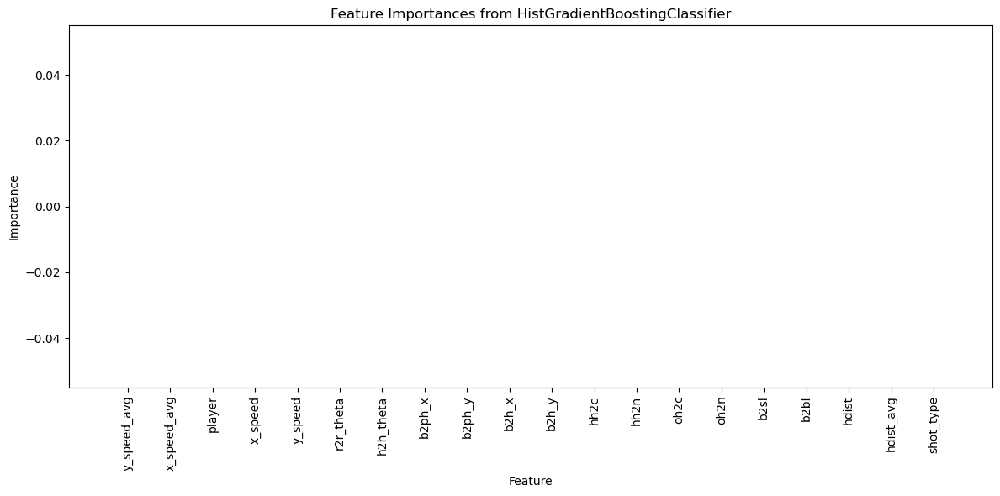

In [443]:
from sklearn.experimental import enable_hist_gradient_boosting  # noqa
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.inspection import permutation_importance


result = permutation_importance(hgb_classifier, X_train, y_train, n_repeats=10, random_state=42, n_jobs=-1)

# Get the importances and their corresponding indices
importances = result.importances_mean
indices = np.argsort(importances)[::-1]

# Create a bar chart
plt.figure(figsize=(12, 6))
plt.bar(range(len(importances)), importances[indices], align='center')
plt.xticks(range(len(importances)), X_train.columns[indices].values, rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances from HistGradientBoostingClassifier')
plt.tight_layout()
plt.show()


In [444]:
X_train.columns[indices].values

array(['y_speed_avg', 'x_speed_avg', 'player', 'x_speed', 'y_speed',
       'r2r_theta', 'h2h_theta', 'b2ph_x', 'b2ph_y', 'b2h_x', 'b2h_y',
       'hh2c', 'hh2n', 'oh2c', 'oh2n', 'b2sl', 'b2bl', 'hdist',
       'hdist_avg', 'shot_type'], dtype=object)